In [ ]:
# !git clone https://github.com/beesk135/ReLeaSE.git
import os
import sys
sys.path.append('/content/ReLeaSE')

In [ ]:
# !conda create -n release python=3.6
# !source activate release
!nvidia-smi

Sat Aug 29 22:25:40 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.66       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P8    10W /  70W |     10MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
os.chdir("/content/ReLeaSE")

In [ ]:
# # same
# !wget -c https://repo.anaconda.com/miniconda/Miniconda3-4.5.4-Linux-x86_64.sh
# !chmod +x Miniconda3-4.5.4-Linux-x86_64.sh
# !bash ./Miniconda3-4.5.4-Linux-x86_64.sh -b -f -p /usr/local
# # update 1
# !conda install -q -y --prefix /usr/local python=3.6 ujson
# # update 2
import sys
sys.path.append('/usr/local/lib/python3.6/site-packages')
sys.path.append('/content/ReLeaSE')
# # test it
# import ujson
# print(ujson.dumps({1:2}))

In [ ]:
!conda update -n base conda

Solving environment: - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / - \ | / done

## Package Plan ##

  environment location: /usr/local

  added / updated specs: 
    - conda


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    conda-4.8.4                |           py36_0         3.0 MB
    tqdm-4.48.2                |             py_0          63 KB
    urllib3-1.25.10            |             py_0          93 KB
    requests-2.24.0            |             py_0          54 KB
    brotlipy-0.7.0       

In [ ]:
# # Create new conda environment with Python 3.6
os.chdir('/content/ReLeaSE')
!conda create -n release python=3.6
# # Activate the environment
!source activate release
# # Install conda dependencies
!conda install --yes --file conda_requirements.txt
!conda install -c rdkit rdkit nox cairo
# # rdkit nox could not be installed on windows
!conda install pytorch=0.4.1 torchvision=0.2.1 -c pytorch
# # Instal pip dependencies
!pip install -r pip_requirements.txt
# # Add new kernel to the list of jupyter notebook kernels
!python -m ipykernel install --user --name release --display-name ReLeaSE

Remove existing environment (y/[n])? n


CondaSystemExit: Exiting.

Solving environment: - \ | / - \ | / - \ | / - \ | / - \ | done

## Package Plan ##

  environment location: /usr/local

  added / updated specs:
    - ipykernel
    - ipython
    - numpy
    - pytest
    - pytest-cov
    - scikit-learn==0.20.2
    - scipy
    - seaborn==0.9.0


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    iniconfig-1.0.1            |             py_0           8 KB
    pytest-6.0.1               |           py36_0         424 KB
    toml-0.10.1                |             py_0          20 KB
    ------------------------------------------------------------
                                           Total:         452 KB

The following NEW packages will be INSTALLED:

  iniconfig          pkgs/main/noarch::iniconfig-1.0.1-py_0
  toml               pkgs/main/noarch

In [ ]:
# !python -m ipykernel install --user --name release --display-name ReLeaSE
!conda install -c rdkit rdkit


Solving environment: \ | / - \ | / - \ | / - \ | / - \ | done

# All requested packages already installed.



# JAK2 activity optimization with ReLeaSE algorithm

In this experiment we will optimized parameters of pretrained generative RNN to produce molecules with maximized and minimized pIC50 for JAK2. We use policy gradient algorithm with custom reward function to bias the properties of generated molecules aka Reinforcement Learninf for Structural Evolution (ReLeaSE) as was proposed in **Popova, M., Isayev, O., & Tropsha, A. (2018). *Deep reinforcement learning for de novo drug design*. Science advances, 4(7), eaap7885.** 

## Imports

In [ ]:
%env CUDA_VISIBLE_DEVICES=0

env: CUDA_VISIBLE_DEVICES=0


In [ ]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
import sys

In [ ]:
# sys.path.append('./release/')
sys.path.append('/content/ReLeaSE/release')

# /content/ReLeaSE/release

In [ ]:
import torch
import torch.nn as nn
from torch.optim.lr_scheduler import ExponentialLR, StepLR
import torch.nn.functional as F

In [ ]:
use_cuda = torch.cuda.is_available()

In [ ]:
use_cuda

True

In [ ]:
import numpy as np
from tqdm import tqdm, trange
import pickle
from rdkit import Chem, DataStructs
from stackRNN import StackAugmentedRNN
from data import GeneratorData
from utils import canonical_smiles

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


## Setting up the generator

### Loading data for the generator

In [ ]:
# gen_data_path = './data/chembl_22_clean_1576904_sorted_std_final.smi'
gen_data_path =  './data/test1.smi'

In [ ]:
tokens = ['<', '>', '#', '%', ')', '(', '+', '-', '/', '.', '1', '0', '3', '2', '5', '4', '7',
          '6', '9', '8', '=', 'A', '@', 'C', 'B', 'F', 'I', 'H', 'O', 'N', 'P', 'S', '[', ']',
          '\\', 'c', 'e', 'i', 'l', 'o', 'n', 'p', 's', 'r', '\n']

In [ ]:
!shuf /content/ReLeaSE/data/chembl_22_clean_1576904_sorted_std_final.smi | head -n 1000 > /content/ReLeaSE/data/test1.smi

In [ ]:
gen_data = GeneratorData(training_data_path=gen_data_path, delimiter='\t', 
                         cols_to_read=[0], keep_header=True, tokens=tokens)

## Util functions

**plot_hist** function plots histogram of predicted properties and a vertical line for thershold.

In [ ]:
def plot_hist(prediction, n_to_generate):
    print("Mean value of predictions:", sum(prediction)/len(prediction))
    print("Proportion of valid SMILES:", len(prediction)/n_to_generate)
    ax = sns.kdeplot(prediction, shade=True)
    ax.set(xlabel='Predicted pIC50', 
           title='Distribution of predicted pIC50 for generated molecules')
    plt.show()

**estimate_and_update** function:

1) generates n_to_generate number of SMILES strings

2) filters invalid SMILES

3) predicts pIC50 for valid SMILES

4) plots histogram of predicted pIC50

5) Returns valid SMILES and their predicted pIC50s

In [ ]:
def estimate_and_update(generator, predictor, n_to_generate, **kwargs):
    generated = []
    pbar = tqdm(range(n_to_generate))
    for i in pbar:
        pbar.set_description("Generating molecules...")
        generated.append(generator.evaluate(gen_data, predict_len=120)[1:-1])

    sanitized = canonical_smiles(generated, sanitize=False, throw_warning=False)[:-1]
    unique_smiles = list(np.unique(sanitized))[1:]
    smiles, prediction, nan_smiles = predictor.predict(unique_smiles, get_features=get_fp)  
                                                       
    plot_hist(prediction, n_to_generate)
        
    return smiles, prediction

## Initializing and training the generator

We will used stack augmented generative GRU as a generator. The model was trained to predict the next symbol from SMILES alphabet using the already generated prefix. Model was trained to minimize the cross-entropy loss between predicted symbol and ground truth symbol. Scheme of the generator when inferring new SMILES is shown below:

<img src="./figures/generator.png">

In [ ]:
hidden_size = 1500
stack_width = 1500
stack_depth = 200
layer_type = 'GRU'
lr = 0.001
optimizer_instance = torch.optim.Adadelta

my_generator = StackAugmentedRNN(input_size=gen_data.n_characters, hidden_size=hidden_size,
                                 output_size=gen_data.n_characters, layer_type=layer_type,
                                 n_layers=1, is_bidirectional=False, has_stack=True,
                                 stack_width=stack_width, stack_depth=stack_depth, 
                                 use_cuda=use_cuda, 
                                 optimizer_instance=optimizer_instance, lr=lr)

If you want train the model from scratch, uncomment the lines below:

In [ ]:
model_path = './checkpoints/generator/checkpoint_biggest_rnn'

In [ ]:
#losses = my_generator.fit(gen_data, 1500000)

In [ ]:
#plt.plot(losses)

In [ ]:
#my_generator.evaluate(gen_data)

In [ ]:
#my_generator.save_model(model_path)

In [ ]:
# !"C://Program Files/NVIDIA Corporation/NVSMI/nvidia-smi.exe"

/bin/bash: C://Program Files/NVIDIA Corporation/NVSMI/nvidia-smi.exe: No such file or directory


Alternatively, you can skip the process of training and load the pretrained parameters into the model:

In [ ]:
my_generator.load_model(model_path)

## Setting up the predictor

For this demo we will use Random Forest predictor instead of Recurrent Neural Network, since the availability of the dataset with JAK2 activity data used in the "Deep Reinforcement Learning for de novo Drug Design" paper is restricted under the license agreement. Here instead we use the JAK2 activity data downladed from ChEMBL. The size of this dataset is ~2000 data points, which is not enough to build a reliable deep neural network. Is you want to see a demo with RNN, please checkout logP optimization demo. 

In [ ]:
from data import PredictorData
from utils import get_desc, get_fp
from mordred import Calculator, descriptors

In [ ]:
calc = Calculator(descriptors, ignore_3D=True)

In [ ]:
pred_data = PredictorData(path='./data/jak2_data.csv', get_features=get_fp)

In [ ]:
from predictor import VanillaQSAR
from sklearn.ensemble import RandomForestRegressor as RFR

/usr/local/lib/python3.6/dist-packages/sklearn/externals/joblib/__init__.py:15: FutureWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
model_instance = RFR
model_params = {'n_estimators': 250, 'n_jobs': 10}

In [ ]:
my_predictor = VanillaQSAR(model_instance=model_instance,
                           model_params=model_params,
                           model_type='regressor')

In [ ]:
my_predictor.fit_model(pred_data, cv_split='random')

([0.6652739072671922,
  0.7123597829720921,
  0.6710138541496817,
  0.6434134159455442,
  0.6680631362957687],
 'R^2 score')

Here we produce the unbiased distribution of the property:

Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]/content/ReLeaSE/release/data.py:98: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(tensor).cuda()
Generating molecules...: 100%|██████████| 10/10 [00:00<00:00, 10.34it/s]


Mean value of predictions: 6.77261361749117
Proportion of valid SMILES: 0.7


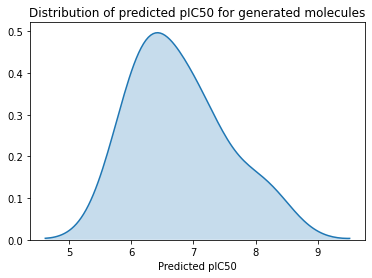

In [ ]:
smiles_unbiased, prediction_unbiased = estimate_and_update(my_generator,
                                                           my_predictor,
                                                           n_to_generate=10)

## Biasing the distribution of the generator with reinforcement learning (policy gradient)

We combine the generator and the predictor into a single pipeline. The generator produces new SMILES string, which is then evaluated by the predictor. Based on the obtain prediction and our goal, we assign a numerical reward value and update the parameters of the generator using policy gradient algorithm.

<img src="./figures/rl_pipeline.png">

Policy gradient loss is defined as:
$$
L(S|\theta) = -\dfrac{1}{n}\sum_{i=1}^{|S|} \sum_{j=1}^{length(s_i)} R_i\cdot \gamma^i \cdot \log p(s_i|s_0 \dots s_{i-1}\theta),
$$

where $R_i$ is the reward obtained at time step $i$ $\gamma$ is the discount factor and $p(s_i|s_0 \dots s_{i-1}, \theta)$ is the probability of the next character given the prefix, which we obtain from the generator. 

In our case the reward is the same for every time step and is equal to the reward for the whole molecule. Discount factor $\gamma$ is a number close to $1.0$ (it could be $1.0$).

### Maximizing pIC50 for JAK2

In [ ]:
from reinforcement import Reinforcement

Making a copy of the generator that will be optimized

In [ ]:
my_generator_max = StackAugmentedRNN(input_size=gen_data.n_characters, 
                                     hidden_size=hidden_size,
                                     output_size=gen_data.n_characters, 
                                     layer_type=layer_type,
                                     n_layers=1, is_bidirectional=False, has_stack=True,
                                     stack_width=stack_width, stack_depth=stack_depth, 
                                     use_cuda=use_cuda, 
                                     optimizer_instance=optimizer_instance, lr=lr)

my_generator_max.load_model(model_path)

In [ ]:
# Setting up some parameters for the experiment
n_to_generate = 10
n_policy_replay = 10
n_policy = 5
n_iterations = 100

In [ ]:
def simple_moving_average(previous_values, new_value, ma_window_size=10):
    value_ma = np.sum(previous_values[-(ma_window_size-1):]) + new_value
    value_ma = value_ma/(len(previous_values[-(ma_window_size-1):]) + 1)
    return value_ma

In [ ]:
def get_reward_max(smiles, predictor, invalid_reward=0.0, get_features=get_fp):
    mol, prop, nan_smiles = predictor.predict([smiles], get_features=get_features)
    if len(nan_smiles) == 1:
        return invalid_reward
    return np.exp(prop[0]/3)

The reward function we will use here is 
$$
R(s) = \exp(\dfrac{predictor(s)}{3}) 
$$

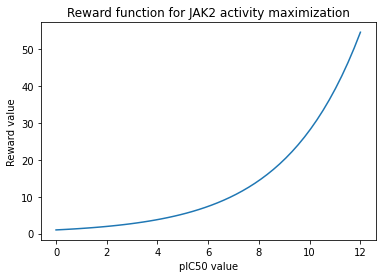

In [ ]:
x = np.linspace(0, 12)
y = np.exp(x/3)
plt.plot(x, y)
plt.xlabel('pIC50 value')
plt.ylabel('Reward value')
plt.title('Reward function for JAK2 activity maximization')
plt.show()

In [ ]:
RL_max = Reinforcement(my_generator_max, my_predictor, get_reward_max)

In [ ]:
import warnings
warnings.filterwarnings(action='once')


In [ ]:
rewards_max = []
rl_losses_max = []






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]




Policy gradient...:  20%|██        | 1/5 [00:08<00:32,  8.15s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.09s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.04s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.94s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.96s/it]


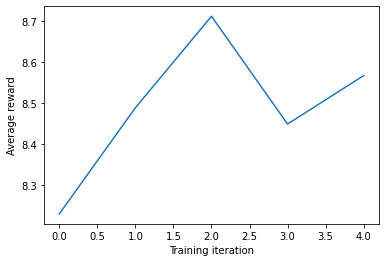

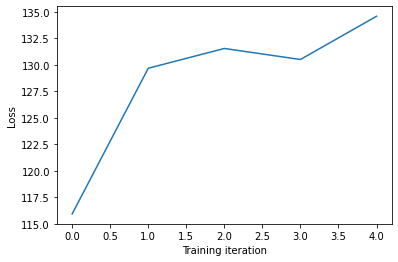






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.36it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.36it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 12.68it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 12.68it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 12.68it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 13.79it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 13.79it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 13.79it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 14.53it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 14.53it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00

Mean value of predictions: 6.586916994315557
Proportion of valid SMILES: 0.7


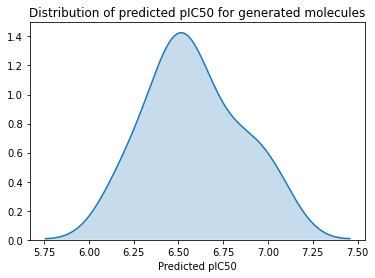






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)CCn1ccc2cc(NC(=O)NC3CCCCC3)ccc21
CC(CC(=O)NCCS(=O)(=O)O)c1ccc(Cl)cc1
CCCC(=O)OC1C(=O)C(c2ccc(OC)cc2)OC2OC(CO)C(O)C(O)C21O
COc1ccc(N(C)C(=O)c2ccc(Oc3cccc(Cl)c3)c(N(=O)=O)n2)cc1Cl
COc1ccnc(NC(=O)NC2CCS(=O)(=O)C2)c1







Policy gradient...:  20%|██        | 1/5 [00:08<00:34,  8.60s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:25,  8.45s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.32s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.18s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.14s/it]


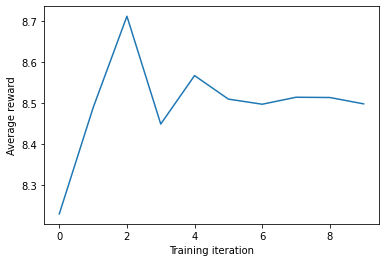

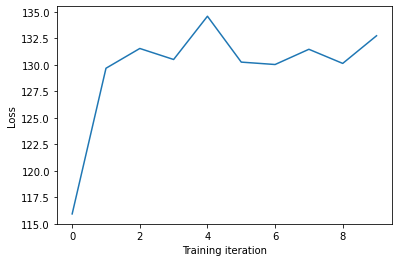






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.68it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.68it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.68it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.76it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.76it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.76it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.25it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.25it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.25it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 14.75it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.567348533117074
Proportion of valid SMILES: 0.7


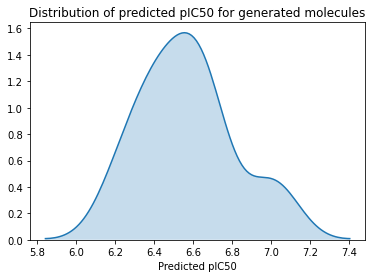






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCOC(=O)c1cc(OC)ccc1OCC(=O)Nc1ccccc1C(F)(F)F
COc1ccc(C(=O)Nc2ccc(CC(=O)O)c(C)c2)cc1OC
COc1ncc(CNC(=O)c2cccc(C(N)=O)c2)c(C)c1C
C[N+](C)(C)CCOCCOCOC(=O)CCc1ccccc1
Cc1ccc(N2CCCC2)c(OC(=O)C2CCCCN2c2ncc3ccccc3n2)c1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.73s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.83s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.93s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.90s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.01s/it]


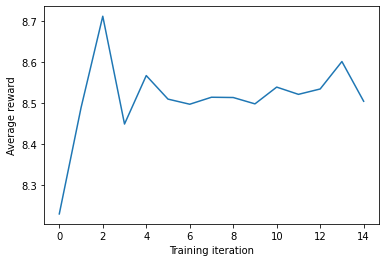

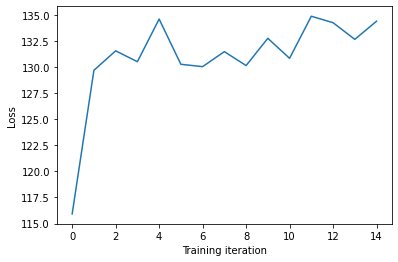






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 11.96it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 11.96it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 11.96it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 11.29it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 11.29it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 11.29it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 11.90it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 11.90it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 11.90it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 13.24it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.615440627843312
Proportion of valid SMILES: 0.6


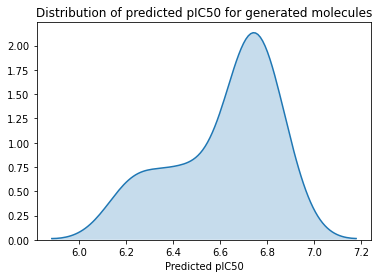






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCN1C(=O)CSC(c2ccc(OC)cc2)C1=O
CCN1CCN(c2ncnc3c2nc(C2CCCN2C(=O)OC(C)(C)C)n3CCC#N)CC1
CNc1nc(Nc2ccc(C)cc2)nc(N)c1-c1nc(C)nn1C
COC(=O)CCCCNC(=O)C(NC(=O)CNC(=O)c1ccccc1)C(C)(C)C
COC(C)CC(NC(C)=O)C(O)C[SH](=O)=CC(=O)N1CCCCC1







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.98s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.02s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.19s/it]




Policy gradient...:  80%|████████  | 4/5 [00:33<00:08,  8.27s/it]




Policy gradient...: 100%|██████████| 5/5 [00:41<00:00,  8.22s/it]


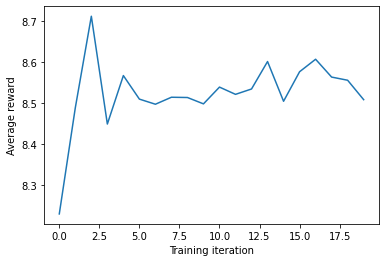

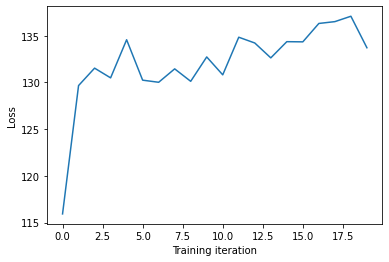






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.96it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.96it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.96it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.53it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.53it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.53it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.98it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.98it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.41it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.41it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00

Mean value of predictions: 6.302371217203367
Proportion of valid SMILES: 0.8


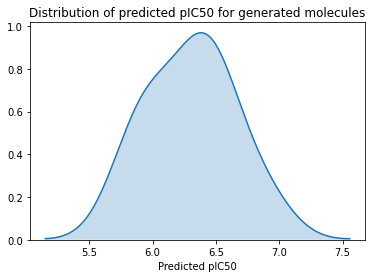






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=Cc1cn(C)cc1C1CCN(Cc2ccccc2C(F)(F)F)CC1)C(=O)O
CC1CCC(OC2OC(CO)C(O)C(C3CC(O)CN3CCCNC(=O)C(Cc3ccccc3)NC(=O)C(Cc3ccccc3)NC3CCCCC3)OC2CO)CC1
CCN(CC)CC(=O)Nc1ccccc1
COCCN(C(=O)Nc1ccc(C)cc1N)C1CCC(O)(Cc2ccccc2)CC1
COc1ccccc1NC(=S)NN=C1Cc2ccccc21







Policy gradient...:  20%|██        | 1/5 [00:08<00:32,  8.14s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.15s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.10s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.12s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.06s/it]


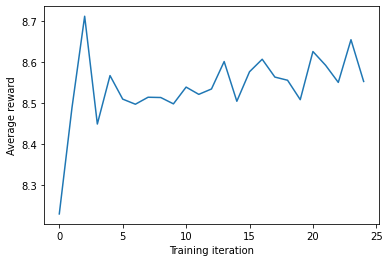

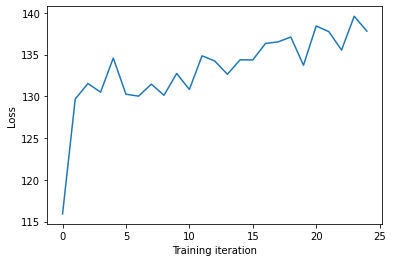






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.63it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.63it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.63it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 11.29it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 11.29it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 11.29it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.05it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.05it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.05it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 13.00it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.549871815806278
Proportion of valid SMILES: 0.7


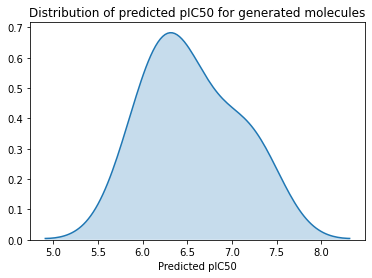






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCC(=O)c1ccc(-n2cc(C3OC(CO)C(O)C3O)nn2)cc1
CCC1(OCc2ccccc2)CCC(=O)N1Cc1ccccc1
CCCCCCCCCCCCCCCCCSC(=O)Nc1cccc(C)c1
CCOc1ccccc1NC(=O)CCCC(=O)N1CCOCC1
CN1CCC(Cn2cncn2)(c2nc3ccc(-c4cc(C(F)(F)F)ccn4)cc3[nH]2)CC1







Policy gradient...:  20%|██        | 1/5 [00:08<00:32,  8.02s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.03s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.99s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.01s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  8.00s/it]


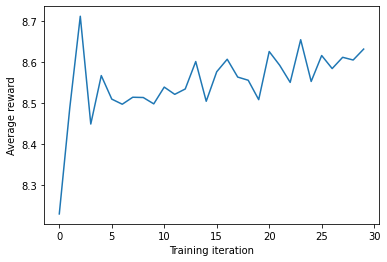

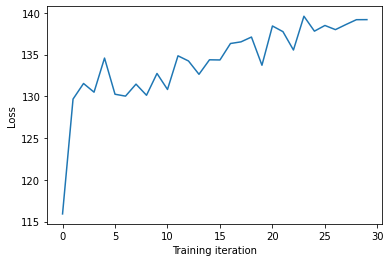






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.06it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.06it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.06it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.91it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.91it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.91it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.06it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.06it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.06it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 14.92it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.348927975672024
Proportion of valid SMILES: 0.5


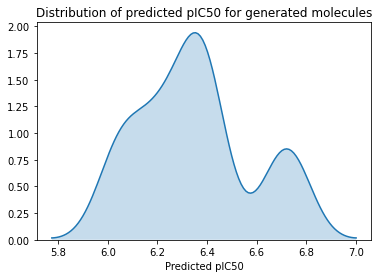






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC1CCC(N2CCc3c(ncn3CCCN(C)C)C2)CC1
CCCCCCc1onc(-c2ccc(C(C)(C)C)cc2)c1C
CCOc1ccc(CN2c3ccc(C=NCCN)cc3OCC2C)c(OC)c1
OC(Cn1ccnc1)C1CCCCC1
OC1=Cc2ccccc2CN1C1CCCC1







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.77s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.03s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:15,  7.93s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:07,  7.99s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.11s/it]


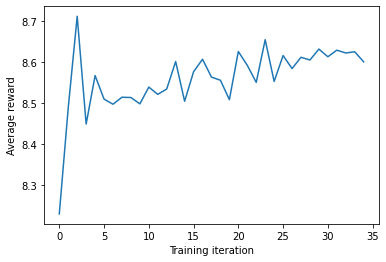

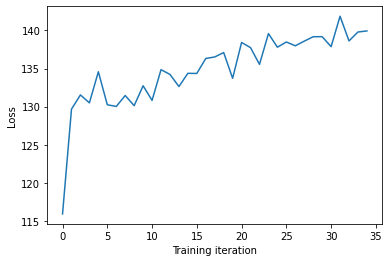






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.46it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.46it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.46it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.00it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.00it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.00it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.61it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.61it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.61it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 13.12it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.437265184141665
Proportion of valid SMILES: 0.7


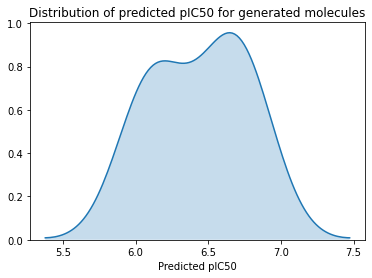






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
COc1cc(C(N)=O)nn1-c1cccc(-c2ccccc2)c1
COc1cc(CNCc2ccc(NC(=O)CCC(=O)c3ccc(N(C)C)cc3)cc2)ccc1O
COc1cccc(C(=O)NC2NC(C)=CC2=O)c1
Cc1ccc(NC(=O)N(N)CCCO)c(Cl)c1
O=C(O)C(Cc1ccc(O)c(OC(F)(F)C(F)(F)C(F)(F)F)c1)NC(=O)N1Cc2ccncc2C1







Policy gradient...:  20%|██        | 1/5 [00:08<00:32,  8.21s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.09s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.22s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.11s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.92s/it]


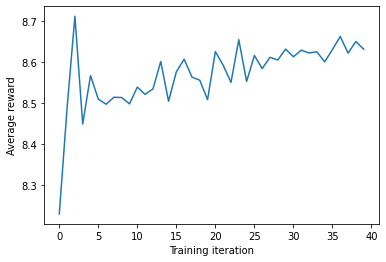

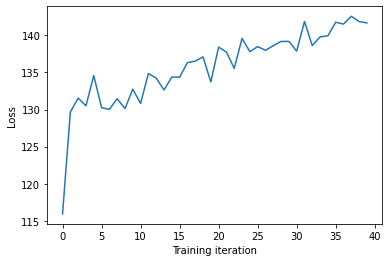






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.19it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.19it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.19it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.78it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.78it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.78it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.38it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.38it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.38it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 14.79it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.442615240092188
Proportion of valid SMILES: 0.6


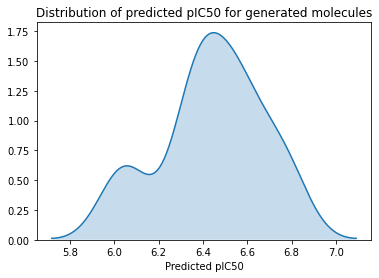






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)(C)NCC(CSCc1ccccc1)CN1CCCCC1
CCCCCN(CCCC)CC(=O)NC(CCC(N)=O)C(C)(C)C
CCOC(=O)C1CCCN(Cc2cccc(C#N)c2)C1
CNC(=O)C1=CCCC1C(=O)NC(CCCNC(=N)N)C(N)=O
O=C(NN=Cc1ccc(F)cc1)C(=O)c1ccccc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.84s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.86s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.84s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.95s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.99s/it]


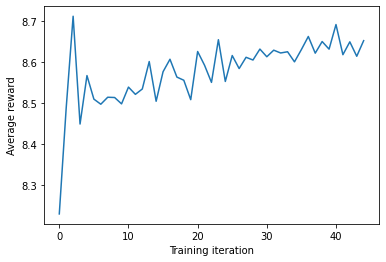

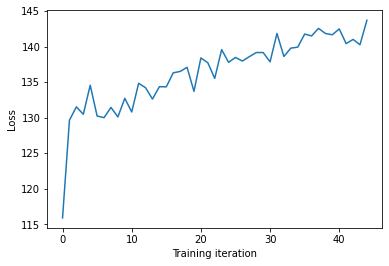






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.09it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.09it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.09it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.50it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.50it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.50it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.44it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.44it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.44it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 13.75it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.394880664780935
Proportion of valid SMILES: 0.6


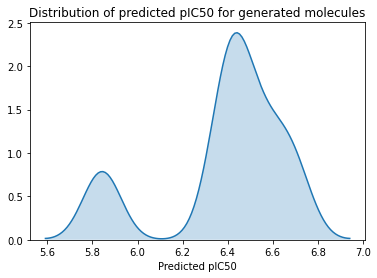






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC1=CC2=NN(c3ccccc3Cl)C(=O)c2c1C
CCC(C)NC(=O)CC(Cc1ccc(OCC(C)=O)cc1)CC(C)C
CCN1CCN(CCCCNC(=O)CN2C=CC=CN2)Cc2ccc(C#N)cc21
CCOc1cccc2c1C(Cc1ccc(NC(=O)c3ccccc3)cc1)=C(C)O2
CN(C)CCOc1cccc2cnc3ccccc3c12







Policy gradient...:  20%|██        | 1/5 [00:08<00:32,  8.22s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:24,  8.02s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.99s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.09s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.04s/it]


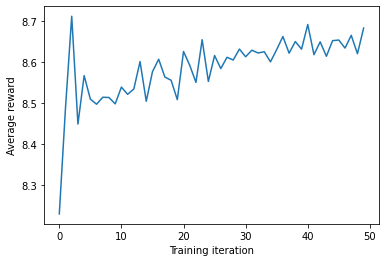

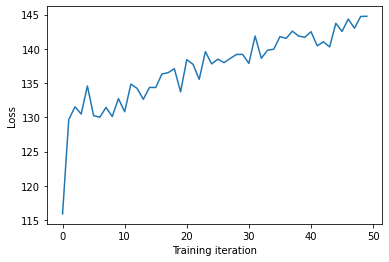






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.76it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.76it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.76it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.85it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.85it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.85it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.35it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.35it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.35it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 14.44it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.571113282739094
Proportion of valid SMILES: 0.7


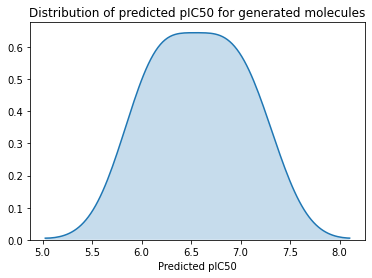






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC1CCN(CCC(CCNF)CNC(=O)OC(C)(C)C)CC(O)C2CC(OCc3ccccc3)N(C2)S1(=O)=O
CCC(C)C(NC(=O)C(NC(=O)c1ccc(NC(C)=O)cc1)C(=O)NCCc1ccccc1)C(=O)OCc1ccccc1
CCCCCCCCCCCCCCCCC(=O)O
CCCc1cc(S(=O)(=O)N2CCOCC2)ccc1-n1cnc(N2C(=O)c3ccccc3C2=O)c1
CNC(=O)c1cc(NC2CCCCC2)nc(N2CCCC2)c1







Policy gradient...:  20%|██        | 1/5 [00:08<00:34,  8.53s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:25,  8.50s/it]




Policy gradient...:  60%|██████    | 3/5 [00:25<00:17,  8.50s/it]




Policy gradient...:  80%|████████  | 4/5 [00:33<00:08,  8.24s/it]




Policy gradient...: 100%|██████████| 5/5 [00:41<00:00,  8.22s/it]


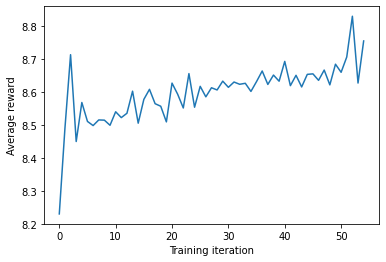

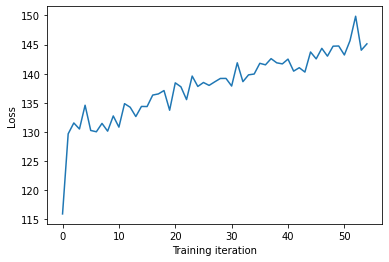






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.18it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.18it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.18it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.19it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.19it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.19it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.61it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.61it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.61it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 14.42it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.224101472829703
Proportion of valid SMILES: 0.7


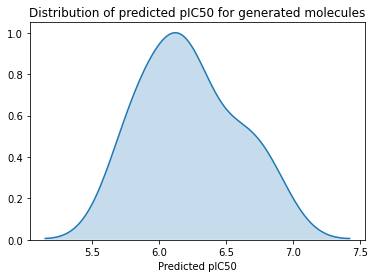






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCCc1ccccc1NC(=O)CN1N=Cc2ccccc2NC1=O
CCc1cnc(CCCc2ccccc2)n1CCCc1ccccc1
COc1ccc(NC(=O)CN2C(=O)C(OCC=C(C)C)=CC=C2C)cc1
COc1ccccc1C(C)NC(=O)CN1N=C(C)CC(C)(C)C1=O
NCCC=Cc1ccc(NS(=O)(=O)C2(c3cccc(F)c3)CC2)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.60s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.65s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.78s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.80s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.76s/it]


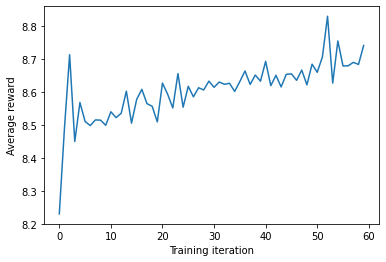

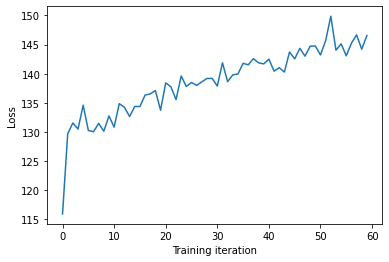






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.18it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.18it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.18it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.76it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.76it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.76it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.20it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.20it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.41it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.41it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00

Mean value of predictions: 6.449979671430316
Proportion of valid SMILES: 0.5


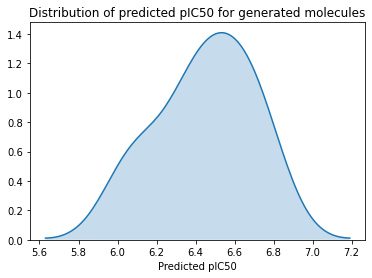






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCCCC(=O)Nc1cccc(C(=O)C2=CCCCC2)c1
CCCCOC(=O)c1cc(OC)c2c(c1O)OCO2
COCCCN(C)Cc1ccccc1C(=O)NCc1ccccc1
Cc1ccc(N2CCN(C(=O)CCC3CCCN3C(=O)C(NC(=O)OCc3ccc(NS(C)(=O)=O)cc3)NC3CCCCCCC3)CC2)cc1
Sc1nc(-c2ccccn2)nc2ccccc12







Policy gradient...:  20%|██        | 1/5 [00:08<00:32,  8.01s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.89s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.94s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.06s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.95s/it]


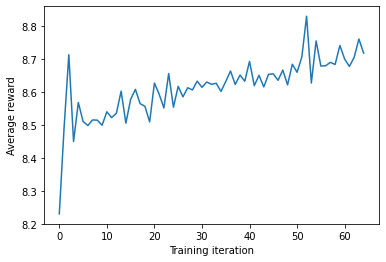

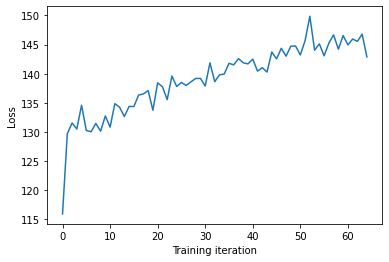






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.64it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.64it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.64it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.24it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.24it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.24it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.17it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.17it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.17it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 14.68it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.641340472717415
Proportion of valid SMILES: 0.7


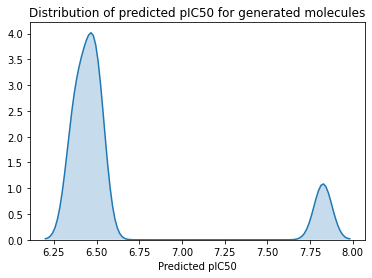






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCc1sc2nc1CC(N(=O)=O)CCN(C)C2
COc1ccc(CC(CC(=O)O)Cc2ccccc2)cc1
COc1cccc2c(nc1OC)N(C(=O)NCc1ccc(Cl)cc1Cl)CC(=O)NCC2
CS(=O)(=O)N(Cc1ccc2c(c1)OCO2)C(=O)CNC(=O)c1cccc(N(=O)=O)c1
Cc1ccc(C)c(NC(=O)N2CCCN(CC(=O)NC3(C)CCCC(C)(C)CC3)CC2)c1







Policy gradient...:  20%|██        | 1/5 [00:08<00:33,  8.46s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:25,  8.42s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.34s/it]




Policy gradient...:  80%|████████  | 4/5 [00:33<00:08,  8.40s/it]




Policy gradient...: 100%|██████████| 5/5 [00:41<00:00,  8.34s/it]


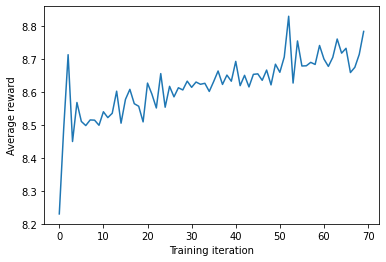

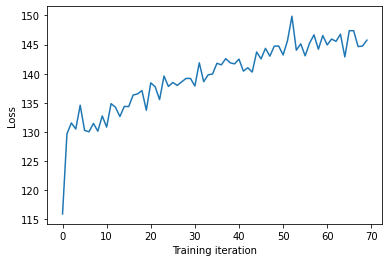






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.58it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.58it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.58it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.83it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.83it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 12.80it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 12.80it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 12.80it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 13.93it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 13.93it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00

Mean value of predictions: 6.575932879648858
Proportion of valid SMILES: 0.7


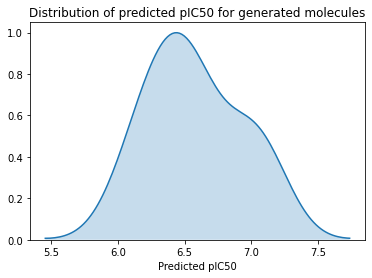






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(OC(=O)C(CCNC(C)(C)C)c1cccc(Cl)c1)C(=O)O
CCCCN(CCNC(=O)COC(C)=O)CCC(=O)NO
CCOC(=O)Cs1Oc2cc(F)ccc2S1
COCOC1OC(OC2=NC(=O)c3cc(C(C)(C)C)ccc3C23OCCC3(C)O)C(C)(O)C1C
COc1ccc(C(=O)N2CCC(C(=O)c3ccc(NC(=S)Nc4ccccc4)nc3)CC2)cc1







Policy gradient...:  20%|██        | 1/5 [00:08<00:32,  8.10s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:24,  8.04s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.95s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.88s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.86s/it]


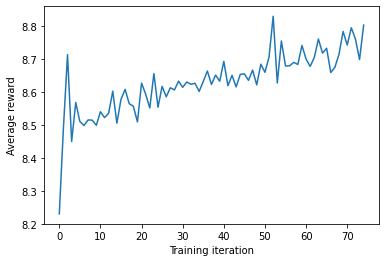

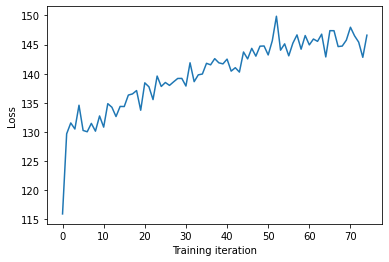






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.34it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.34it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.34it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.39it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.39it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.39it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.03it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.03it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.03it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 13.91it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.537624525912501
Proportion of valid SMILES: 0.6


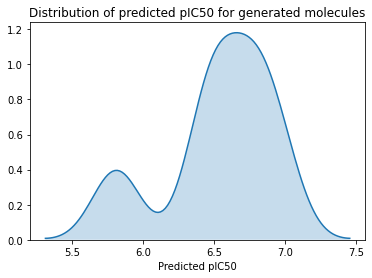






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC1CN(c2ccccc2NC(=O)CCC(=O)NCc2ccncc2)CCN1c1ccccn1
CN(Cc1ccccc1)S(=O)(=O)c1ccc2c(c1)OCCO2
Cc1cc(-c2csc(N(Cc3ccccn3)C(=O)CCC(=O)Oc3ccccc3)n2)ccc1N(C)C
Cc1ccc(S(=O)(=O)Nc2ccccc2)cc1
NC(=O)c1c(Cl)cccc1NC(=O)Cc1ccc(S(=O)(=O)N2CCOCC2)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.94s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.90s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.96s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.02s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  8.00s/it]


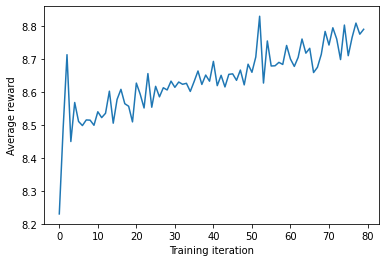

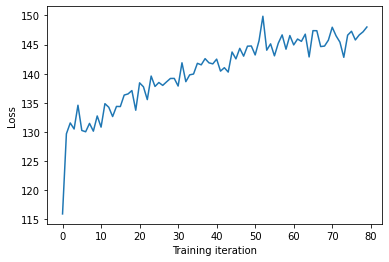






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.82it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.82it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.82it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.85it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.85it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.85it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.30it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.30it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.30it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 12.91it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.511383489556313
Proportion of valid SMILES: 0.8


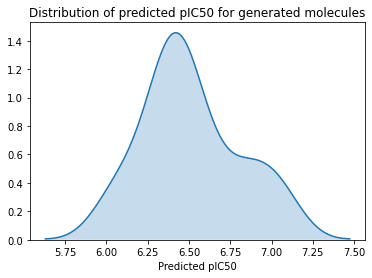






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)CC(N)C(=O)NC(CCCCNC(=N)N)C(N)=O
CC(C)N(Cc1cn(C)cn1)C(=O)CCc1cc(C(C)(C)C)nn1-c1ccccc1
CCC(=O)NC(CC(CCCNC1CCCCC1)C(=O)N1CCCC1C(=O)N(C)C(C)(C)C)C(C)C
CNc1ncc(N2C=CC(=O)NC2=O)cc1Cl
Cc1nccs1







Policy gradient...:  20%|██        | 1/5 [00:08<00:33,  8.40s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.28s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.13s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.99s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.00s/it]


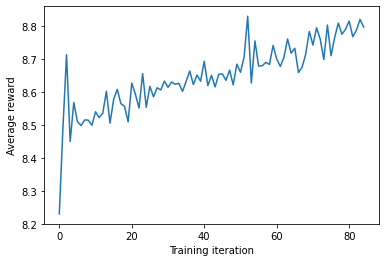

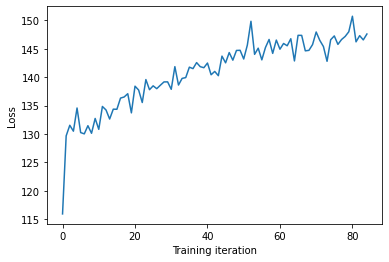






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 18.04it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 18.04it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 18.04it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 16.86it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 16.86it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.43it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.43it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.43it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 13.51it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 13.

Mean value of predictions: 6.578210399992483
Proportion of valid SMILES: 0.7


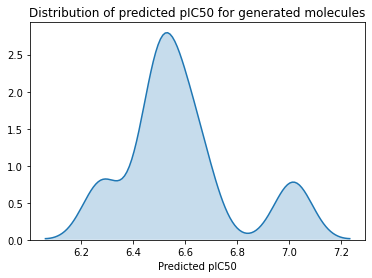






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
C=CC(C)C1CCC23CC(O)CCC1CC(O)(OC2(C)C)C3O
COc1ccc(-c2ccc(OCC(O)CNCc3ccccc3)cc2)cc1OC
COc1ccc(C(O)CNCCCCCc2ccccc2)cc1
Cc1cccc(C(=NOCCN(C)C)C(C)(C)CCc2ccccc2)c1
Cc1cccc(C(=O)NC2=COc3ccccc3C2=O)c1







Policy gradient...:  20%|██        | 1/5 [00:08<00:33,  8.47s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.29s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.24s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.26s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.12s/it]


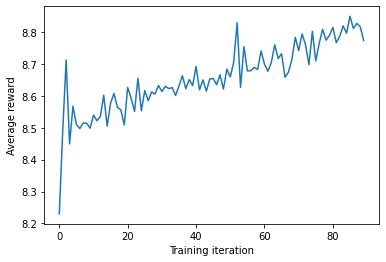

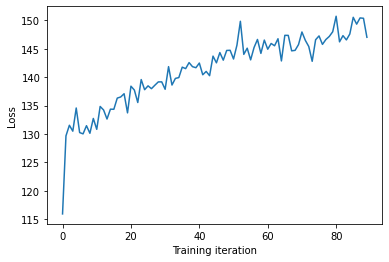






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.67it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.67it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.67it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 11.96it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 11.96it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 11.96it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.26it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.26it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.26it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 13.56it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.322825386956875
Proportion of valid SMILES: 0.8


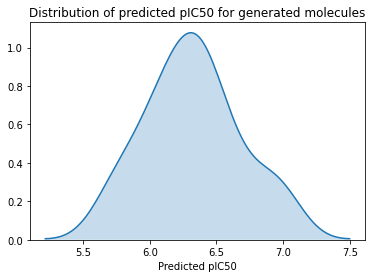






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)Nc1ccc2c(c1)NC(=O)CCS2
CC(C)(C)C1=NC(=O)c2cc(Cl)c(O)cc21
CN(C)C(=O)COc1ccc(N2CCC(C(=O)NCCC(=O)O)CC2)c2ccccc12
CN1CCN(c2ccc(CN3C(=O)N(C)C(=O)N(C)C3=O)cc2)CC1
COc1cccc(CNC(=O)c2ccc(C(=O)N3CCN(C(=O)CNC(C(C)=O)c4ccc(Cl)cc4)CC3)cc2)c1







Policy gradient...:  20%|██        | 1/5 [00:08<00:33,  8.41s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:25,  8.39s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.09s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.14s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.96s/it]


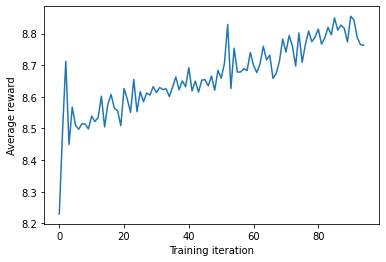

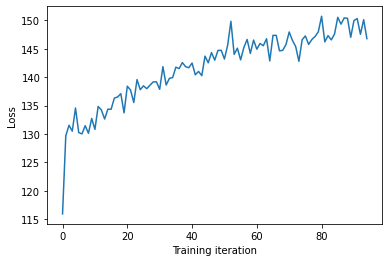






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.67it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.67it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.67it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.40it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.40it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.40it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.40it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.61it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.61it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.61it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00

Mean value of predictions: 6.203220599601306
Proportion of valid SMILES: 0.6


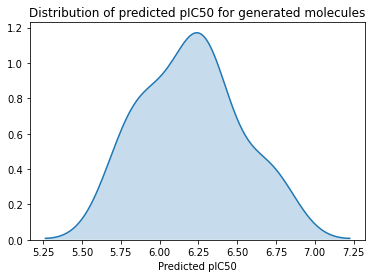






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
C=CC=NOc1ccccc1C
CCCC1COCCN1
CN(C)C(=O)C=Cc1ccc(CN2C=NC(=O)NC2=O)cc1
COc1cc(C(=O)NCC2SCC(=NNC(=N)N)c3ccccc3C2O)cc(OC)c1OC
COc1cc(NS(=O)(=O)c2cccc(NC(=O)CNC(=O)O)c2)ccc1Oc1ccccc1







Policy gradient...:  20%|██        | 1/5 [00:08<00:33,  8.32s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.17s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.08s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.08s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.08s/it]


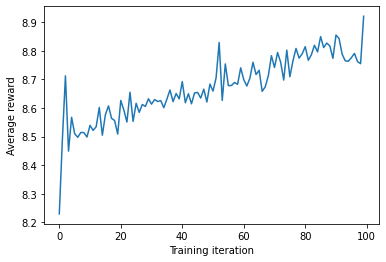

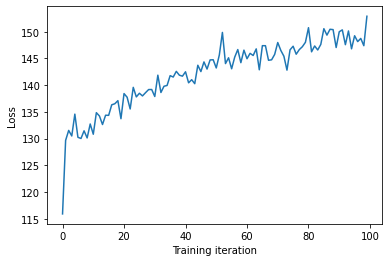






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 11.40it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 11.40it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 11.40it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.72it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.72it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.72it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.94it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.94it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.94it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 12.96it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.705123172205321
Proportion of valid SMILES: 0.7


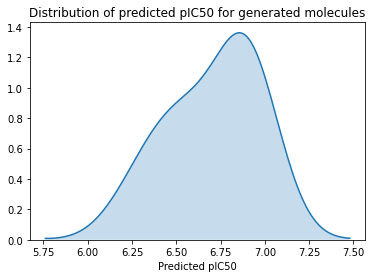






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC1CN(CCC(C)(C)O)CC1C(=O)NC1COCC1=O
CCCCNC(=O)CN1C(=O)C(=Cc2ccco2)SC1=S
CCCOc1ccc(Nc2ccc(C(F)(F)F)cc2)c(C(=O)O)c1Oc1ccc(C(C)(C)C)cn1
COC(=O)C(CCCCCCCCCCCOCc1ccccc1)CNC(=O)C(CN1NC(C)=NNC1=O)c1ccccc1
COC(=O)Cc1nc(CNC(=O)c2ccccc2O)n(-c2ccc(C(F)(F)F)cc2)n1







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.93s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.05s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.11s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.11s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.18s/it]


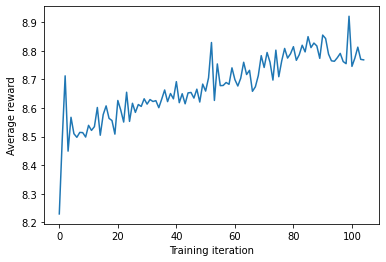

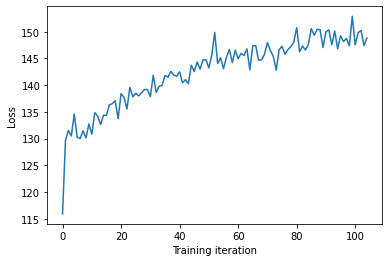






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.59it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.59it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.59it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.56it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.56it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.56it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.64it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.64it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.64it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 14.67it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.96975657406451
Proportion of valid SMILES: 0.5


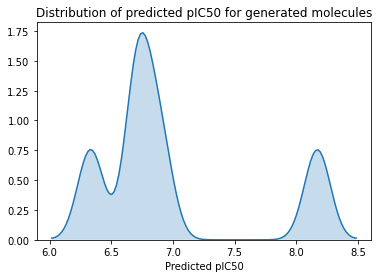






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC1CCC(CCO)CC(NC(=O)Cn2ccc3ccccc32)C1=O
CCCCN(CCOC)CCOc1ccc(S(=O)(=O)NCc2ccccc2)cc1
CCCCNC(=O)N=C(N)CC(O)C(Cc1ccccc1)NC(=O)OCc1ccccc1
CN(CC(=O)NC1CCCC1)C(=O)N(C)Cc1cnn(Cc2ccccc2)c1
O=C(NC(Oc1ccccc1)C(F)(F)F)c1ccc(N2CCCCCC2)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.85s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.93s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.12s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.04s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.02s/it]


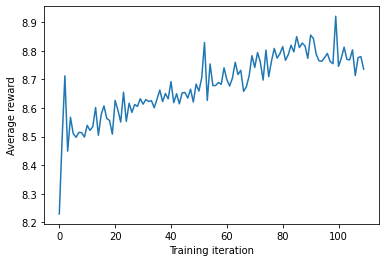

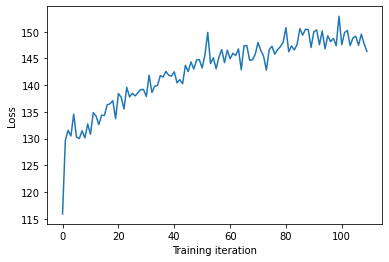






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.81it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.81it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.81it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.86it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.86it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.86it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.51it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.51it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.51it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 12.10it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 12.10it/s]




Generating molecules...:  70%|███████   | 7/10 [

Mean value of predictions: 6.7221672520228255
Proportion of valid SMILES: 0.7


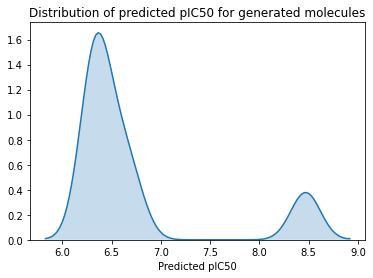






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
C=CCc1c(C)n(NC2cc(OC)cccc2COc2ccccc2)c2ccccc12
CC(=CCOC(COP(=O)(O)O)N(=O)=O)CCCC(C)(C)C
CC1=C(NCC(=O)NC(CO)c2ccc(OCC(=O)NC(C)C)cc2)C(=O)N(Cc2ccccc2)C(=S)N1
CCOc1ccc(N2NC(C)=CC(=O)C2=O)cc1
Cc1ccccc1Cn1c(OCC(=O)O)c(C(N)=O)c2ccc(S(=O)(=O)N3CCN(C)CC3)cc21







Policy gradient...:  20%|██        | 1/5 [00:08<00:34,  8.63s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:25,  8.42s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.30s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.16s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.05s/it]


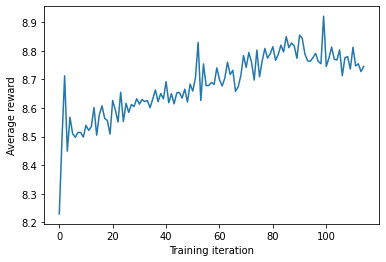

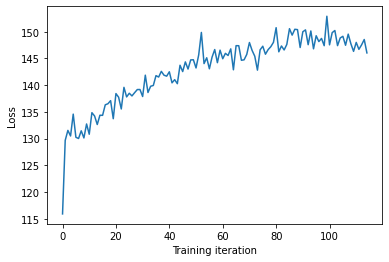






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:01,  8.88it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:01,  8.88it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:01,  8.88it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00,  9.71it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00,  9.71it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00,  9.71it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 10.50it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 10.50it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 10.50it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.03it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.03it/s]




Generating molecules...:  70%|███████   | 7/10 [

Mean value of predictions: 6.658493671491564
Proportion of valid SMILES: 0.6


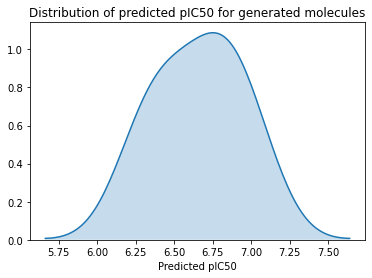






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCCCOCCCc1cc(O)cc(C2=CCCCC2)c1
CCN(CC)C1C=Nc2ccccc2N=C1c1ccc(C(=O)NCc2cc(C)sc2C)s1
CCNC(=O)C(NC(=O)NCCN1CCNC1=O)C(=O)Nc1cccc(C(=N)N)c1
CNCC(O)Nc1nc(C)c(C#N)c(F)c1-c1ccc(F)cc1
Cn1ccc(CN2CCOCC2)c1C1CCN(Cc2ccc3c(c2)C(c2ccccc2)CO3)O1







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.81s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:23,  7.99s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.01s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.16s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.17s/it]


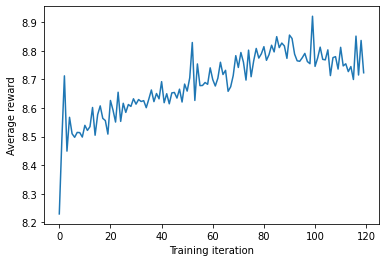

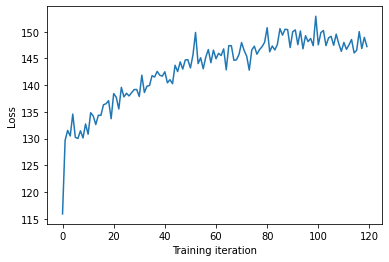






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00,  9.86it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00,  9.86it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00,  9.86it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 10.21it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 10.21it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 10.21it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 10.76it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 10.76it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 10.76it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 10.60it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.888104335935864
Proportion of valid SMILES: 0.5


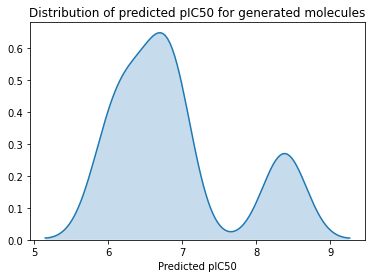






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)N1CCC(Oc2cccc(C(=O)NCc3cccc(C(=O)O)c3)c2)CC1
CN(c1cc(O)c(F)c(F)c1)C(CCN(CCCSC1=NC(=O)c2cnccc21)C(C)(C)C)C(=O)NC1CC1
NS(=O)(=O)c1cccc(C(=O)NC(=O)c2ccc(Cl)cc2)c1
O=C(C=Cc1ccc(F)cc1)N1CCN(S(=O)(=O)c2ccccc2)CC1
O=C1CCCN1CN1CCN(CCNc2ccccc2)C1=O







Policy gradient...:  20%|██        | 1/5 [00:08<00:33,  8.48s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:25,  8.41s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.18s/it]




Policy gradient...:  80%|████████  | 4/5 [00:33<00:08,  8.32s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.16s/it]


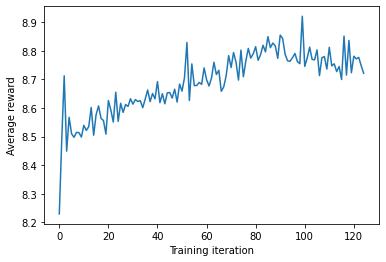

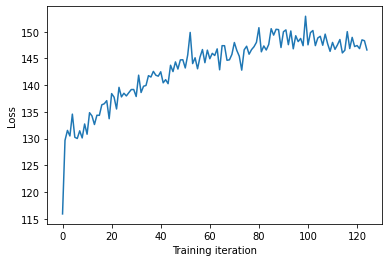






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.42it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.42it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.42it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.32it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.32it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.32it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.82it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.82it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.82it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 13.82it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.319481513799537
Proportion of valid SMILES: 0.6


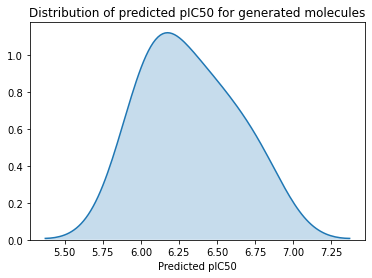






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)(C)OC(=O)Nc1ccccc1
CC(C)Oc1cccc(-c2ccc(CNC(=O)Nc3ccccc3)cc2)c1
CC1(C)C(=O)C2C(=O)C=C1OC2c1cc(O)c(C(C)(C)C)cc1O
CCC1CCC(=CCCCCCCCCC(=O)O)CCo1
COc1ccc(N2CCN(C(=O)c3ccc(O)c(O)c3)CC2)cc1







Policy gradient...:  20%|██        | 1/5 [00:08<00:31,  8.00s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.05s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.09s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.15s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.06s/it]


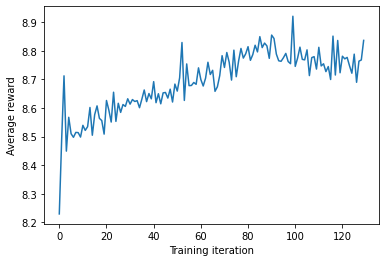

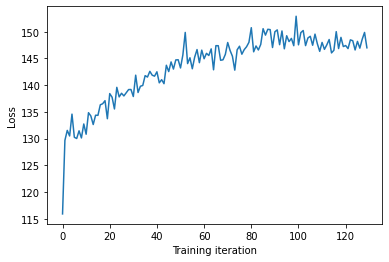






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.15it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.15it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.15it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.15it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 10.68it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 10.68it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 10.68it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 11.07it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 11.07it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 11.07it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 12.38it/s]




Generating molecules...:  80%|████████  | 8/10 [

Mean value of predictions: 6.545751578437326
Proportion of valid SMILES: 0.7


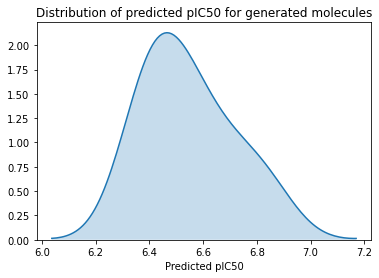






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC1OC(=O)C2(C)CCC3=C4CCC(O)C(=O)C4(C)C3C(O)CC12C
CCC(C)COCC(N)=O
CCC1(CC)CCc2cc(CCCc3ccccc3)ccc21
CCN(CC)CCCN1CCC(O)(c2ccccc2)C(c2ccccc2)C1
Cc1cc(C)nc(NC(=O)c2cccc(C(C)(C)Cl)c2)c1







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.86s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.77s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.67s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.73s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.77s/it]


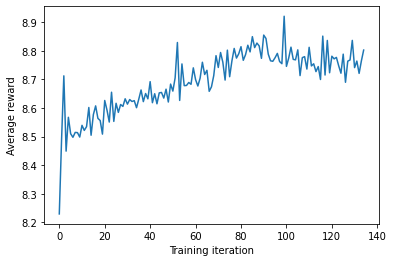

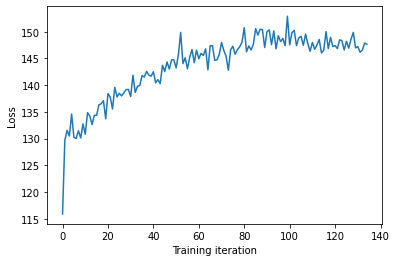






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.95it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.95it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.95it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.98it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.98it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.98it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.30it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.30it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.30it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 15.33it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.680291917173069
Proportion of valid SMILES: 0.6


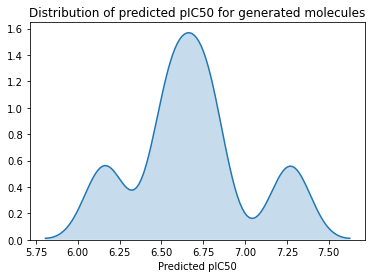






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
C=CC1=NC(=O)N(S(=O)(=O)c2cnc(N)nc2)C1
CC(C)CC(CNC(C)C)C(=O)NC(C(=O)NC(CC(C)C)C(O)Cc1ccccc1)C(C)C
CC(NC(=O)N1CCCN(C)CC1)C(=O)c1ccccc1
CCOC(=O)C1(O)CCC(CC)=CCC1(C)C
COC(=O)C1=Cc2ccccc2C(=O)N1c1ccc(OC)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.80s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.81s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.82s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.78s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.74s/it]


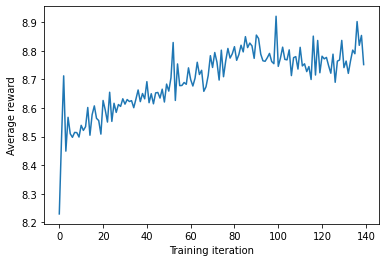

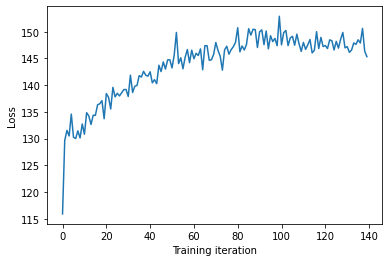






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.15it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.15it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.15it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.53it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.53it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.53it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.48it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.48it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.48it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 12.14it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 12.14it/s]




Generating molecules...:  70%|███████   | 7/10 [

Mean value of predictions: 6.613120525386448
Proportion of valid SMILES: 0.7


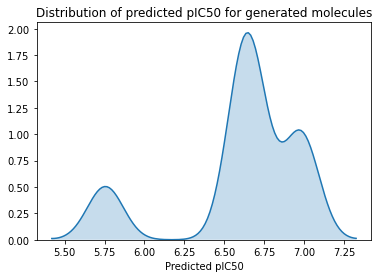






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCN(CC)C(=O)C1CCN(C(=O)c2ccccc2OC)CC1
CON=C(c1ccncc1)c1ccc(CCOC(C)C(C)C)cc1
COc1cc2c(cc1OC)C(=O)C(N1C(C)=CN(C3CC(C)=C(C)C=C(C)C3=O)C1(C)C)=CC2=O
COc1ccc(C2=NOC(c3cccc(C#N)c3)C2)cc1
Cc1cc(C(F)(F)F)ccc1-c1ccc(-c2cccc(C3(N)CCCC3)c2)cc1







Policy gradient...:  20%|██        | 1/5 [00:08<00:32,  8.03s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.95s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.92s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.94s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.95s/it]


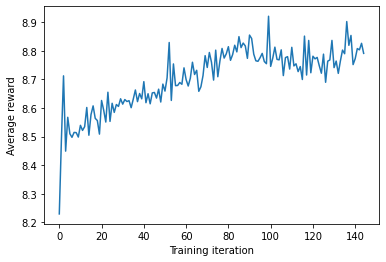

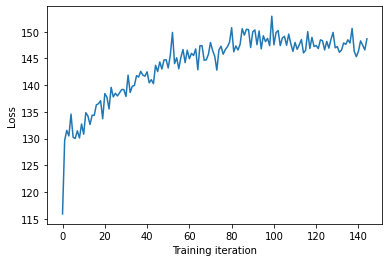






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.60it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.60it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.60it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.31it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.31it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.31it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.30it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.30it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.30it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 15.34it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.635668645842274
Proportion of valid SMILES: 0.7


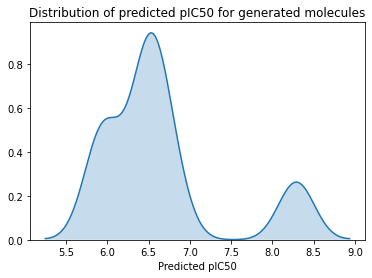






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCCCCCCCCN1CC(C)C(NC(=O)C2CCCCC2)C1
CCCCCCCOc1ccccc1N1CCC(N2C(=O)NC3CCCCCC3=C2C)CC1
CCCCc1c(C)c(C)c(C(=O)NCCCN2Cc3ccccc3C2)c(O)c1CC
COC(=O)c1cccc(C)c1OC(C)=O
COCCN(C(=O)CN1C(=O)c2ccccc2S1(=O)=O)C(C)C







Policy gradient...:  20%|██        | 1/5 [00:08<00:33,  8.36s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:24,  8.04s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:16,  8.07s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:08,  8.07s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.97s/it]


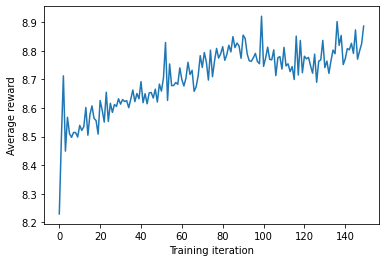

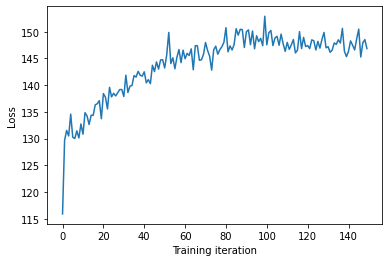






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 10.13it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 10.13it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 10.13it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 11.63it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 11.63it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 11.63it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 11.69it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 11.69it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 11.69it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 12.59it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.3273453833197255
Proportion of valid SMILES: 0.7


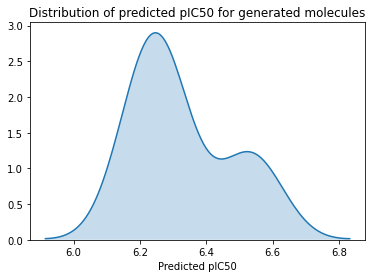






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCCCCCCNC(=O)CCCC(=O)O
CCN1C2=C(c3ccc(C#N)cc3)SC(c3ccc(Cl)c(Cl)c3)=Cc2cn1C
CCOC(=O)N1CCN(CCCNC(=O)c2ccccc2)c2ccccc21
CN(C)C(=O)C1=COCCCCC1=O
CN(C)CCONC(=O)Cn1ccnc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.87s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.84s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.01s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.93s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.96s/it]


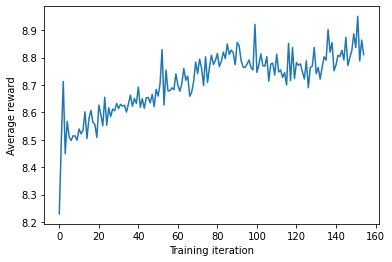

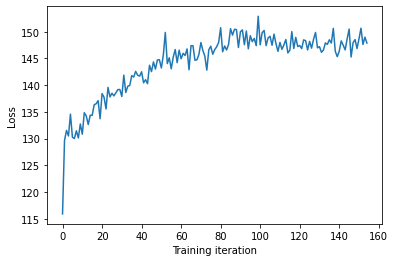






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.05it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.05it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 11.04it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 11.04it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 11.04it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.56it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.56it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.56it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.88it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.88it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00

Mean value of predictions: 6.850909288323514
Proportion of valid SMILES: 0.7


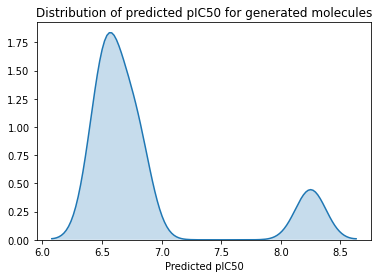






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)c1cc(C2=NC3(CCc4ccccc43)SC2=NC(C)CO)ccc1Cl
CC(C)(C)Cc1ccc(-c2ccc(C(CCNS(N)(=O)=O)C(N)=O)cc2)o1
CCCCNC(=O)Nc1ccc(S(=O)(=O)N2CCN(Cc3ccc(C#N)cc3)CC2)cc1
CCCNC(=O)C1(Cn2ccc(-c3cccs3)n2)CCN(Cc2ccccc2)CC1
CCOC(=O)C(COc1ccccc1)NC(=O)N(C)C(=O)N(C)C1CC(C)N(c2ncnc3sccc23)CC[nH]1







Policy gradient...:  20%|██        | 1/5 [00:08<00:33,  8.25s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.19s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.18s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.04s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.15s/it]


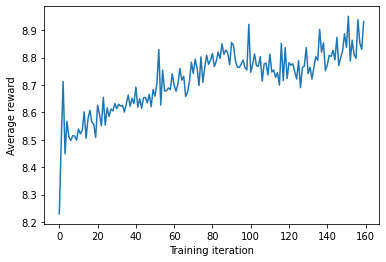

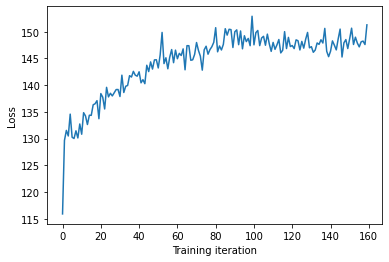






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.95it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.95it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.95it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.54it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.54it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.54it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.53it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.53it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.53it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 15.76it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.261752058385533
Proportion of valid SMILES: 0.7


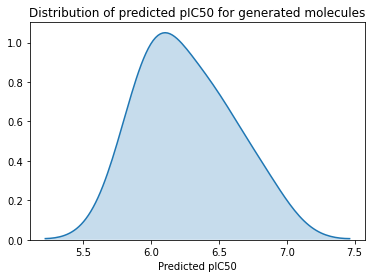






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
C=CC1=C(Cl)C(=O)C(=Nc2ccc(C)cc2)S1
CCCNc1nc(CC2CCNCC2)cc(C2CC2(C)C)n1
CCN(CCNC(=O)COC(=O)CN1CCCC1)C(=O)Nc1ccc(OC)cc1C
CCOc1ccc(C2=C(c3ccccc3)C(=O)NC2Sc2ccccc2)cc1
COc1ccc(NC(=O)CCCCN2CC(=O)Nc3ccccc32)cc1







Policy gradient...:  20%|██        | 1/5 [00:08<00:33,  8.29s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:24,  8.02s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:16,  8.03s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:08,  8.07s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.95s/it]


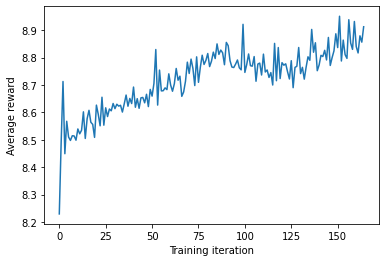

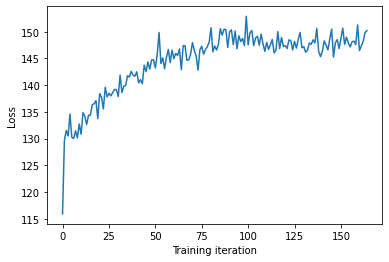






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.19it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.19it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.19it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.89it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.89it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.89it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.29it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.29it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.29it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 14.47it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.44059463725369
Proportion of valid SMILES: 0.7


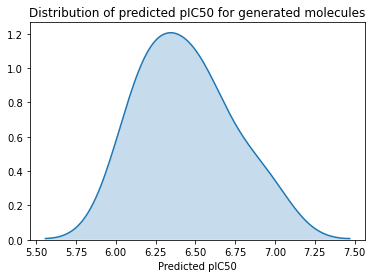






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)(C)NC(=O)C1CSC(c2ccccc2)=N1
CC(C)C(c1cccc(F)c1)N1C(=O)CN(C)C1=O
CC1=CC2OC=C(C)C2(C)CC(=O)C(C)=C1
CCS(=O)(=O)Nc1cccc(-c2cc(C)nn2CCOc2ccc(Cl)cc2)c1
CN(CCNC(=O)COc1cc(-c2ccccc2)ccn1)Cc1ccccc1







Policy gradient...:  20%|██        | 1/5 [00:08<00:32,  8.01s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.95s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.91s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.13s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.12s/it]


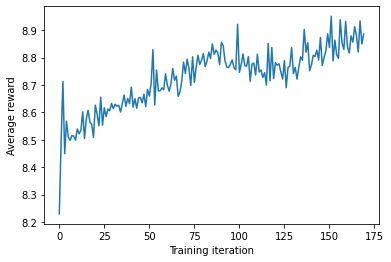

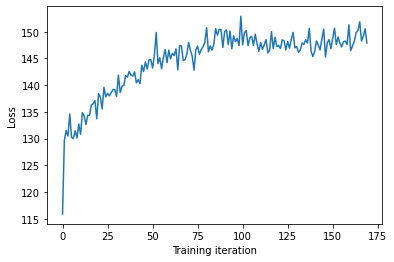






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00,  8.67it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00,  8.67it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00,  8.67it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00,  9.72it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00,  9.72it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00,  9.72it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00,  9.72it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 10.82it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 10.82it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 10.82it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00

Mean value of predictions: 6.401962858197868
Proportion of valid SMILES: 0.7


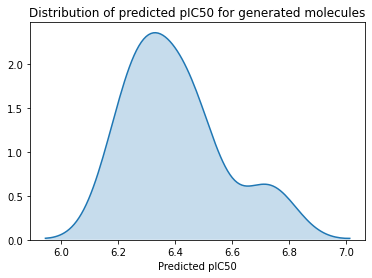






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)NC(CCC(=O)O)c1ccc(C(F)(F)F)cc1C(=O)N1CCCc2ccccc21
CC(=O)NC(NC(=O)CC(C(=O)OCc1ccccc1)C(Cc1ccc(N(=O)=O)cc1)NC(=O)C(CCCNC(=N)N)NC(=O)OC(C)(C)C)C(=O)CCl
CNc1ncnc2c1ncn2C1CCOC1
COc1ccc(C(c2ccccc2)C(C)NC(=O)C(CC(=O)NC2CC2c2ccc(N(C)C)cc2)Cc2ccc(O)cc2)cc1
COc1ccc(CN2c3ccccc3SCC2C)cc1OC







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.94s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.94s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.82s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.87s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.84s/it]


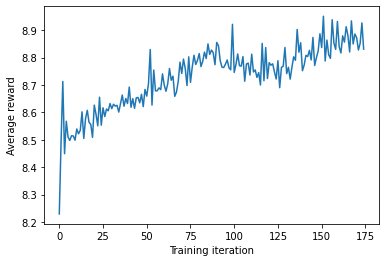

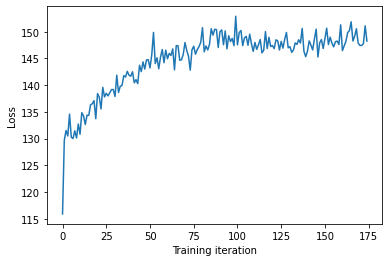






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 11.76it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 11.76it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 11.76it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.03it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.03it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.03it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.68it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.68it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.68it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 13.30it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.416645625760941
Proportion of valid SMILES: 0.5


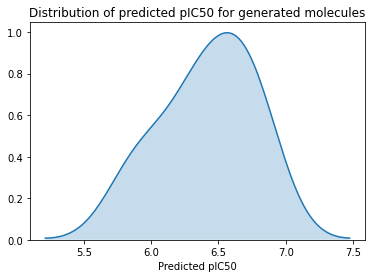






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)CCN(CCC(C)c1ccccc1Cl)C(=O)NC1CC(C)NC(CSC(C)(C)C)C1=O
CNC(=O)C(Cc1ccccc1)NC(=O)N1CCCC(C(=O)NCCN(C)C(=O)c2cc(C)no2)C1
CNCC(O)COCCCCCCCCCCCCCCCCC(=O)O
FC(F)(F)c1nc(C2CCCCCC2)no1
O=C(CC1=Cc2c(O)cccc2C1=O)CN1C(=S)Nc2ccccc21







Policy gradient...:  20%|██        | 1/5 [00:08<00:33,  8.25s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.11s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.98s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.99s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.95s/it]


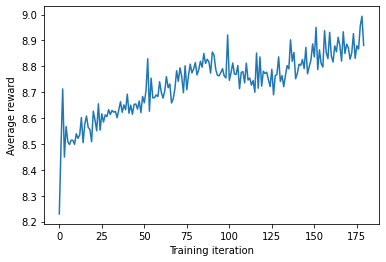

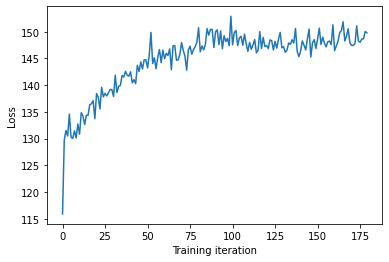






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.31it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.31it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.31it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.87it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.87it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.87it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.98it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.98it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.98it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 15.59it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.593920101801203
Proportion of valid SMILES: 0.8


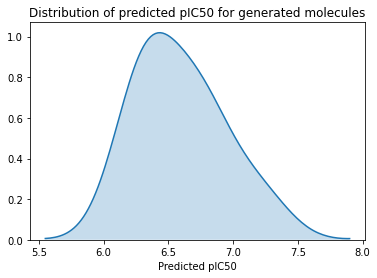






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)N1CCN(C(=O)c2cc(C)ccc2F)CC1
CC(C)C1CCC(OC(=O)C(C)(C)C)CS(=O)(=O)c2c(ccc3c2CO3)CCC(=O)N1
CC(C)NCCCCCC(=O)NCC1CCN(C)C(=O)NC1=O
CN1C=CC(OCc2ccccc2)=C(Cl)C1=O
COc1cccc(CNC(=O)c2cc(-c3cccnc3)nn2C)c1







Policy gradient...:  20%|██        | 1/5 [00:08<00:33,  8.40s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.30s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.28s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.07s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.02s/it]


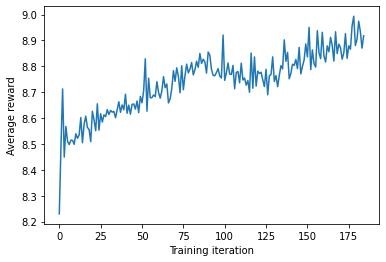

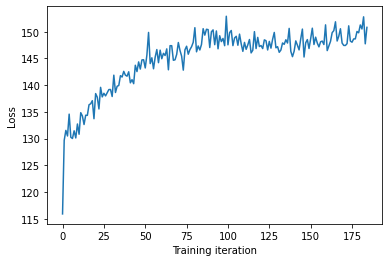






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.42it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.42it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.42it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.31it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.31it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.31it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.90it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.90it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.90it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 15.11it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.654173669431323
Proportion of valid SMILES: 0.6


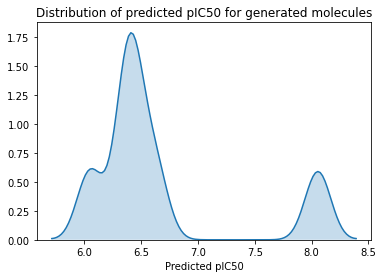






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC
CC=CC1=C(O)C(=O)C=C(OC)C1=O
CCN(CC)c1cc(C(=O)Nc2ccc(NC(=O)CNC(=O)c3ccccc3)cc2)ccn1
CCN1C(C)=NN2C1=C(C#N)C(N1CCCCCC1)=NN2c1ccncc1
COc1ccc(S(=O)(=O)N2CCN(C3CN(c4cccc(OC)c4)C(=O)O3)CC2)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.98s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.13s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:15,  7.98s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.03s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.90s/it]


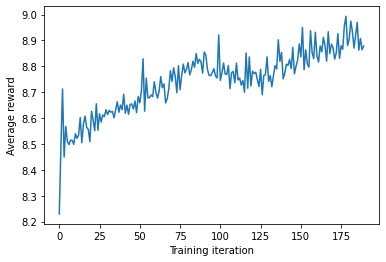

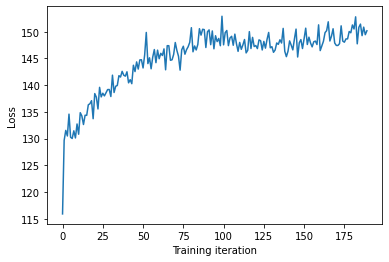






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 19.83it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 19.83it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 19.83it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 19.07it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 19.07it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 19.07it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.32it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.32it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.32it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00:00, 12.

Mean value of predictions: 6.764375514681499
Proportion of valid SMILES: 0.5


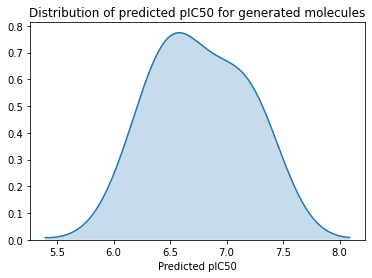






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCc1csc(Nc2nccc(N(C)C)n2)n1
CSC1=Nc2ccccc2C(=O)N1Cc1ccccc1
NC1NCc2ccccc2C1=O
O=C(Nc1ccc(F)cc1C(=O)NC1CCCC1)c1ccccc1F
O=S(=O)(NC1ccC2c3c([nH]c4ccc(-c5ccc(F)cc5)cc34)Co(c3ccccc32)OCC(C2=CCCC2)CC1)c1cccc(Cl)c1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.52s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.73s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.83s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:07,  7.96s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.03s/it]


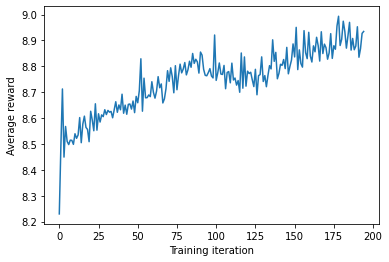

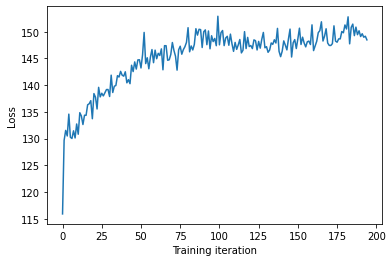






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.93it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.93it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.93it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.47it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.47it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.47it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.98it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.98it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.98it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.46it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.46it/s]




Generating molecules...:  70%|███████   | 7/10 [

Mean value of predictions: 6.600450341698199
Proportion of valid SMILES: 0.7


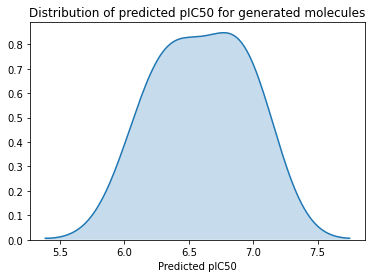






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)(C)NC(=O)C(CC1CCCCC1)NC(=O)c1ccc(CCCCN2CCC(Cn3cccc3)CC2)cc1
CC(C)OC(=O)N1CCC(NC(=O)C2CCN(C(=O)Nc3ccccc3)CC2)CC1
CCOC(=O)Cn1ncc2ccc(N3CCN(c4cc(C)nc(-c5ccccc5OC)n4)CC3)cc21
COc1cc(Cl)c(N(C)C)cc1NCCCN1CCC2(c3ccccc3)CC(O)(c3ccccc3)CC(C)(C)CC2C1
COc1ccc(CN(C)C2COc3nccc(O)c3C2=O)cc1OC







Policy gradient...:  20%|██        | 1/5 [00:08<00:32,  8.01s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  8.00s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.77s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.82s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.82s/it]


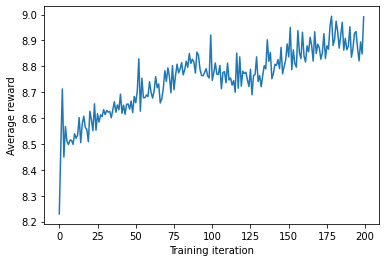

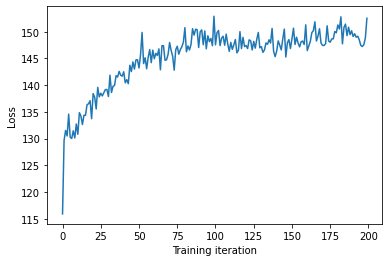






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:01,  8.66it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:01,  8.66it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:01,  8.66it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00,  9.92it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00,  9.92it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00,  9.92it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 10.74it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 10.74it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 10.74it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.81it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.81it/s]




Generating molecules...:  70%|███████   | 7/10 [

Mean value of predictions: 6.373162870061738
Proportion of valid SMILES: 0.6


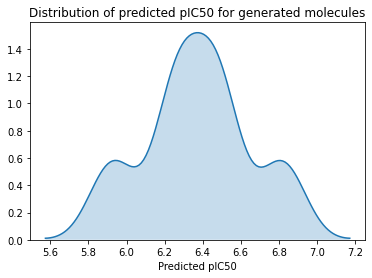






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)N(C(=O)NCc1ccccc1)C1CCN(c2ccccc2C)C1
CC(C)CNC(=O)CC(NC(=O)OCc1ccc(N(C)C)cc1)C(COc1ccc(C(=N)N)cc1)C(=O)NCc1ccccn1
CCc1ccccc1Nc1ccc(C)cc1Nc1ccc(C(=O)Nc2cc(S(=O)(=O)O)ccn2)cc1
CN=C1NNC(=O)C1=O
Cc1ccccc1NC(=O)CN1C=Nc2ccccc2C1=O







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.63s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.78s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.91s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.90s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.85s/it]


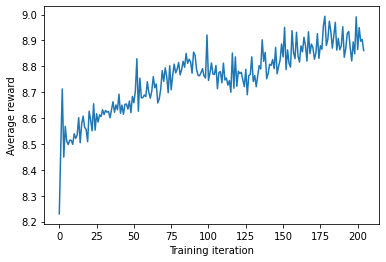

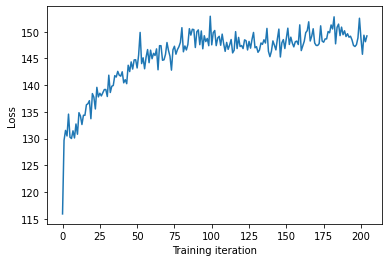






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.32it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.32it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 13.03it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 13.03it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 13.03it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 13.30it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 13.30it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 13.30it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 13.79it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 13.79it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00

Mean value of predictions: 6.585875541739995
Proportion of valid SMILES: 0.6


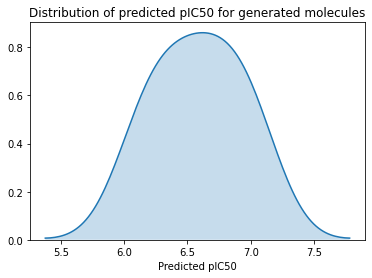






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCCCCCCCC(=O)NC(C(=O)N1CCCC1C(C)(O)C1CCCCC1)C(C)C
COc1ccc(C2=NC(=O)Co2)cc1OC
COc1ccc(OC)c(C=NNC(=O)c2cccs2)c1
Cc1cc(C(=O)O)ccc1OC1CCCN(C(=O)C(C)C)C1
Cc1ccc(C(=O)NCCn2ccc(-c3cccnc3)n2)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.56s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.64s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.79s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.85s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.88s/it]


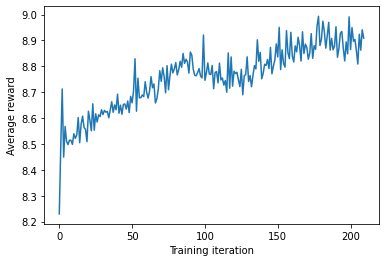

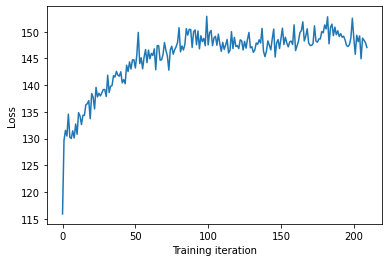






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.51it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.51it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.51it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.63it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.63it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.63it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.90it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.90it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.90it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 15.01it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.65912932706163
Proportion of valid SMILES: 0.8


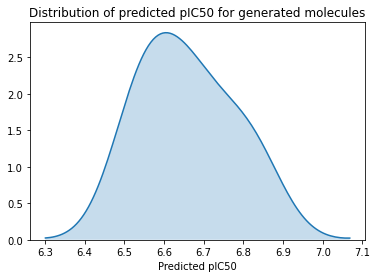






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)C1NC(=O)C(NC(=O)CCc2ccccc2)C(=O)O1
CCSc1cccc(C)c1CNC(=O)c1cccnc1
COc1cc(C2CCN(C(=O)c3ccc(C)c(C)c3)C2)cc(OC)c1OC
COc1ccc(C2=CC(=O)c3c(ccc(C)c3C)O2)cc1Br
COc1ccccc1C(CN1CCOCC1)NCC(Cc1ccccc1)NC(=O)CCNC(=O)C(C)(C)O







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.98s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.04s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.03s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:07,  7.99s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.97s/it]


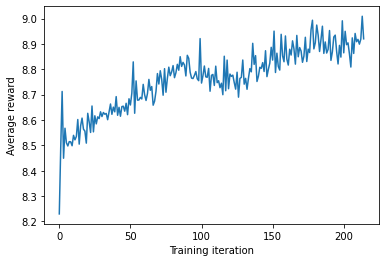

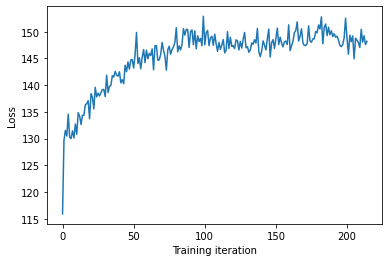






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.09it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.09it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.09it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.08it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.08it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.08it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.10it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.10it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 12.86it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 12.86it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00

Mean value of predictions: 6.359640767613274
Proportion of valid SMILES: 0.5


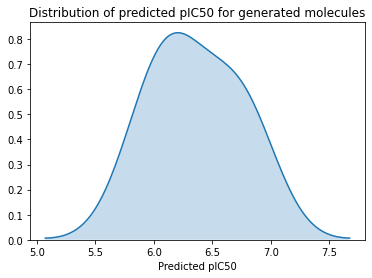






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCC(C)Cc1cc(N)n(-c2ccc(C)cc2)n1
CCC(CC)n1cncn1
CCOC(=O)NC1CCS(=O)(=O)C1
COc1ccc(N2C=C(N)N(c3ccccc3)C2=O)cc1
O=C(NC(CC(=O)N1CCOCC1)CN1CCOCC1)c1ccc(NCc2ccccc2)nn1







Policy gradient...:  20%|██        | 1/5 [00:07<00:29,  7.46s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.58s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.72s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.73s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.80s/it]


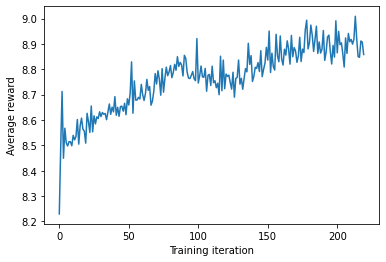

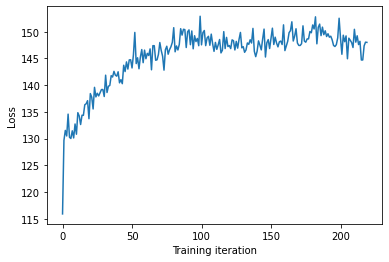






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 11.91it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 11.91it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 11.91it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.12it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.12it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.12it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.12it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 14.96it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 14.96it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 14.96it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00

Mean value of predictions: 6.4965711913126425
Proportion of valid SMILES: 0.8


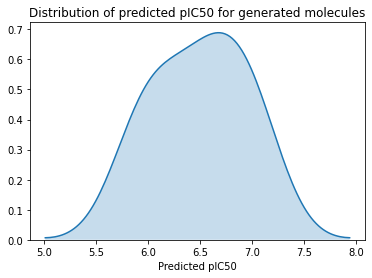






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCC(C)NC(=O)CN1C(=O)N(C)C(=O)c2nc[nH]c21
CCCN(C)C(=O)c1cccc(S(=O)(=O)N2CCC(C(N)=O)CC2)c1
Cc1cc(-c2ccc(C3CCCN3C(C)CO)cc2)cnc1C
Nc1ncc(N2CCCCC2=O)Cs1
O=C(CSc1ccccc1C(=O)O)Nc1ccccc1







Policy gradient...:  20%|██        | 1/5 [00:08<00:32,  8.18s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.18s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.11s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.19s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.10s/it]


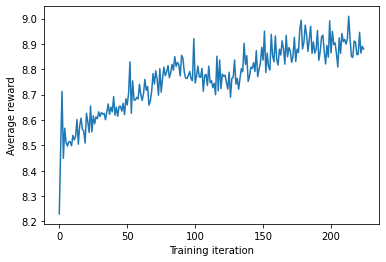

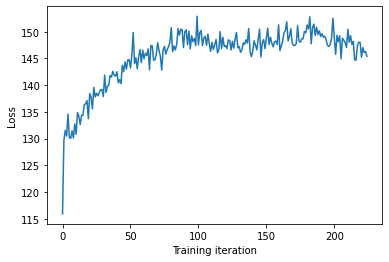






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 11.76it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 11.76it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 11.76it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.84it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.84it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.84it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.08it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.08it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.40it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.40it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00

Mean value of predictions: 6.532477368511575
Proportion of valid SMILES: 0.8


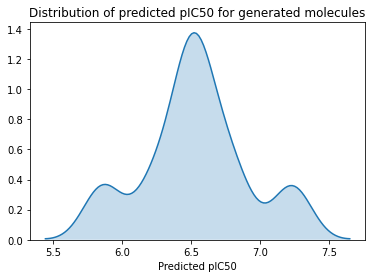






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC1(C)CC(=O)CCS(=O)CCC(NC(=O)C=CC(=O)O)C1=O
CC1=NN(c2ccc(NN=Cc3ccc(C(=O)O)cc3)cc2)C(=O)C1=O
CC1CN(S(=O)(=O)c2ccccc2)CCC1N1CCN(C(=O)c2cc(N(=O)=O)cnc2N)CC1
CCS(=O)(=O)NCCCCNCC(=O)O
CN(C)c1nc2ccccc2n2cc(-c3ncnc(N4CCOCC4)n3)cc12







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.85s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:23,  7.94s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:15,  7.96s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.94s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.95s/it]


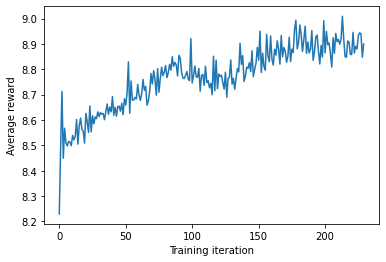

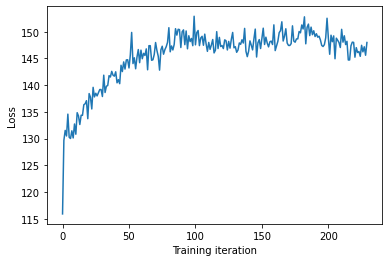






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:01,  8.70it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:01,  8.70it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:01,  8.70it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00,  9.95it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00,  9.95it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00,  9.95it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.06it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.06it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.06it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.88it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.88it/s]




Generating molecules...:  70%|███████   | 7/10 [

Mean value of predictions: 6.496441621195588
Proportion of valid SMILES: 0.8


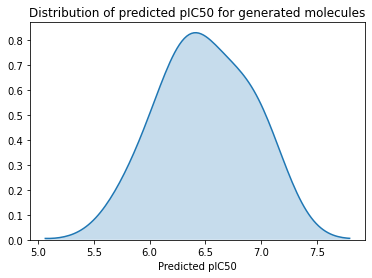






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCC(C)(C)NCC(O)COc1ccc(CN2Cc3ccccc3N3CCCCCCC3C2=O)cc1C(=O)O
CCCCCC(=O)Nc1ccccc1C
CCCCCCCC1(CCCC)CC(=O)N1c1cc2c(cc1C=CC(=O)O)OCO2
CCOc1ccc(C=Cc2ccc(OC)c(OCC(=O)O)c2)cc1OC
COC(C)C(C(=O)O)C(O)C1CC1







Policy gradient...:  20%|██        | 1/5 [00:08<00:33,  8.33s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:24,  8.03s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.93s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.89s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.82s/it]


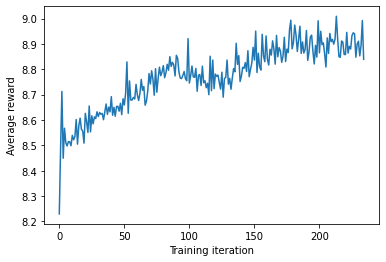

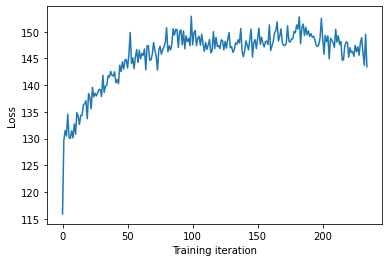






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:01,  8.79it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:01,  8.79it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:01,  8.79it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00,  9.72it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00,  9.72it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00,  9.72it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 10.12it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 10.12it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 10.12it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 10.78it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 10.78it/s]




Generating molecules...:  70%|███████   | 7/10 [

Mean value of predictions: 6.283666286360649
Proportion of valid SMILES: 0.8


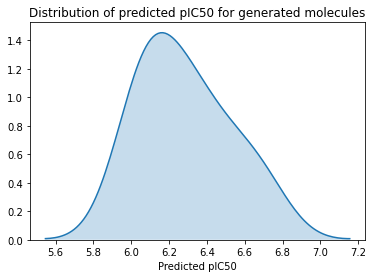






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
COc1ccccc1OCC(=O)c1cn(C(C)C)c(Nc2ccncc2)n1
Cc1cc(C(=O)NNC(=O)Nc2ccccc2)cc2ccccc12
NN(CC(=O)N1CCOCC1)Cc1ccccc1
O=C(C1CCC1)N1CCN(c2ccc(CN(=O)=Nc3ccccc3)cc2)CC1
O=C(CCN1C(=S)CCN1c1ccccc1)NC(=O)CC1CCOCC1







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.76s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.82s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.87s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.96s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.00s/it]


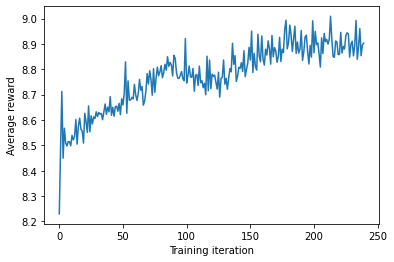

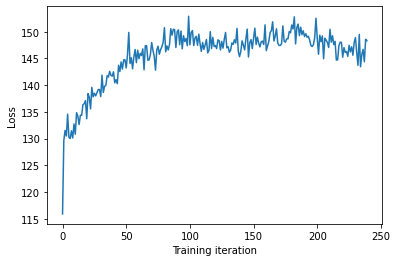






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.19it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.19it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.19it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.30it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.30it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 10.72it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 10.72it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 10.72it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 12.18it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 12.18it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00

Mean value of predictions: 6.371148983408611
Proportion of valid SMILES: 0.7


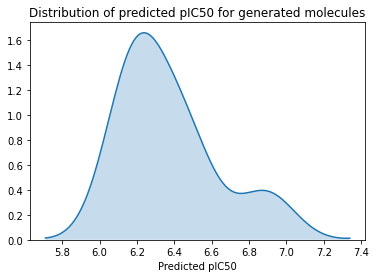






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCN(CC)CC(=O)Nc1nncc(Cc2cccnc2)n1
CCN(CC)CCNC(=O)C(Cc1cccc(OC)c1)NC(=O)C(CC(C)C)NC(=O)C(CCCN)NC(=O)OCc1ccccc1
COc1ccc(-c2ccc(NC(=O)Nc3cnc(Nc4ccccn4)n3C)nc2)cc1
Cc1cc(NS(=O)(=O)c2ccc(Cl)c(C(F)(F)F)c2)c(N2CCCC(O)C2)s1
Cc1ccc(CCC(=O)OCc2ccc(N(=O)=O)cc2)cc1







Policy gradient...:  20%|██        | 1/5 [00:08<00:32,  8.00s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.94s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.76s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.85s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.80s/it]


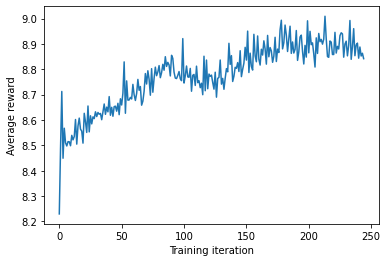

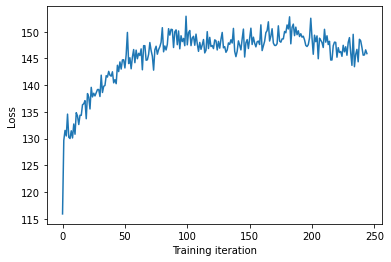






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.81it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.81it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.81it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.56it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.56it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.56it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.79it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.79it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.79it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 15.05it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.4826820435313275
Proportion of valid SMILES: 0.8


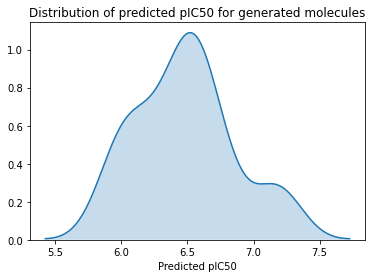






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CN(C)N=C1CN(Cc2ccccc2)C=C1c1nc2ccccc2s1
CN1Cc2cc(N(=O)=O)c(F)cc2C(COC(=O)c2ccccc2)C1
COc1nc(C(=O)NC2CCOCC2)cc(-c2ccc(Cl)cc2)c1OCc1ccccc1C(F)F
Cc1nc2c(C(O)c3ccccc3)cccc2[nH]1
Fc1cc(Oc2ccc(Cl)cc2)ccc1Cl







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.99s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.04s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.96s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.66s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.67s/it]


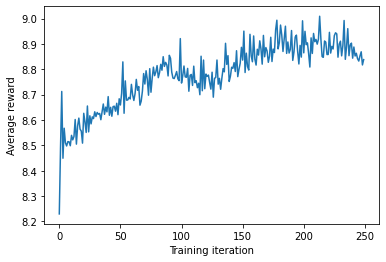

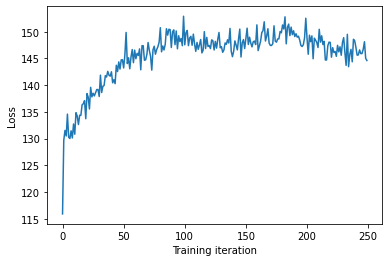






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.48it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.48it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 13.53it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 13.53it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 13.53it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 13.68it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 13.68it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 13.68it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 13.13it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 13.13it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00

Mean value of predictions: 6.374491617280457
Proportion of valid SMILES: 0.7


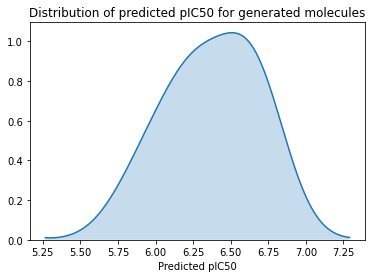






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)CC1CCC(O)C(C)C1
CC1=C(c2ccccc2)N(c2c(C)cccc2C)C(=O)C(Cc2ccccc2)N1
CCOC(=O)CC1C(CCOc2ccccc2C(=O)NO)C(=Cc2ccccc2)C(=O)N1C(=O)c1ccccc1
COCCOc1cnc(CC2CCc3ccccc32)nc1
COCCOc1nc2ccccc2n1CCNc1ccccc1OCCOCCO







Policy gradient...:  20%|██        | 1/5 [00:07<00:29,  7.40s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.52s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.59s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.69s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.78s/it]


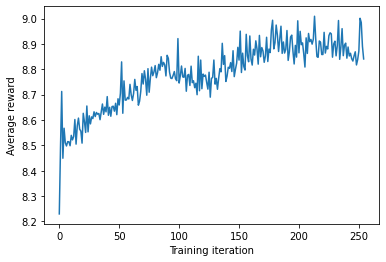

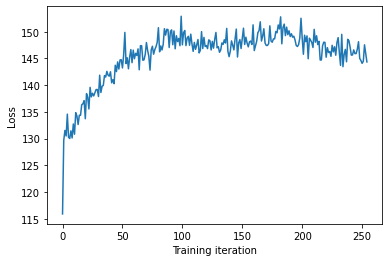






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.06it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.06it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.06it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.13it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.13it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.13it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.70it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.70it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.70it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 14.10it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.621122110825152
Proportion of valid SMILES: 0.8


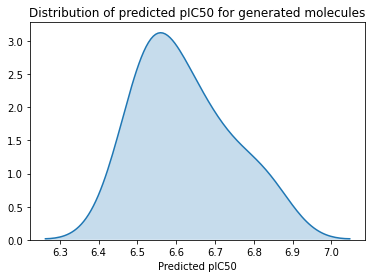






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCCCCCCC(CC(=O)O)NC(=O)c1ccc(-c2ccccc2Cl)o1
CCCCCCCCCCCCCCCCCCCCNC(=O)C1(c2cncc(N(C)N)n2)CCN(C)C1
CCOC(=O)C1=Cc2cc(-c3ccc(Cl)nc3)ccc2N1
CCc1ccc(C(=O)NCC(O)CN2CCC(c3ccc(C(F)(F)F)cc3)CC2)cc1
COc1cc2c(cc1C(C)=O)N(Cc1cccnc1C)CC2







Policy gradient...:  20%|██        | 1/5 [00:07<00:29,  7.45s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.70s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.86s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.87s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.02s/it]


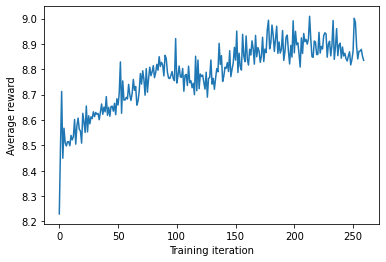

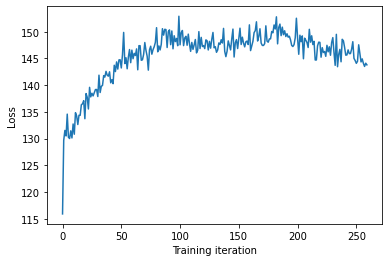






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.43it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.43it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.43it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.56it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.56it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.56it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.89it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.89it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.89it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 12.84it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.589046145887342
Proportion of valid SMILES: 0.7


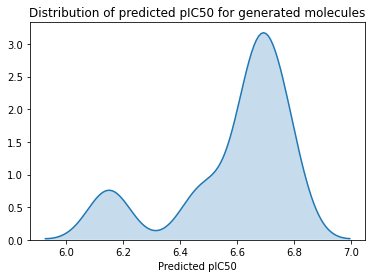






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)(C)CCCN(CCN1CCc2ccccc2CC1)C(=O)CCc1ccccc1
CC(CO)N1CCC(C2CCCCCC2)CC(N2CCCC2)N1C(=O)c1ccccc1
CCCCNC(=O)CCC(NC1CCS(=O)(=O)C1)C(=O)NCc1c(F)cccc1F
CCc1cccc(N2CCN(C(=O)C3CCN(C(=O)c4ccco4)CC3)CC2)c1
CCc1cccc(OC)c1CCNC(=O)NCc1cccc(C(F)(F)F)c1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.67s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.67s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.80s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.88s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.98s/it]


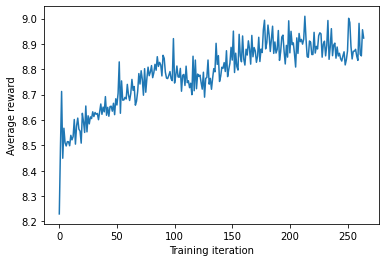

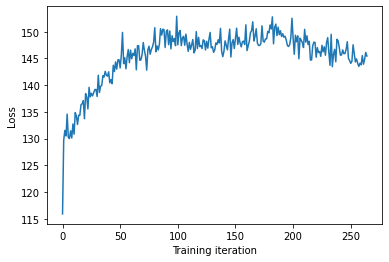






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.76it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.76it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.76it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 11.62it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 11.62it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 11.62it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.54it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.54it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.54it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 13.32it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.1019724129630335
Proportion of valid SMILES: 0.5


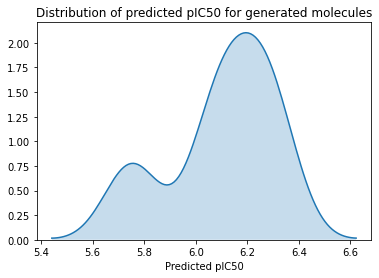






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
C=CCn1ccnc1S(=O)(=O)Nc1ccccc1
CC1(C)C(=O)N2C=C(S(C)(=O)=O)C(=O)NC21
O=C(CN1N=CC=CC1=O)Nc1ccccc1Cl
O=C(O)COc1cccc(Cc2ccncc2)c1
O=C1C(CC2CCNCC2)=C2C(=O)N(c3ccc(Br)cc3)c3ccccc3N12







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.88s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.01s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:15,  7.97s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.91s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.98s/it]


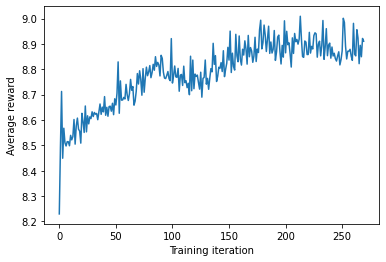

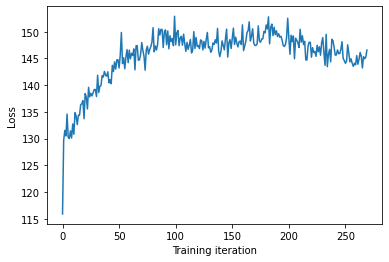






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.15it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.15it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.15it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.19it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.19it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.19it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.87it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.87it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.87it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 15.38it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.309335791952146
Proportion of valid SMILES: 0.8


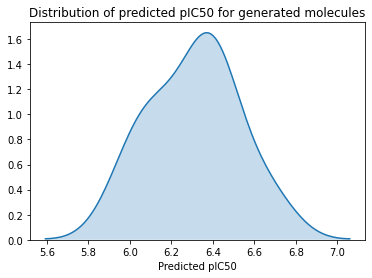






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)CNC(=O)NC(C)C(=O)NC1CCN(C)CC1
CCCCC1C(NC(=O)Nc2ccccc2OCC)CC1C1CCCCC1
CCCCN1C(=O)Sc2cc(NC(=O)NC3CCCCC3)ccc21
COc1ccc(C2CC(=COc3ccc(C#N)cc3)C(C)(C)OC2=O)cc1
COc1ccc2c(ccn2S(=O)(=O)c2cc3ccccc3[nH]2)c1







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.83s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.86s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:15,  8.00s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.95s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  8.00s/it]


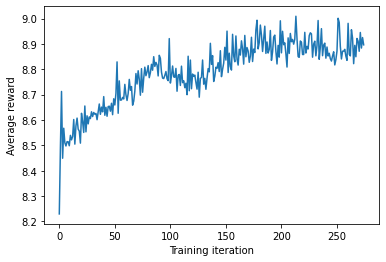

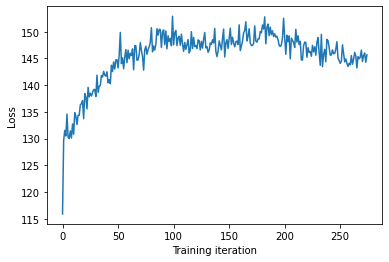






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.42it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.42it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.42it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.28it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.28it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.28it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.96it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.96it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.96it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 13.85it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.32465284659848
Proportion of valid SMILES: 0.6


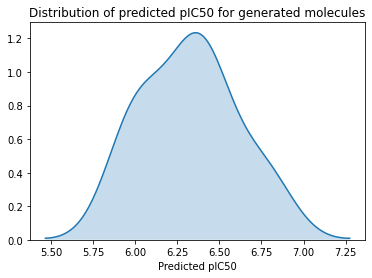






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCCCCCCS(=O)(=O)OCCCNC(C)C
CNS(=O)(=O)C1CC(=O)N(c2ccc(OC)cc2)C1c1cccc(C)c1
COC(=O)CCC(=O)N1CCC(Nc2ccc(COc3ccccc3C)nn2)CC1
COc1ccc(C(C)=O)cc1
COc1ccc(N2C(=O)c3ccccc3C2C(C)CNC(=O)c2ccccc2Cl)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.69s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.78s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.87s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.86s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.92s/it]


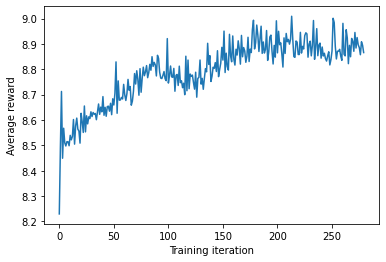

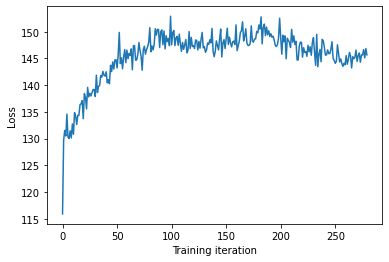






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.19it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.19it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.19it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.13it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.13it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.13it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.55it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.55it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.55it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 13.73it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.630786082633929
Proportion of valid SMILES: 0.6


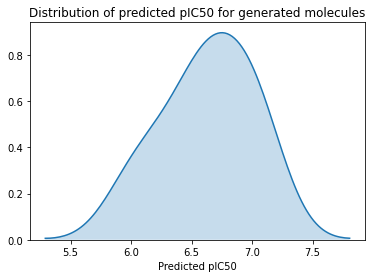






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCCn1ccc(C(=O)NC(CCc2ccc(O)cc2)C(=O)N2CCCCC2)c1
CCOc1ccc(N=NNc2cccc(CO)c2)cc1
CCc1ccc(C2(CC)CC2CN2CCOCC2)cc1
CN1CCN(C(=O)CCSc2nnc(Cc3ccccc3)o2)CC1
Cc1ccc(S(=O)(=O)NC(C)(C)C)s1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.69s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.73s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.73s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.71s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.73s/it]


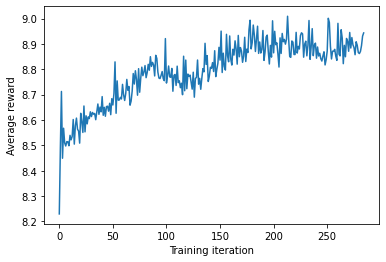

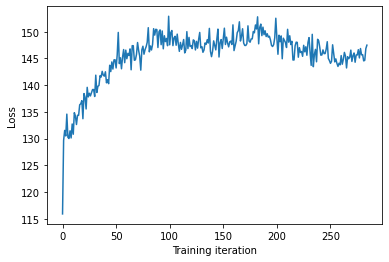






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.25it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.25it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.25it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.83it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.83it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.83it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.84it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.84it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.84it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 13.01it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.617216429286553
Proportion of valid SMILES: 0.7


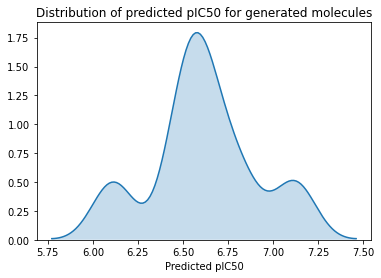






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
COC(=O)c1cc2ccccc2cc1NC(=O)c1ccc(-c2ccccc2)cc1C
COCCN1CCCN(C(=O)CNC(=O)COC(=O)CCC(=O)N2CCCCC2)CC1
COc1ccc(CNCc2c(C(=O)O)cccc2c2ccc(F)cc2C)nn1
COc1ccccc1-c1ccnn1-c1ccnc(NCCCNC(=O)NCCN(C)C)n1
COc1ccccc1C(=O)COC(=O)c1ccc(O)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.64s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:23,  7.89s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.89s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.88s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.02s/it]


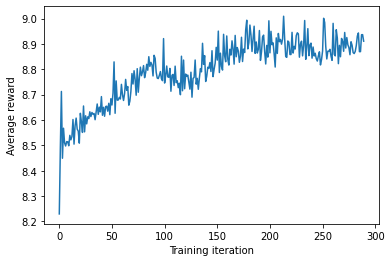

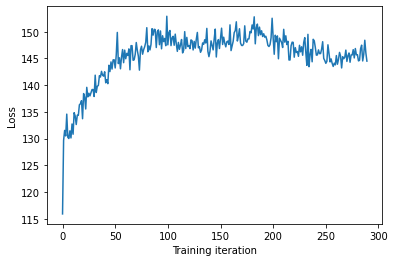






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.69it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.69it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.69it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.84it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.84it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.84it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.84it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 14.93it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 14.93it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 14.93it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00

Mean value of predictions: 6.344277358665207
Proportion of valid SMILES: 0.7


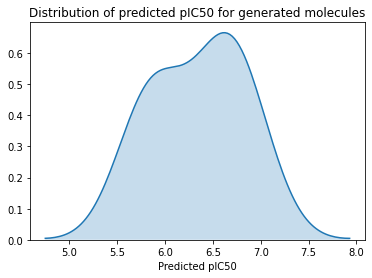






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC1CCC(C(=O)NC(Cc2ccccc2)(C(=O)c2ccc(Cl)cc2)c2ccccc2)CC1
CCCCCCCCCCCCCC(=O)Nc1cccc2cc(C(C)(C)C)nc(n1)N2CCOCC(C)C
CCCCCCCCCCCCCCn1cccc1
CCN1C=Nc2ccc(S(=O)(=O)N(C)CC(F)F)cc2C1=O
CCn1c(-c2ccccc2)nc2ccccc21







Policy gradient...:  20%|██        | 1/5 [00:08<00:32,  8.06s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:24,  8.02s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.03s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.88s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.84s/it]


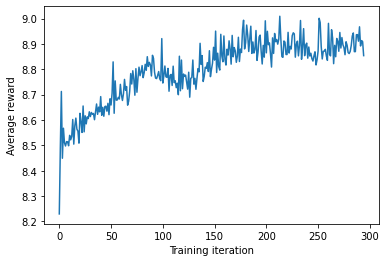

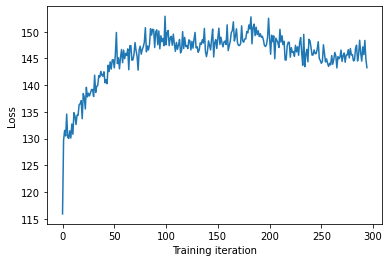






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 11.53it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 11.53it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 11.53it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 11.30it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 11.30it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 11.30it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.36it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.36it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.36it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 13.30it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.7921410544584235
Proportion of valid SMILES: 0.7


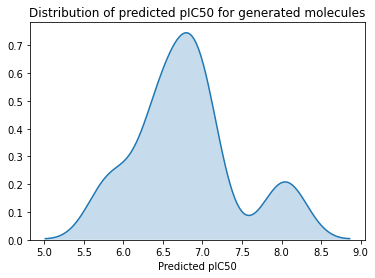






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)Nc1ccc(Oc2ccc3ccccc3c2)cc1
CN1CC(OC(=O)C2OC(n3c(-c4ccccc4)ccc3N3CCOCC3)C(O)C2O)C1
CNC(=O)c1cccc(C(=O)Nc2cccc(S(=O)(=O)N3CCCN(C)CC3)c2)c1
COC(=O)c1(C)c2c(cc(C(=O)c3cc(O)ccc3OC)n1CCc1ccc(OC)cc1)CNN(CC(C)C)SCN2
COc1ccc(C2CC(=O)N(Cc3ccc(OC(C)C)c(OC)c3)C2=O)cc1OC







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.61s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.67s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.67s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.79s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.77s/it]


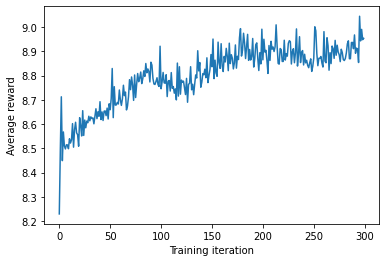

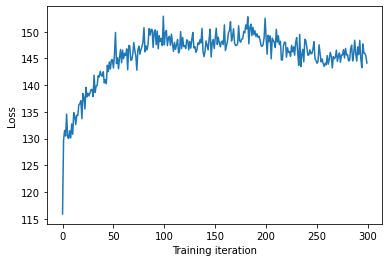






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.17it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.17it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.17it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.64it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.64it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00,  9.21it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00,  9.21it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00,  9.21it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 10.33it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 10.33it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00

Mean value of predictions: 6.715818811661149
Proportion of valid SMILES: 0.7


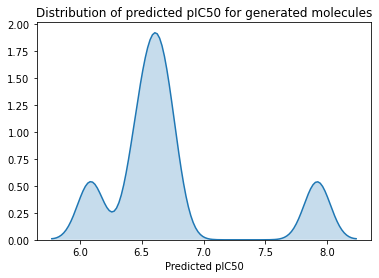






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(NC(=O)OCCF)c1cccc(C(O)C2CCCCC2)[n+]1C(=O)c1ccccc1
CC1CCCN(CCCCCNC(=O)NCc2ccccc2)CC1
COc1cc(C2=C(c3ccccc3)C(c3ccc(Cl)cc3)NC2=O)cc(OC)c1OC
COc1ccc(C=NN(C)S(=O)(=O)c2cn(CC(=O)O)c3ccccc23)cc1
Cc1ncc(-c2csc(Nc3ccc(Cl)cc3Cl)n2)cn1







Policy gradient...:  20%|██        | 1/5 [00:08<00:32,  8.06s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.93s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.99s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.94s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.82s/it]


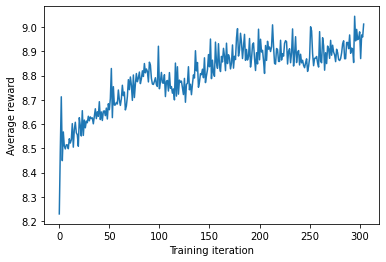

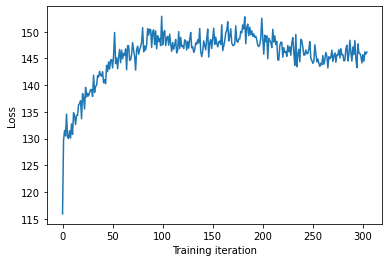






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.27it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.27it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.27it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.73it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.73it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.73it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.47it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.47it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.47it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 14.33it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.346868609195051
Proportion of valid SMILES: 0.8


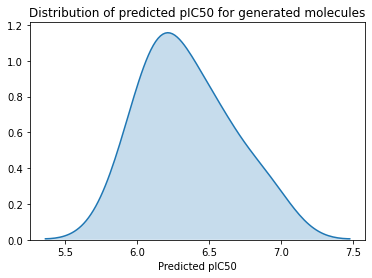






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
C=C(C)CNC(=O)Nc1ccc(NCCN2CCC(C)CC2)cc1
CCNC(=O)c1ccccc1OCC(=O)Nc1ccccc1COc1ccccc1
CN1C2CCC1C(O)C(O)C(C(O)Cn1c3ccccc3c3ccccc31)C2
CNC(=O)c1cccc(S(=O)(=O)Nc2cccnc2)c1
COc1ccccc1NC(=O)Nc1nccc(-c2ccccc2C)n1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.72s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.79s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.75s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.75s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.78s/it]


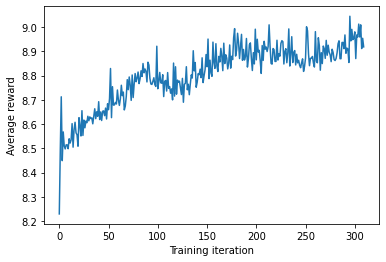

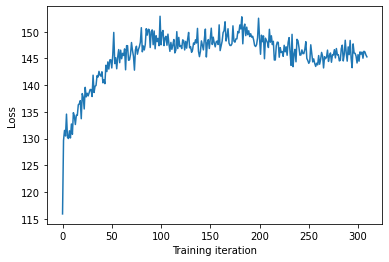






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:01,  8.83it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:01,  8.83it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:01,  8.83it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.39it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.39it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00,  9.27it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00,  9.27it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00,  9.27it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 10.68it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 10.68it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 10.68it/s]




Generating molecules...:  80%|████████  | 8/10 [

Mean value of predictions: 6.51937206600812
Proportion of valid SMILES: 0.7


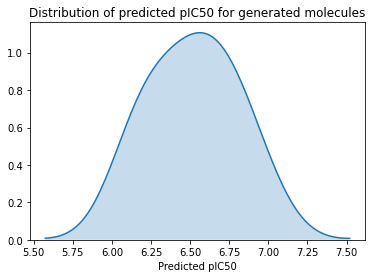






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)(C)OC(=O)N1CCCCCC1
CC(C)(N)C(=O)N1CCC(NC(=O)c2cccN3nc(CF)ccc3c2)CC1
CC(NC(CC(=O)O)NC(=O)c1cccc(C(=N)N)c1)c1ccccc1
CCN(C1=CC(=O)N(NOC(=O)CNC(=O)c2ccc(C)cc2)C1=O)c1nccs1
CCN(CC)C(=O)Nc1ccccc1OCCOc1cccc(NC(=O)COC(=O)c2ccccc2)c1







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.92s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.73s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.73s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.57s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.57s/it]


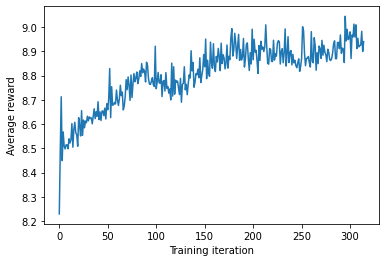

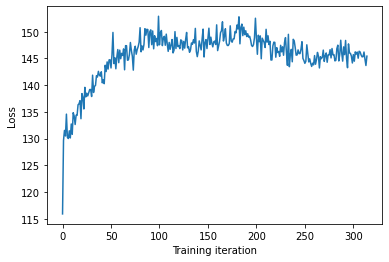






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 16.90it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 16.90it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 16.90it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 17.70it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 17.70it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 17.70it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 16.32it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 16.32it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 16.32it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00:00, 16.

Mean value of predictions: 6.572501895334549
Proportion of valid SMILES: 0.8


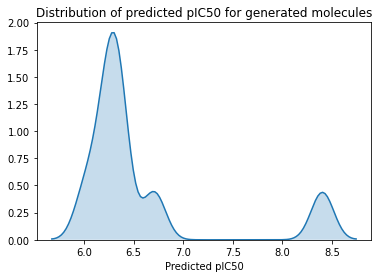






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC1CC(C(=O)O)N(C)C1
CC1CCC(=CCC(NC(=O)C2CCC2)NS(=O)(=O)C2CCCC2)CN1
CC1CN=C(N)O1
CCCCCCCn1c(-n2ccc(C(C)C)c2)cnc1C(=O)O
CN(C)CCCNc1ncnc2ccccc12







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.93s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.71s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.89s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.90s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.88s/it]


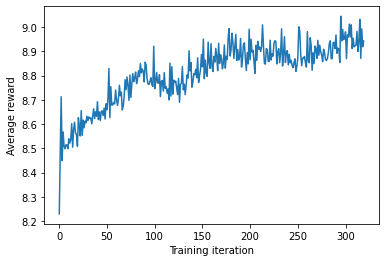

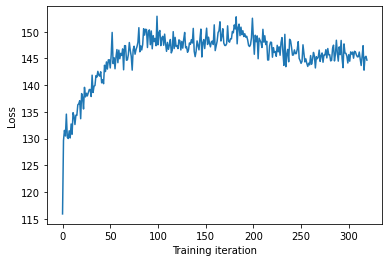






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 20.82it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 20.82it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 20.82it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 18.67it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 18.67it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 18.67it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.02it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.02it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.02it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00:00, 16.

Mean value of predictions: 6.50845178921409
Proportion of valid SMILES: 0.8


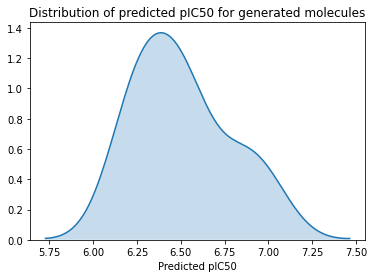






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(OC(=O)NC(CCCN)C(=O)NCc1ccccc1)C(O)c1ccccc1
CCC(C)C(N)C(=O)NC(CCCNC(C)C)C(=O)N1CCN(C(=O)Nc2ccccc2)CC1
CCCC(C(=O)OCC)c1ccccc1
CCOC(=O)CC1NC2CCCCCCCC21
CCn1ncc(C(=O)C(C)(C)NC(C)=O)c1C







Policy gradient...:  20%|██        | 1/5 [00:08<00:32,  8.10s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.05s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.95s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.89s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.88s/it]


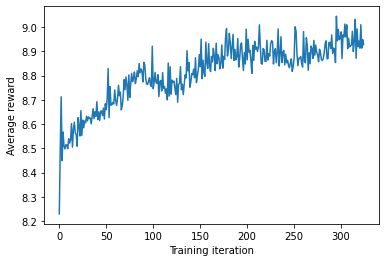

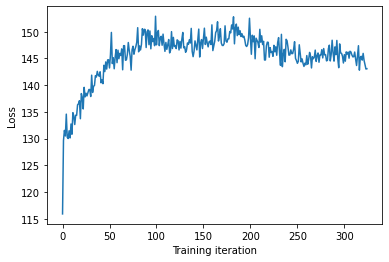






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.14it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.14it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.14it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 17.05it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 17.05it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 17.05it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.22it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.22it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.22it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 15.32it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.704497913952327
Proportion of valid SMILES: 0.6


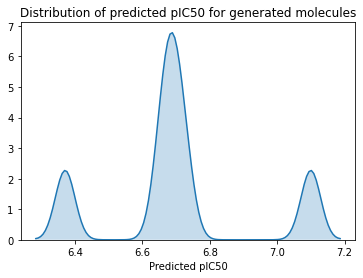






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCC1(O)C(O)CCC(C)N1C(=O)NC(Cc1ccccc1)C(=O)O
Cc1c2n(nc(c3cccc(C(F)(F)F)c3)cc-2)CCCCCOc2oc(C)nc2-1
Cc1ccc(C(=O)NCCCOc2ccccc2)cc1
Cc1nc(C)n(-c2ccccc2)n1
N#Cc1c(C(N)=O)c2ccc(-c3ccccn3)cc2cc#1







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.75s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:22,  7.57s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.67s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.64s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.65s/it]


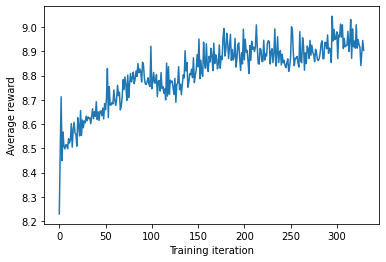

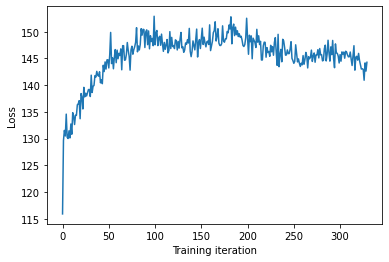






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.45it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.45it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.45it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.38it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.38it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.38it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.74it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.74it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.74it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 13.46it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.403928662143443
Proportion of valid SMILES: 0.5


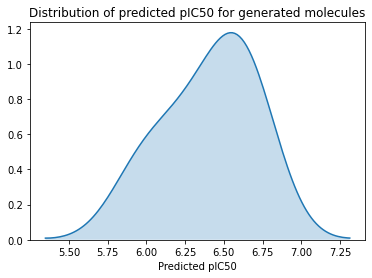






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)C(Cc1ccccc1)NC(=O)C(Cc1ccccc1)NC(=O)CC(O)C(C)O
CC1(C)NC(=O)N(CCC(=O)NCCc2ccccc2)C1=O
CN(C)CCCNC(=O)c1nc[nH]c1C(=O)NC1(OC(=O)NC(C)(C)C)CCCCC1
COc1cccc(C2CC3CC(C(=O)NCc4ccccc4)CC2CN(C(=O)OC(C)(C)C)C3)c1
Cc1cnc2cc(C(=O)NN=Cc3ccccc3C)ccc2n1







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.77s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.70s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.83s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.89s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.90s/it]


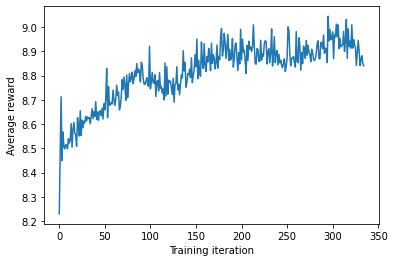

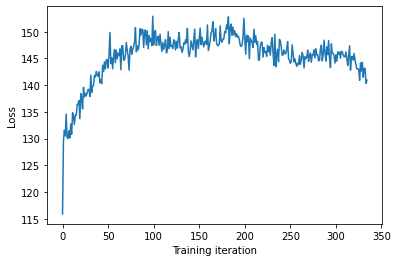






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.29it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.29it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.29it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.29it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 16.53it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 16.53it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 16.53it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 16.14it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 16.14it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 16.14it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00

Mean value of predictions: 6.530107651665033
Proportion of valid SMILES: 0.7


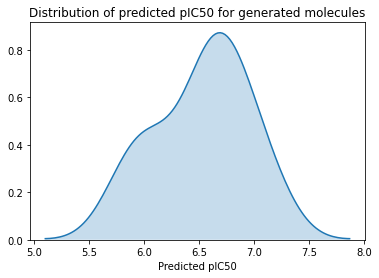






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CN(Cc1ccccc1)C(=O)CNC(=O)c1ccccc1
COCCCNc1cncnc1Nc1ccc(OC)cc1
COc1cc(C(=O)NCC2CCN(Cc3ccc(-c4ccccc4)o3)CC2)cc(OC)c1OC
COc1ccc(-c2cnc(C=Cc3ccccc3N)cn2)cc1OC
Cc1ccccc1OCC(O)CNC(C)Cc1ccccc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.72s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.76s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.75s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.79s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.82s/it]


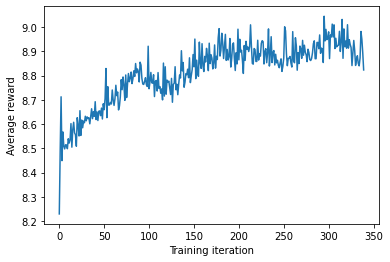

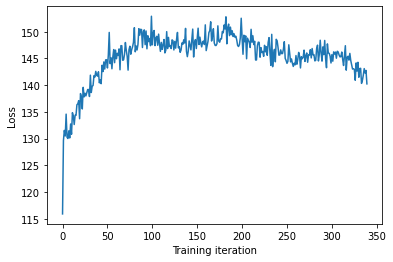






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.61it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.61it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.61it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.56it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.56it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.56it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.57it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.57it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.57it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 12.49it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.236374266530778
Proportion of valid SMILES: 0.5


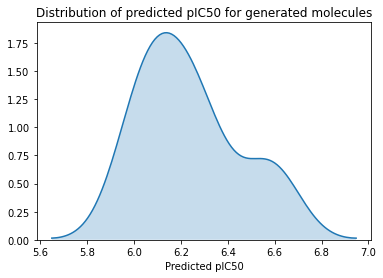






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
COC(=O)c1ccc(N2N=NC(C)=C(c3ccccc3)N2C)cc1
Cc1ccc(C)c(NC(=O)Nc2cc(NC(=O)Nc3cccc(-c4ccncc4)n3)ccc2Cl)c1
Clc1cccc(C2Sc3ccccc3N=C2SCCCc2ccccc2)c1
NCc1cccc(Oc2ccccc2)c1
O=S(=O)(NCCCCNc1ccc2ccccc2c1)c1cccc(NCCO)c1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.63s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.60s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.64s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.70s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.76s/it]


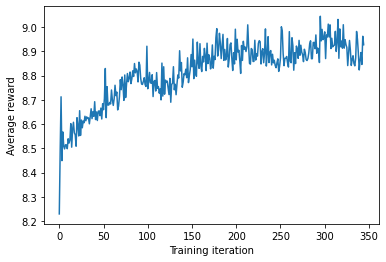

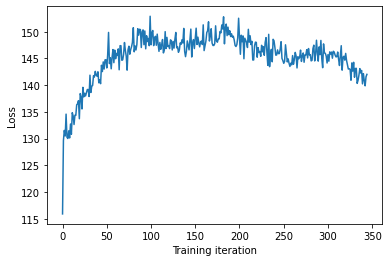






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.46it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.46it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.46it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.60it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.60it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.60it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.15it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.15it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.15it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.20it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.20it/s]




Generating molecules...:  70%|███████   | 7/10 [

Mean value of predictions: 6.755016389739887
Proportion of valid SMILES: 0.7


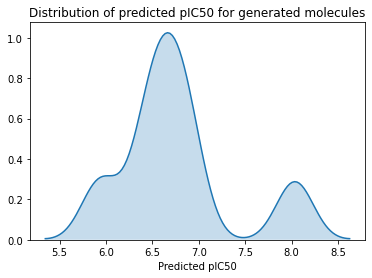






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)Nc1cccc(Cc2ccc3[nH]ccc3c2)c1
CCN1CCCC(C(=O)NCc2ccccc2)(c2cccc(C(F)(F)F)c2)CC(=O)N2CCN(C)CC12
CCOC(=O)c1cnccc1CN(CCCN1CCN(C(=O)C(CO)NC(=O)C(C)NC(C)=O)CC1)c1ccccc1
COCCN(C)S(=O)(=O)NC(=O)NCCCNCCNCC(O)COc1ccccc1
Cc1cccc(C(=O)N2CCCN(CC(=O)c3ccc(OCC4CCCCC4)c(C#N)c3)CC2)c1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.59s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.59s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.62s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.58s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.65s/it]


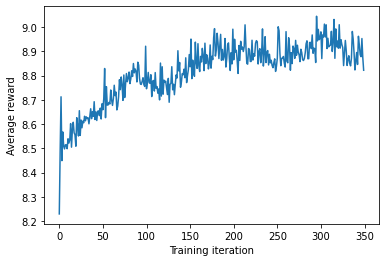

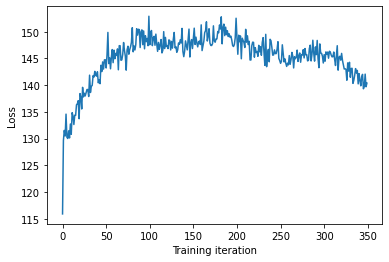






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.90it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.90it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.90it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.94it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.94it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.94it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 17.08it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 17.08it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 17.08it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 15.84it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.406315676266535
Proportion of valid SMILES: 0.7


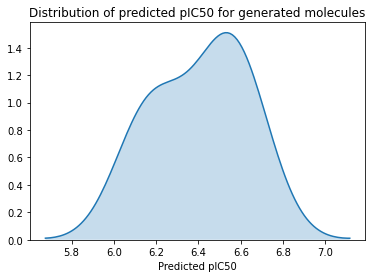






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
C#CCCCCCCCCCCc1cccc(N(C)CC(N)=O)c1
CC(C)(C)n1nc2ccccc2c1-c1ccccc1
CC(C)C(C)NC(=O)C1CCCN(Cc2ccccc2)C1
CC(C)CN1NC(=O)NC1=NC(=O)Oc1ccccc1
COc1ccc(C(=O)N2CCN(C(=O)C(Cc3ccc(OC)c(N)c3)NC(C)=O)CC2)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.80s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.68s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.67s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.67s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.63s/it]


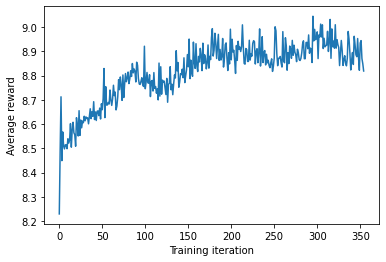

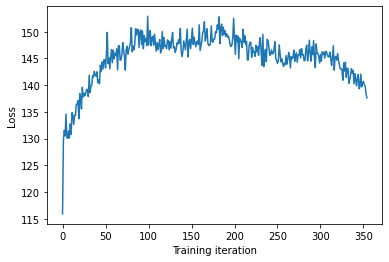






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:01,  8.91it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:01,  8.91it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:01,  8.91it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.24it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.24it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.24it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.83it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.83it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.83it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.83it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 13.94it/s]




Generating molecules...:  80%|████████  | 8/10 [

Mean value of predictions: 6.26293580069467
Proportion of valid SMILES: 0.8


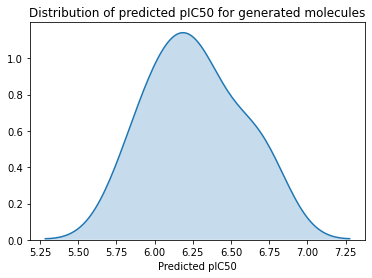






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC1CN(C(=O)N2CCNCC2)CC1CN
CCOc1ccccc1N1CCc2ccccc2C=CC1C(=O)O
CCOc1ccccc1NC(=O)Nc1ccccc1
CCS(=O)(=O)N1CCc2ccccc21
COc1cc(O)cc(CC=C(C)c2ccc(SC)cc2)c1







Policy gradient...:  20%|██        | 1/5 [00:08<00:32,  8.20s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:24,  8.02s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:16,  8.05s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.96s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.96s/it]


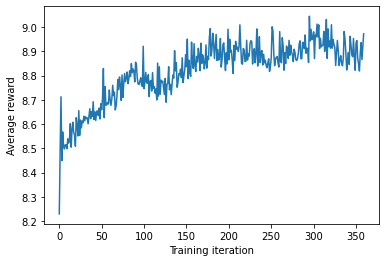

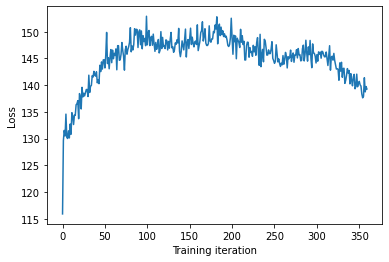






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.66it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.66it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.66it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.56it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.56it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.56it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.84it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.84it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 10.59it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 10.59it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.50253578886736
Proportion of valid SMILES: 0.8


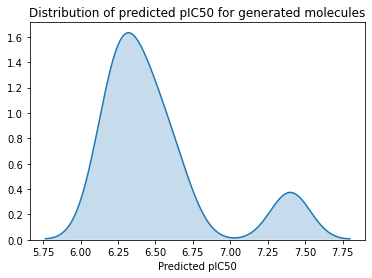






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)CCN(CC(=O)NCc1ccccc1)C(=O)CCOc1ccccc1
CN(C)CCNc1ccccc1CNC(=O)Cn1ccnc1
COCCN(C)C(=O)N1CCN(c2cccc(NC(=O)c3cccs3)c2)CC1
COc1cc(OC)c(-c2ccccc2F)cc1C=NNC(=O)c1cc(S(=O)(=O)N2CCSCC2)ccc1Cl
COc1cccc(C2NCc3ccccc3N2C(=O)c2ccc(Cl)cc2)c1







Policy gradient...:  20%|██        | 1/5 [00:07<00:29,  7.43s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.51s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:14,  7.47s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.51s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.53s/it]


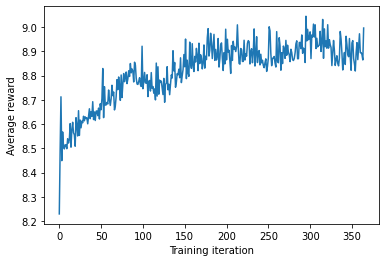

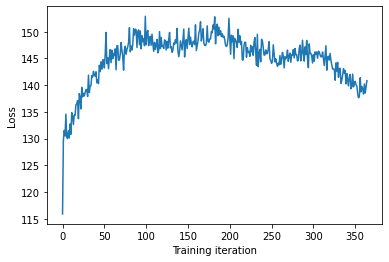






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.61it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.61it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 12.05it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 12.05it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 12.05it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 12.68it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 12.68it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 12.68it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 13.08it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 13.08it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00

Mean value of predictions: 6.390049969683999
Proportion of valid SMILES: 0.8


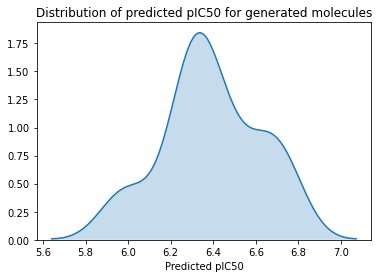






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC1CCC(C)(N2N=C(c3ccccc3)C(c3ccccc3)=N2)COC1
CCc1ccc(N2C(=O)NC(=O)C(=Cc3ccccc3)C2=O)cc1
COc1ccc(C(O)C(C)(C)OC(=O)CN(C)C)cc1
COc1ccc(OC(C)CNC(=O)NC(CC(=O)N2CCN(C(C)C)CC2)C(C)C)cc1
COc1ccc(S(=O)(=O)CC2(C)CCCC(C)(C)C2)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.52s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:22,  7.41s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:14,  7.48s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.53s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.48s/it]


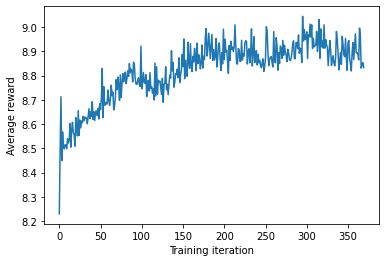

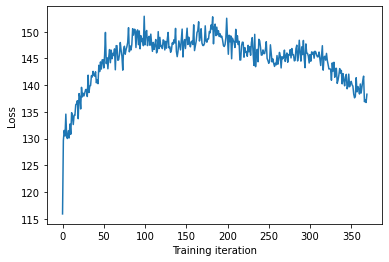






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 11.92it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 11.92it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 11.92it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.25it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.25it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.25it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.52it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.52it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.52it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 13.50it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.400804686495692
Proportion of valid SMILES: 0.8


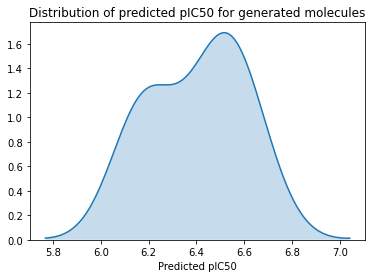






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=NNC(=O)c1ccccc1)N(C)CC(=O)Nc1cccc(C(F)(F)F)c1
CC(C)(C)C1(NC(=O)Nc2ccc(N3CCC(C(=O)O)CC3)cc2)CCCC1
CCC(C)C(=O)NC(CCCNC(=N)N)C(=O)NC(CC(=O)O)C(=O)NC(CCC(C)C)NC(=O)OC(C)(C)C
CCCCN(CCC)C(=N)N
CNC(=O)C1(C(N)=O)CCN(Cc2ccccc2)CC1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.56s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:22,  7.49s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.52s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.63s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.55s/it]


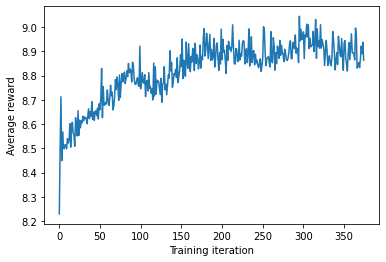

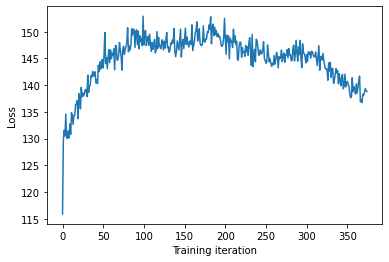






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.41it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.41it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.41it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.41it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 14.44it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 14.44it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 14.44it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 13.40it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 13.40it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 13.40it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00

Mean value of predictions: 6.30160095615854
Proportion of valid SMILES: 0.7


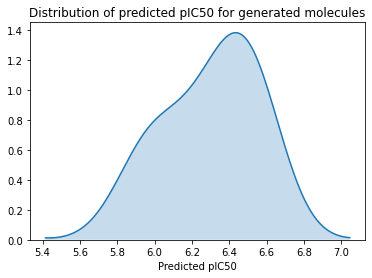






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC1CC(C)N(c2ncccn2)C1
CCOC(=O)CCCCCCCCNc1cccc(CCNC(=O)c2ccccc2)c1
COc1ccc(S(=O)(=O)Nc2ccccc2NC(=O)c2ccccc2)cc1
COc1ccccc1N1CSCC(NC(=O)NCCN2CCN(c3ccccc3)CC2)C1=O
Cc1ccccc1NCc1ccc(OC(F)(F)F)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.72s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.73s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.78s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.75s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.71s/it]


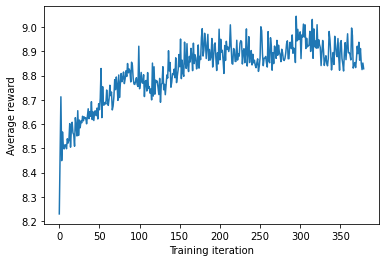

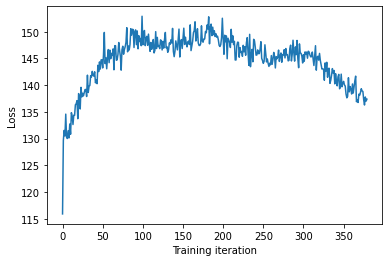






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 11.47it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 11.47it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 11.47it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 11.31it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 11.31it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 11.31it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 11.61it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 11.61it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 11.61it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 12.10it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.519360922055926
Proportion of valid SMILES: 0.8


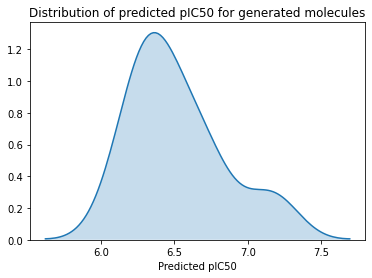






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(NC(=O)C1COCCN1C(=O)C(=O)NCC(O)c1ccccc1)c1ccccc1
CN1CCc2nc(NC3CCCCC3)c(C(F)(F)F)nc2C1
Cc1c2cc3CCOc4ccccc4C3CN(C2)C(CCCN)CCc2ccccc2C1
Cc1ccc(S(=O)(=O)N2CCCC2c2nc(-c3cccnc3)nc3cccnc23)cc1
N#Cc1ccc(C(O)c2nnn3c2CCCC3)cc1







Policy gradient...:  20%|██        | 1/5 [00:06<00:27,  6.94s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:21,  7.25s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:14,  7.41s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.35s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.46s/it]


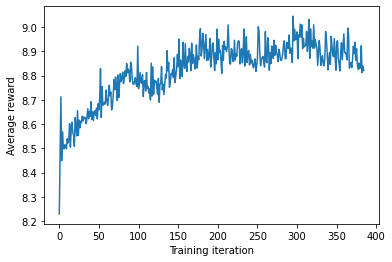

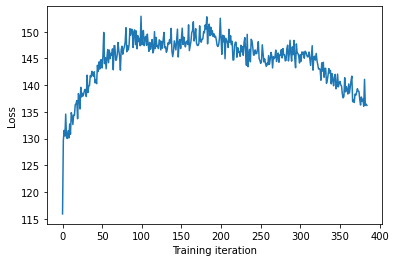






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.70it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.70it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.70it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.30it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.30it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.30it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.51it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.51it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.51it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.51it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00

Mean value of predictions: 6.729009797934654
Proportion of valid SMILES: 0.6


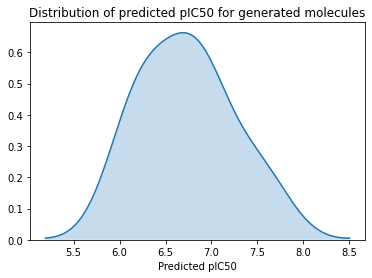






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
C=CCCN1C(=O)Cc2c(Cl)cccc2NC1=O
CC(C)CC(C)(C)CCNc1ncnc2cc(C(=O)O)ccc12
CCCCS(=O)(=O)NCc1cccnc1
CN1CCCCc2ccccc21
CNCCN(C)C(=O)c1cc(C)nc(C)c1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.60s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:22,  7.51s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.61s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.58s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.64s/it]


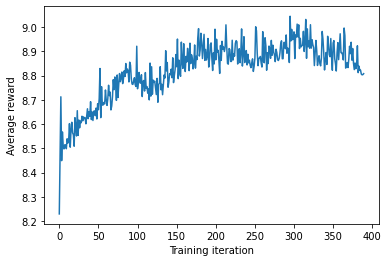

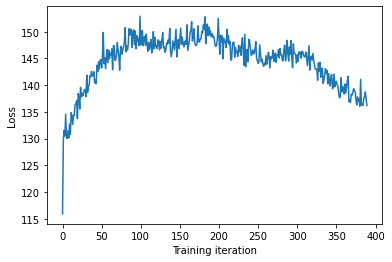






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.91it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.91it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.91it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.91it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 16.87it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 16.87it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 16.87it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 16.88it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 16.88it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 16.88it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00

Mean value of predictions: 6.428722096121381
Proportion of valid SMILES: 0.7


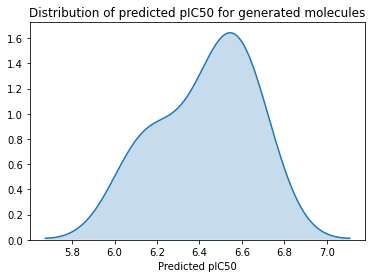






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)c1ccccc1OC1CCNCC1
CCCCOc1cccc(-c2c(C(N)=O)cccc2C2CCC(C)N2)c1
CN1CCCC(NC(=O)c2nccs2)C1
COc1ccccc1CN1CCC(N2CCN(Cc3ccc(C)cc3)CC2)CC1
NC1=NS(=O)(=O)c2ccccc2C1=O







Policy gradient...:  20%|██        | 1/5 [00:07<00:29,  7.46s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.52s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:14,  7.44s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.46s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.45s/it]


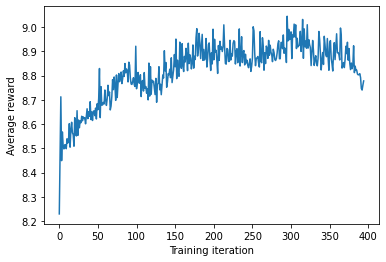

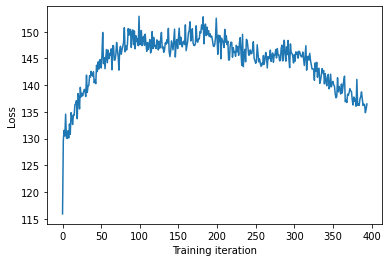






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 19.28it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 19.28it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 19.28it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 18.62it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 18.62it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 18.62it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 18.42it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 18.42it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 18.42it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00:00, 17.

Mean value of predictions: 6.330627916186014
Proportion of valid SMILES: 0.5


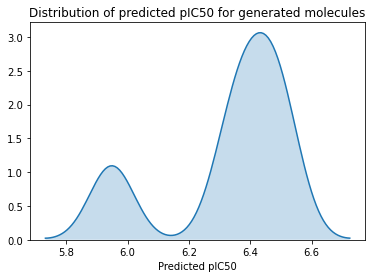






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCC(C)N(C)C(C)CNC(=O)Oc1ccc2ccccc2c1
CCN(C)C(=O)CCCNC(=O)c1cccc(S(C)(=O)=O)c1
CCOC(=O)c1cc(OCC(=O)O)ccc1C
Cc1ccc(CNCCC2NCCC2Cc2ccc(C#N)cc2)c(C)c1
O=C1NN=C(S)C1=O







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.81s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.73s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.67s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.68s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.63s/it]


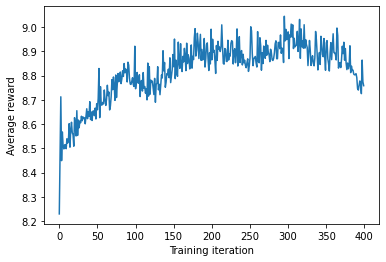

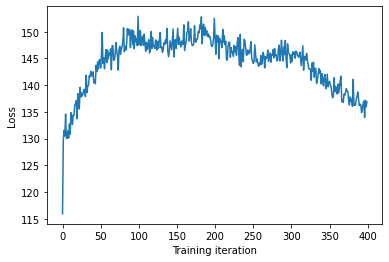






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 19.75it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 19.75it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 19.75it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 17.78it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 17.78it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 17.78it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 16.77it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 16.77it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 16.77it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00:00, 15.

Mean value of predictions: 6.460462659754196
Proportion of valid SMILES: 0.8


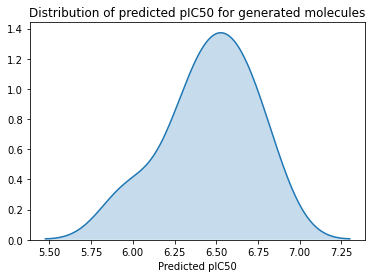






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)(C)c1ccccc1-c1nnc(-c2ccncc2)o1
CCCCCNC(=O)C(CC1CCCCC1)NC(=O)C(CCNC(C)=O)NC(=O)CC(=O)O
CCOCCCNC(=O)c1ccc(F)cc1
CCc1ccc(C(C(C)=O)=C(c2ccccc2)S(=O)(=O)CCF)cc1
COc1ccc(-c2ccc(OCC(=O)Nc3ccc(F)cc3)cc2)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.54s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:22,  7.47s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:14,  7.42s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.55s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.47s/it]


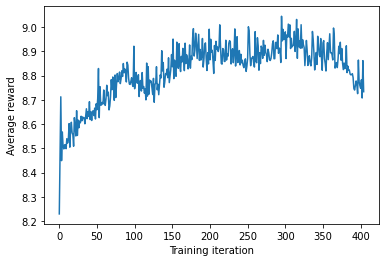

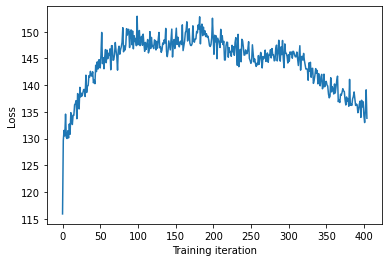






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 18.89it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 18.89it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 18.89it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.21it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.21it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.21it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.64it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.64it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.64it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 16.36it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.405271263919406
Proportion of valid SMILES: 0.6


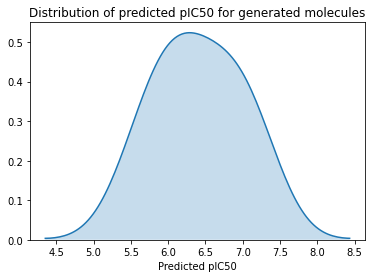






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)CC(F)(F)C(=O)Nc1cccc(N2CCC(C(=O)NCCc3ccccc3)CC2)c1
CC(C)c1ccc(-c2ccc(N3CCN(C)CC3)cc2)cc1COc1cccc(S(N)(=O)=O)c1
CCNCC(O)COc1ccccc1C=CC(=O)N1COc2ccccc21
COc1cccc(OC)c1NC(=O)c1nocc1CC(C)C
COc1ccccc1N(=O)=O







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.97s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.92s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.78s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.89s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.81s/it]


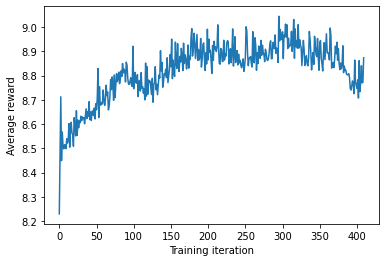

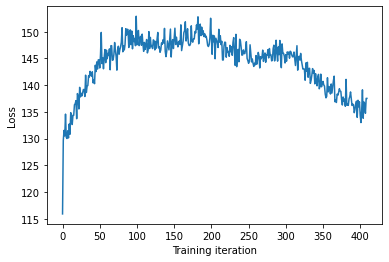






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 19.24it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 19.24it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 19.24it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 17.38it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 17.38it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 17.38it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 17.56it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 17.56it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 17.56it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 17.65it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.599177189978644
Proportion of valid SMILES: 0.7


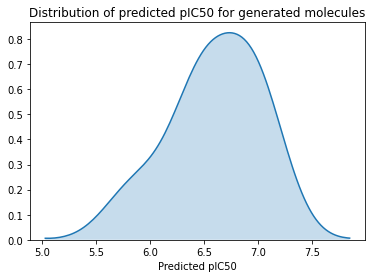






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC1CCc2cc(C(CCc3ccccc3)C(=O)O)ccc2N1C
CC1CN(C(=O)N2CCc3c2ccnc3S(=O)(=O)NC2CCCCC2)C(C)C1O
CCN(CCSCCNCCCN(C)C)c1cccc(O)c1O
CCOc1ccc2c(n1)-c1ccccc1Nc1ccccc1N2
CCn1nc(C)cc1CNC(=O)c1ccc(OC)c(OC)c1







Policy gradient...:  20%|██        | 1/5 [00:07<00:29,  7.29s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.48s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:14,  7.49s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.47s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.44s/it]


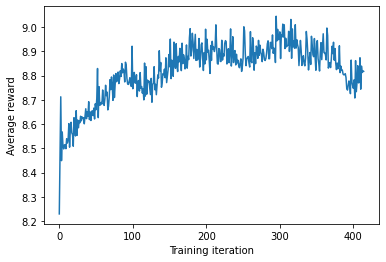

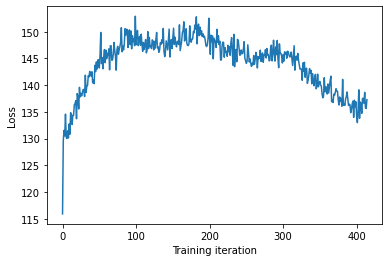






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.77it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.77it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.77it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.98it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.98it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.98it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.98it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.01it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.01it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.01it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00

Mean value of predictions: 6.344307460408769
Proportion of valid SMILES: 0.8


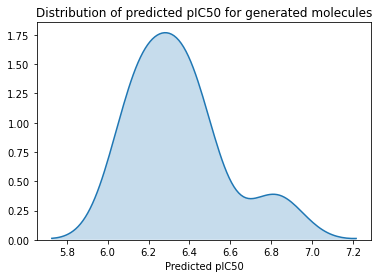






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCCCN(C)c1nc(C)nc2ccccc12
CCOc1cccc(C(C(=O)Nc2ccccc2F)N2CCN(C)CC2)c1
COc1cc(C2=C(C)NC(=O)N2Cc2ccccc2)ccc1O
Cc1ccccc1-c1cnc(N)nc1-c1ccccc1C(=O)O
Cc1ccnc(-n2cc(N(=O)=O)C(=O)c3ccc(N(=O)=O)cc32)c1







Policy gradient...:  20%|██        | 1/5 [00:08<00:33,  8.27s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:24,  8.10s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:16,  8.01s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.92s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.93s/it]


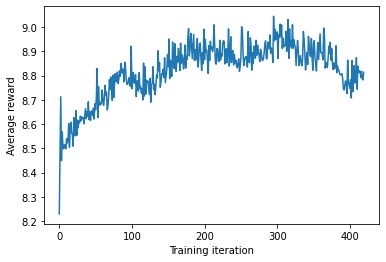

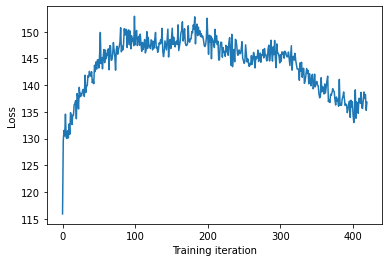






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.26it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.26it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.26it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.28it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.28it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.28it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.62it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.62it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.62it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 13.82it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.487816890792609
Proportion of valid SMILES: 0.8


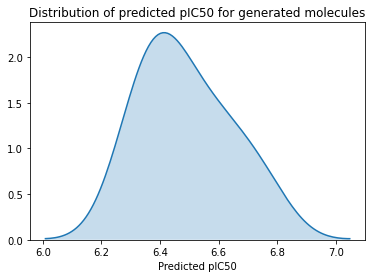






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCCCCCCCCCCCS(=O)CCC(=O)NC(Cc1ccc(O)cc1)C(N)=O
CCCCCCn1cnc(S(=O)(=O)N2CCOCC2)n1
CCCCCNC(=O)Nc1cccc(C(N)=O)c1
CCCOc1ccccc1Nc1c(C#N)cnc2ccccc12
CCOC(=O)c1ccc(NC(=O)CCCN2C(=O)CCCC2C)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.55s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.63s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.66s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.56s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.64s/it]


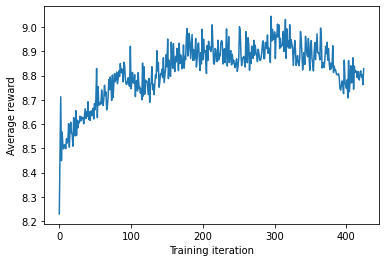

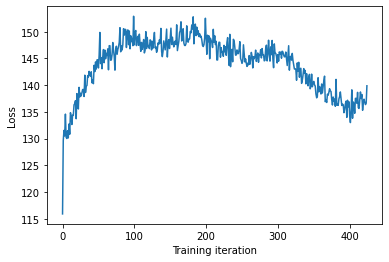






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.68it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.68it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.68it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.55it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.55it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.55it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.08it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.08it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.08it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 14.87it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.473009030774781
Proportion of valid SMILES: 0.5


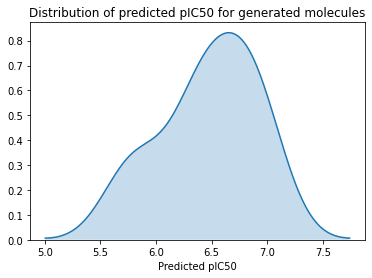






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCC(CC)Oc1ncc(Cl)cc1NC(=O)CNC(C)=O
CCOC(=O)c1sc(C)c(C)c1C(=O)N1CCN(C(=O)CCc2ccccc2)CC1
CNCCCNc1cc(O)ccc1C(=O)CCCNS(C)(=O)=O
Fc1cnc(C2CCCN2Cc2cccs2)cn1
NC1CCN(Cc2ccccc2)C1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.53s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.60s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.76s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.73s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.73s/it]


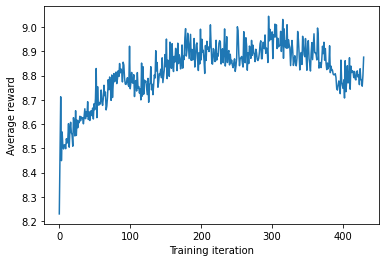

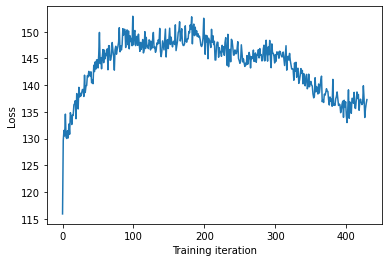






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 21.18it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 21.18it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 21.18it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 20.65it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 20.65it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 20.65it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 19.72it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 19.72it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 19.72it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00:00, 19.

Mean value of predictions: 6.37262746024281
Proportion of valid SMILES: 0.7


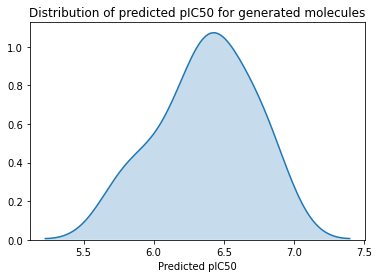






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)(C)Cc1nccnc1OCC1CC1
CC(C)=CCCC(C)=CCC=CCCCCC(O)C1CCC=CCCCCC(O)CC1
CC1=C(O)C(=O)N(Cc2ccccc2)C1=O
CC1=NN(CCNC(=O)c2ccc3c(c2)CNC(=O)N3)CC(O)C1O
CCN1C(=S)NN=C1CNC(C)C







Policy gradient...:  20%|██        | 1/5 [00:07<00:29,  7.37s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:23,  7.76s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.69s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.75s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.78s/it]


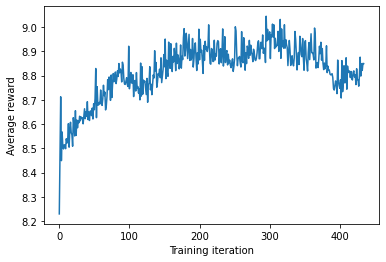

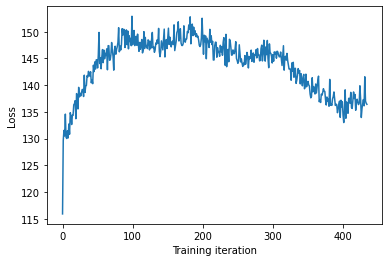






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.96it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.96it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.96it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.40it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.40it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.40it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.43it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.43it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.43it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 14.31it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.556552810764416
Proportion of valid SMILES: 0.8


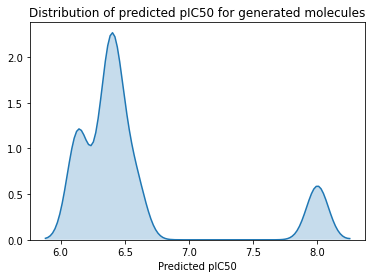






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)N1CCN(Cc2ccc(N(=O)=O)cc2)CC1
CCCc1ccc(CNC2CCN(C(=O)c3cccc(C)c3Oc3ccc(C(=O)O)cc3)CC2)cc1
CCN(CCN1CCOCC1)C(=O)NCCOC
CN1CCC23C(O)CCC4(C)C(CCC2C3(C)C(=O)C1)C1(C)CCC(C)(C)C41
COCCCNC(=O)c1ccccc1NC(=O)c1ccc(C)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:29,  7.39s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.51s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.54s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.70s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.73s/it]


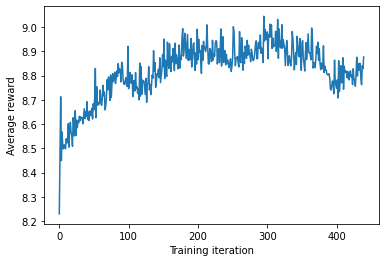

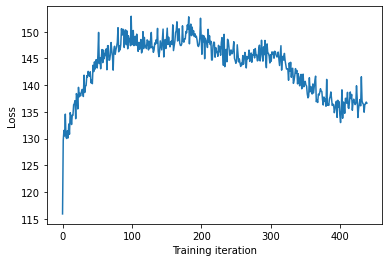






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.06it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.06it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.06it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.33it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.33it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.33it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.78it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.78it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.78it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 14.40it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.643981976262436
Proportion of valid SMILES: 0.7


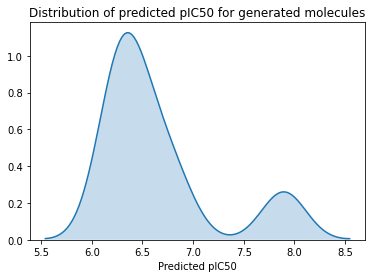






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCNCCCN(C)CC(O)COCCN(C)C
CN1CCN(C2=C(O)C(=O)Nc3ccccc32)CC1
COC(=O)C1(c2ccccc2)CCN(S(=O)(=O)c2ccc(S(C)(=O)=O)cc2)CC1
COc1ccc(OC)c(S(=O)(=O)CCCC2CCCCC2)c1
C[N+]([O-])=C1C(=O)N(CC#CCO)c2ccccc21







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.68s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.72s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.69s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.59s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.61s/it]


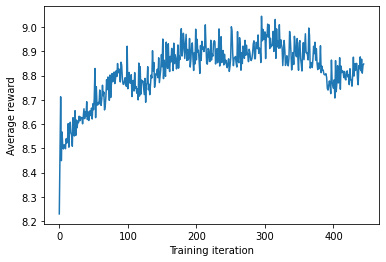

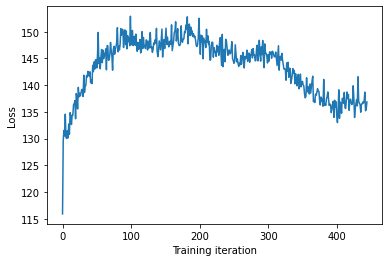






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.09it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.09it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.09it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.09it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 18.18it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 18.18it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 18.18it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.57it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.57it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.57it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00

Mean value of predictions: 6.444134796458577
Proportion of valid SMILES: 0.6


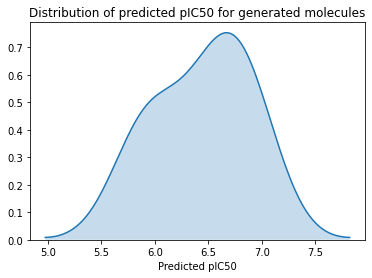






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCCC1NC(=O)C(c2ccc(O)cc2)OC(C)=CC1=O
CCCCCC(=O)Nc1ccc(C(C)(C)C)cc1
CN1CCN(C(=O)c2ccccc2Nc2ccc(N(Cc3ccccc3)C(=O)OCc3ccccc3)cc2)CC1
COc1cccc(C(=O)C(=O)NCc2ccccc2)c1
CSCC(=O)Nc1ccc2cc(SC)ccc2c1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.71s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.63s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.68s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.80s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.76s/it]


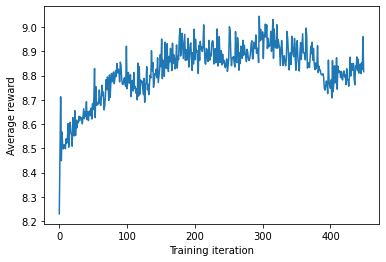

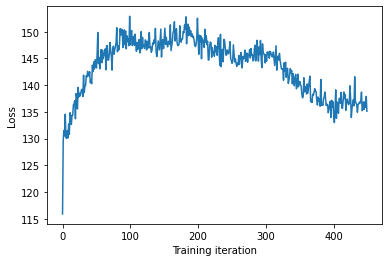






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 18.78it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 18.78it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 18.78it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 18.78it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 18.88it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 18.88it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 18.88it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 18.08it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 18.08it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 18.08it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00

Mean value of predictions: 6.446195924252009
Proportion of valid SMILES: 0.7


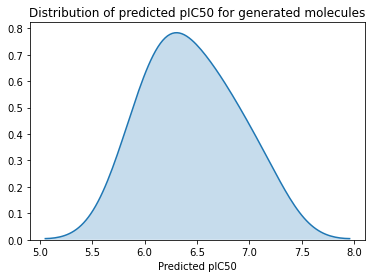






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(Oc1ccc(C=CC(=O)NCCCCl)cc1)c1ccc(O)c(N)c1
CCN(CC)C(=O)COc1cccc(C2CC2)n1
COC(=O)C1=C(C)CCCCC1
COC(=O)N(C)CC(=O)COc1ccccc1
COCCOCCCNc1nc(N2CCN(c3cc(C)cc(C)n3)CC2)ccc1C







Policy gradient...:  20%|██        | 1/5 [00:07<00:28,  7.08s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:21,  7.26s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:14,  7.42s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.37s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.51s/it]


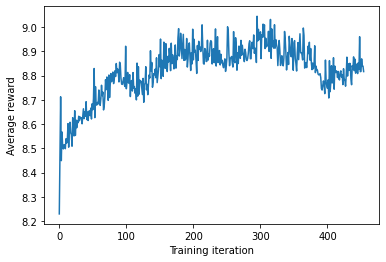

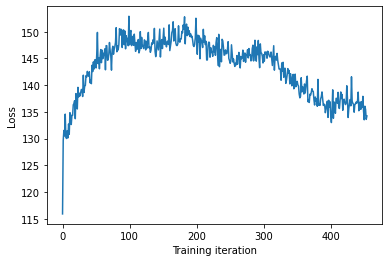






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.55it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.55it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.55it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.73it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.73it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.73it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.32it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.32it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.32it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 13.84it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.736174163099341
Proportion of valid SMILES: 0.7


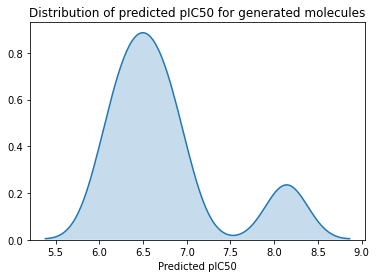






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)NC(C)(C)c1ccccc1
CC(CCc1ccccc1)NCCCOc1cccc(C(=O)NC2CCOCC2)c1
CCCCCCC(C)N(C)CCCC(CCN1CCN(c2ccccc2Cl)CC1)C(=O)NC1CCCC1
CCN(CC)C(=O)C1CCN(S(=O)(=O)N2CCN(C(=O)CC(C)N)CC2)CC1
COc1ccc(CNC(=O)C(N)COc2ccccc2)cc1OC







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.60s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:22,  7.52s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:14,  7.45s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.67s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.60s/it]


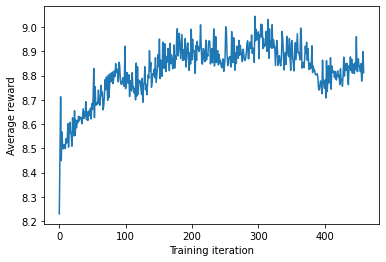

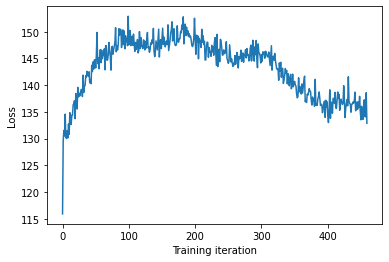






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.53it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.53it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.53it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.43it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.43it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.43it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.14it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.14it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.14it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 14.19it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.251873601552657
Proportion of valid SMILES: 0.7


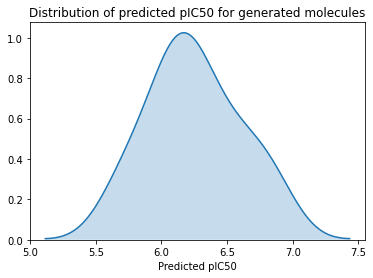






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC1CCC2CC3(O)C(C1CCC31CCC(C)C3(COC3(N=O)C(C)(C)CCC=CCC(N)=O)O1)C2CC(O)C(C)(C)Cl
CCN(CC)CCOc1ccccc1N1CCOCC1
COCCNC(=O)C1COCCN1Cc1ncnc2ncccc12
COc1cccc(C2=Nc3ccccc3NC2=O)c1
CSSCCCS(=O)(=O)N1CC(Cc2ccccc2)CCCN1CC1CCC1







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.95s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.92s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.90s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.72s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.71s/it]


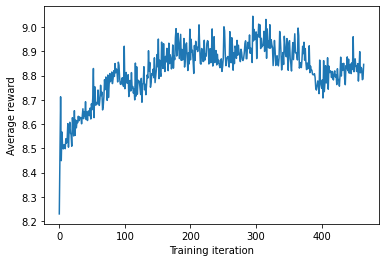

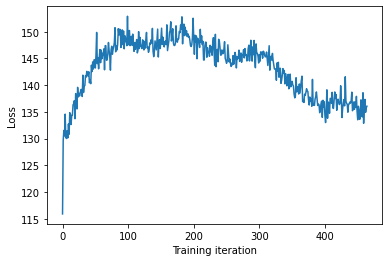






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.25it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.25it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.25it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.38it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.38it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.38it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.38it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 15.77it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 15.77it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 15.77it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00

Mean value of predictions: 6.361438611139796
Proportion of valid SMILES: 0.8


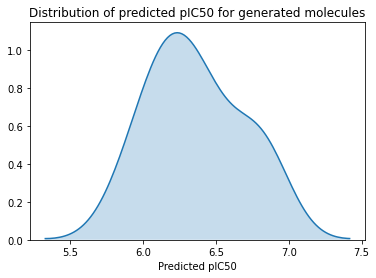






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCC(Cc1ccc(O)cc1)=NNC(N)=O
CCCCCc1ccc(C2CCCCC2)cc1
CCCc1ccc(C(=O)N2CCN(C(=O)C(C)NC(C)=O)CC2)cc1
COCC(=O)OCCN(C)C
COc1cc(C2=C(O)COC2=O)cc(OC)c1OC







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.76s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.66s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.71s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.59s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.60s/it]


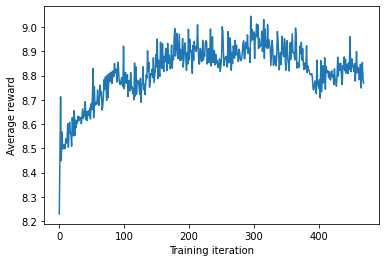

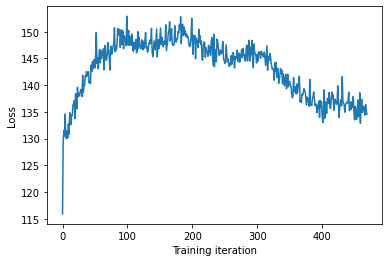






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.09it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.09it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.09it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.02it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.02it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.02it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.94it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.94it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.94it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 14.60it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.60258864627359
Proportion of valid SMILES: 0.7


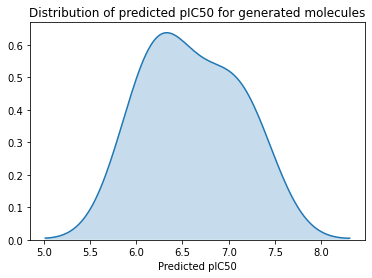






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)CNS(=O)(=O)c1ccc(NC(=O)CCCNC(=O)C(C)C)s1
CCN(CC)c1ccc(-c2nc(SC)ns2)cc1
CCc1ccccc1C(C)(N)C(=O)NC(C(=O)NCc1ccccc1C(O)(O)C(F)(F)F)C(O)C(C)C
CNC(=O)c1ccc(-c2ccncc2)cn1
COc1ccc(N2CCN(C(C)(C)C3CCC(C)CC3)CC2)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.61s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.65s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.67s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.60s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.60s/it]


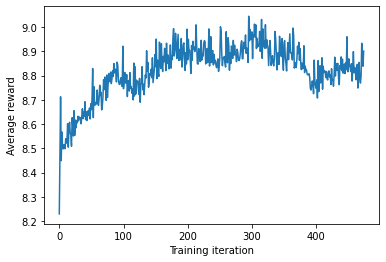

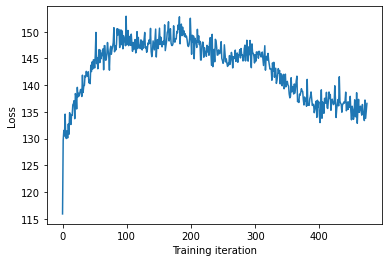






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.46it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.46it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.46it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.57it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.57it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.57it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.13it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.13it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.13it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.78it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.78it/s]




Generating molecules...:  70%|███████   | 7/10 [

Mean value of predictions: 6.342160809238069
Proportion of valid SMILES: 0.7


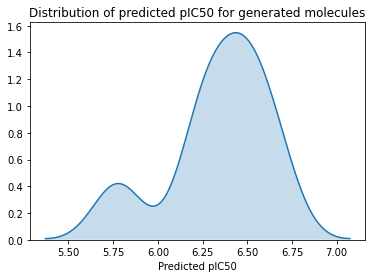






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC1CCC(C(=O)Nc2ccccc2)CC1
CCOC(=O)COC(=O)C(C)NC(=O)C(C)NC(=O)COc1ccccc1
COc1ccc(C(=O)Nc2cccc(S(=O)(=O)N(c3ccccc3)c3ccccc3)c2)cc1
COc1ccccc1C(=O)NC(Cc1ccc(C(=O)O)cc1)c1ccccc1
Cc1ccc(C)c(OCCNC(=O)c2ncc(N(=O)=O)s2)c1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.64s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.66s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.72s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.67s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.76s/it]


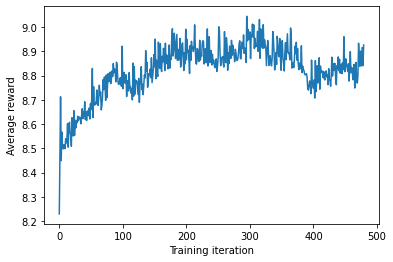

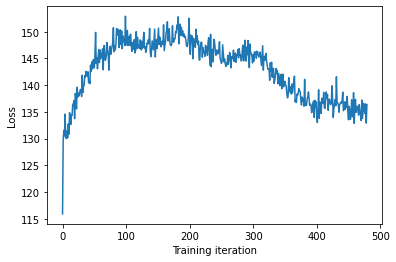






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 18.34it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 18.34it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 18.34it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.20it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.20it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.20it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.53it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.53it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.53it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 16.55it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.478974494941801
Proportion of valid SMILES: 0.8


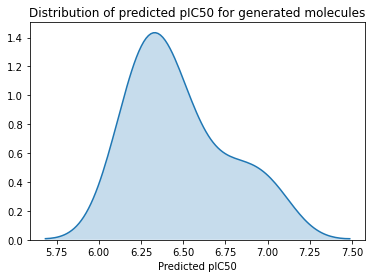






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)c1cccc(S(=O)(=O)N=C(N)NCCN(C)C)c1
CC(C)C(=O)NC(C)C(=O)NCCCNC(=O)NC(C)(C)C
CC1(C)CN(S(=O)(=O)Nc2ccccc2)CCO1
CCN(CC)CCCNC(=O)c1ccc(S(=O)(=O)NC(=O)Nc2ccccc2N2CCOCC2)cc1
CCOCCOc1ccc(Cc2ccccc2O)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.96s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.95s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.82s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.80s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.72s/it]


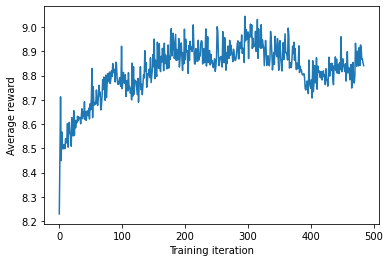

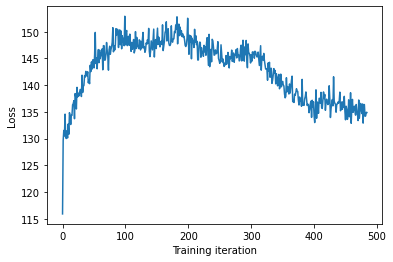






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 23.90it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 23.90it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 23.90it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 21.74it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 21.74it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 21.74it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 20.15it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 20.15it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 20.15it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 20.

Mean value of predictions: 6.366575627105462
Proportion of valid SMILES: 0.8


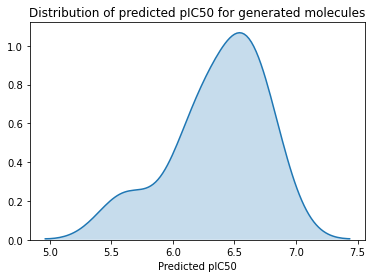






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCCCCCCCCCC(=O)Nc1cccc(N(=O)=O)c1
CCOC(C)(C)COc1cc(-c2ccccc2)nc(N)n1
CCON=C1CCN(Cc2ccccc2)CC1
CN1CN2c3ncnc(c32)N(C)C1=O
CON=C1C(=O)N(C)c2ccccc21







Policy gradient...:  20%|██        | 1/5 [00:07<00:29,  7.41s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.57s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.65s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.60s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.67s/it]


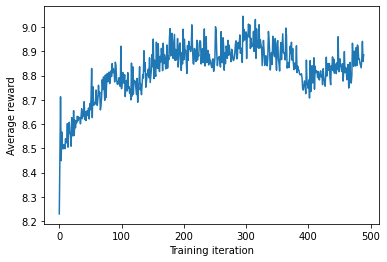

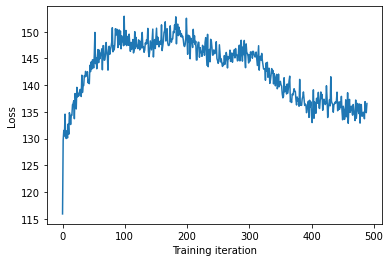






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 11.01it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 11.01it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.62it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.62it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.62it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.62it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.34it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.34it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.34it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 11.64it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.724850173413792
Proportion of valid SMILES: 0.6


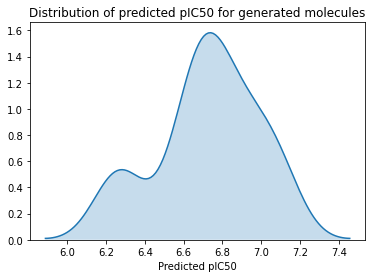






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)CN(C)C1CCN(C(=O)C2CCCCOc3ccccc3C2)CC1
COC1OC(COC(C)=O)C(C)N(C(=O)C(=O)NCc2cc(C(F)(F)F)ccc2Nc2cccc(C(F)(F)F)c2)C1C
COc1ccccc1C(C(=O)OCC(=O)N(C)C)(c1ccccc1)c1ccccc1
Cc1c(CCN)cccc1Nc1ncnc2nccnc12
N#Cc1cc2c(N3CCN(c4ccc(F)cc4)CC3)ncnc2s1







Policy gradient...:  20%|██        | 1/5 [00:08<00:33,  8.34s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:24,  8.10s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.96s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.84s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.75s/it]


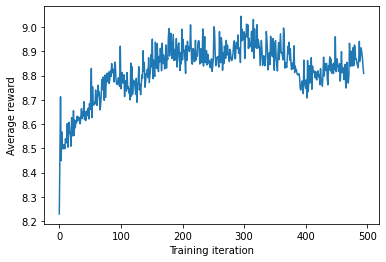

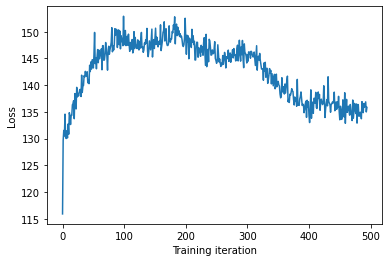






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.75it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.75it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.75it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.88it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.88it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.88it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.88it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 16.08it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 16.08it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 16.08it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00

Mean value of predictions: 6.397278136787574
Proportion of valid SMILES: 0.8


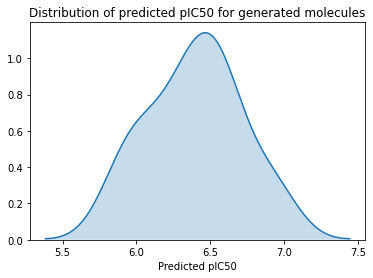






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
C=C(C)C1CCC2OCCNC21
CC(C)CNc1ccccn1
CCCCN(CCC)C(=O)N1CCCC(c2ccccc2)C1
CCOC(=O)c1ccc(-c2n[nH]c(N)n2)cc1
CCOc1ccccc1C=CC(=O)NCC(=O)N1CCCC(CO)c2cc(F)ccc21







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.85s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:23,  7.94s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.82s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.71s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.70s/it]


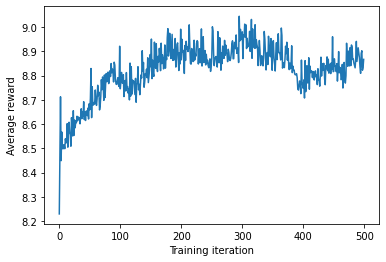

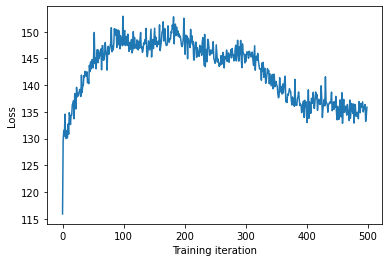






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.21it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.21it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.21it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.00it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.00it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.00it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.35it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.35it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.35it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 15.67it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.389117253407653
Proportion of valid SMILES: 0.7


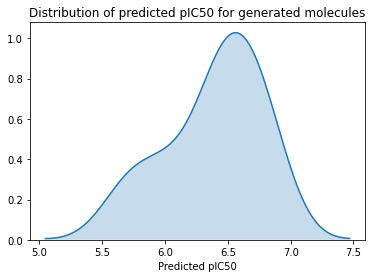

Sample trajectories:
CC(=O)NC(Cc1ccccc1)C(=O)NCC(=O)OC(C(=O)NCCCc1ccccc1)C(C)C
CCCN(CCC(=O)O)C(=O)c1ccccc1
CCN1CC2(O)C(c3cccc(C(F)(F)F)c3)CCN12
CCOc1ccc(-c2ccccc2)cc1NC(=O)N1CCS1
CCn1c(C)nc2c(C)cccc21


In [ ]:
for i in range(n_iterations):
    for j in trange(n_policy, desc='Policy gradient...'):
        cur_reward, cur_loss = RL_max.policy_gradient(gen_data, get_features=get_fp)
        rewards_max.append(simple_moving_average(rewards_max, cur_reward)) 
        rl_losses_max.append(simple_moving_average(rl_losses_max, cur_loss))
    
    plt.plot(rewards_max)
    plt.xlabel('Training iteration')
    plt.ylabel('Average reward')
    plt.show()
    plt.plot(rl_losses_max)
    plt.xlabel('Training iteration')
    plt.ylabel('Loss')
    plt.show()
        
    smiles_cur, prediction_cur = estimate_and_update(RL_max.generator, 
                                                     my_predictor, 
                                                     n_to_generate,
                                                     get_features=get_fp)
    print('Sample trajectories:')
    for sm in smiles_cur[:5]:
        print(sm)

เอาต์พุตของการสตรีมมีการตัดเหลือเพียง 5000 บรรทัดสุดท้าย



Generating molecules...:  93%|█████████▎| 9324/10000 [10:34<00:40, 16.76it/s]




Generating molecules...:  93%|█████████▎| 9324/10000 [10:34<00:40, 16.76it/s]




Generating molecules...:  93%|█████████▎| 9326/10000 [10:34<00:39, 17.27it/s]




Generating molecules...:  93%|█████████▎| 9326/10000 [10:34<00:39, 17.27it/s]




Generating molecules...:  93%|█████████▎| 9326/10000 [10:34<00:39, 17.27it/s]




Generating molecules...:  93%|█████████▎| 9328/10000 [10:34<00:39, 17.11it/s]




Generating molecules...:  93%|█████████▎| 9328/10000 [10:34<00:39, 17.11it/s]




Generating molecules...:  93%|█████████▎| 9328/10000 [10:34<00:39, 17.11it/s]




Generating molecules...:  93%|█████████▎| 9330/10000 [10:34<00:40, 16.53it/s]




Generating molecules...:  93%|█████████▎| 9330/10000 [10:34<00:40, 16.53it/s]




Generating molecules...:  93%|█████████▎| 9330/10000 [10:34<00:40, 16.53it/s]




Generating molecules...:  93%|████████

Mean value of predictions: 6.526306955874444
Proportion of valid SMILES: 0.8364


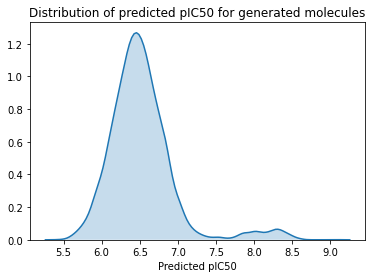

In [ ]:
smiles_biased_max, prediction_biased_max = estimate_and_update(RL_max.generator, 
                                                           my_predictor,
                                                           n_to_generate=10000)

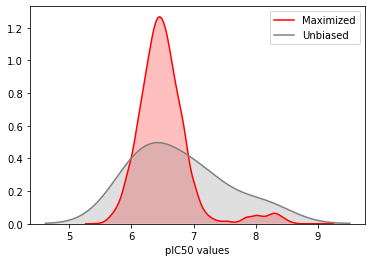

In [ ]:
sns.kdeplot(prediction_biased_max,label='Maximized', shade=True, color='red')
sns.kdeplot(prediction_unbiased, label='Unbiased', shade=True, color='grey')
plt.xlabel('pIC50 values')
plt.show()

### Minimizing pIC50 for JAK2

Next we will minimize the pIC50 fpr JAK2.

The reward function we will use here is 
$$
R(s) = \exp(\dfrac{-predictor(s)}{3} + 3) 
$$

In [ ]:
def get_reward_min(smiles, predictor, invalid_reward=0.0, get_features=get_fp):
    mol, prop, nan_smiles = predictor.predict([smiles], get_features=get_features)
    if len(nan_smiles) == 1:
        return invalid_reward
    return np.exp(-prop[0]/3 + 3)

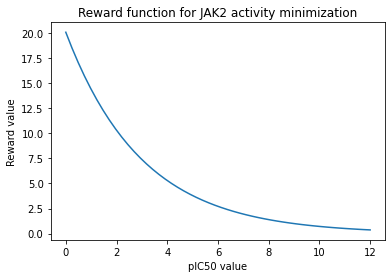

In [ ]:
x = np.linspace(0, 12)
y = np.exp(-x/3 + 3)
plt.plot(x, y)
plt.xlabel('pIC50 value')
plt.ylabel('Reward value')
plt.title('Reward function for JAK2 activity minimization')
plt.show()

Making a copy of the generator that will be optimized

In [ ]:
my_generator_min = StackAugmentedRNN(input_size=gen_data.n_characters, hidden_size=hidden_size,
                                 output_size=gen_data.n_characters, layer_type=layer_type,
                                 n_layers=1, is_bidirectional=False, has_stack=True,
                                 stack_width=stack_width, stack_depth=stack_depth, 
                                 use_cuda=use_cuda, 
                                 optimizer_instance=optimizer_instance, lr=lr)
my_generator_min.load_model(model_path)

In [ ]:
RL_min = Reinforcement(my_generator_min, my_predictor, get_reward_min)

In [ ]:
rewards_min = []
rl_losses_min = []






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]




Policy gradient...:  20%|██        | 1/5 [00:08<00:33,  8.40s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:25,  8.44s/it]




Policy gradient...:  60%|██████    | 3/5 [00:25<00:17,  8.54s/it]




Policy gradient...:  80%|████████  | 4/5 [00:34<00:08,  8.59s/it]




Policy gradient...: 100%|██████████| 5/5 [00:42<00:00,  8.53s/it]


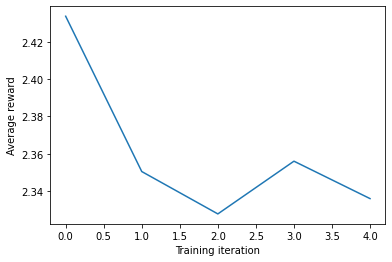

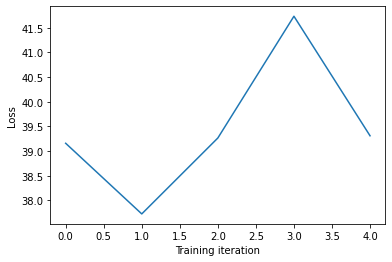






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.02it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.02it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 11.57it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 11.57it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 11.57it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 12.32it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 12.32it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 12.32it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 12.50it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 12.50it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00

Mean value of predictions: 6.65477561031071
Proportion of valid SMILES: 0.8


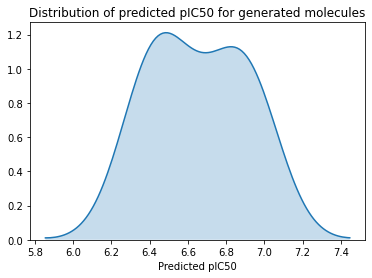






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCC(C)C(NC(=O)CCNC(=O)c1cc(C(F)(F)F)ccc1F)C(=O)N1CCCC1Cc1ccccn1
CCCCCCC(C)C(C)C(=O)OC(C)=O
CCc1cccc2c1C(=O)N(CCN1CCNCC1)C2=O
COC(=O)c1ccc2c(c1)C(=O)C(C)=C(N(N)C(=O)OC1CCCC1)O2
COCCN1CCc2c(OCc3ccc(CN(Cc4ccc5c(c4)OCO5)c4cccc(C)c4)cc3)c(C=O)cc(O)c2C1=O







Policy gradient...:  20%|██        | 1/5 [00:08<00:33,  8.34s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.25s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.22s/it]




Policy gradient...:  80%|████████  | 4/5 [00:33<00:08,  8.31s/it]




Policy gradient...: 100%|██████████| 5/5 [00:41<00:00,  8.32s/it]


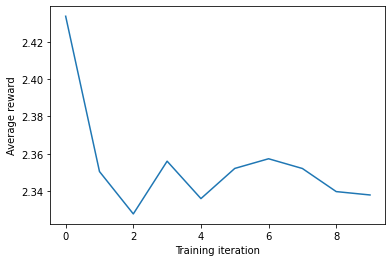

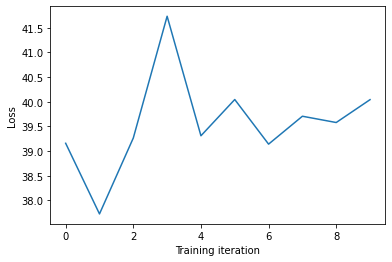






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 10.39it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 10.39it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 10.39it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 11.32it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 11.32it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 11.32it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 10.50it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 10.50it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 10.50it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 11.36it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.593056075384578
Proportion of valid SMILES: 0.5


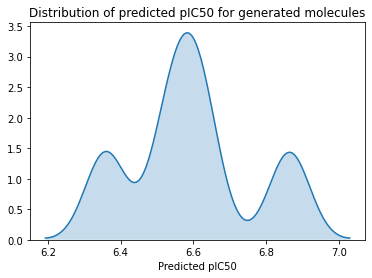






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
C=C1CCC2OC(=C3C=CC(=O)O3)C(C)CCCC(C)=CCCC12O
CC(=O)c1cc2c(cc1OCCc1ccccc1)CC(CN(C)C(=O)OCCCNc1ccc(C(C)(C)C)cc1)CC2
CC(=O)c1ccc(-c2ccc(C(C)C(O)C(=O)O)cc2)cc1
CCc1ccc(C2(C(=O)N3CCCCCC3)CCCCC2)cc1
CN(C)CCCCCN(C)C(=O)c1cccc(Oc2ccc(S(=O)(=O)N(Cc3ccccc3)C(=O)C3CCC(N)C(Nc4ccncc4)CC3)cc2)c1







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.98s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.13s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.19s/it]




Policy gradient...:  80%|████████  | 4/5 [00:33<00:08,  8.23s/it]




Policy gradient...: 100%|██████████| 5/5 [00:41<00:00,  8.23s/it]


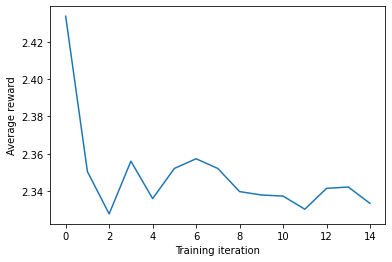

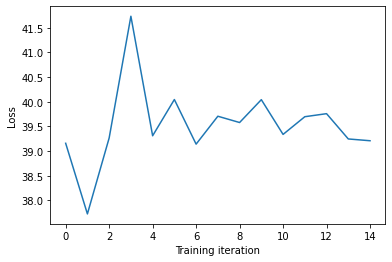






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.73it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.73it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00,  9.48it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00,  9.48it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00,  9.48it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 10.32it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 10.32it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 10.32it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 11.18it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 11.18it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 11.18it/s]




Generating molecules...:  80%|████████  | 8/10 [

Mean value of predictions: 6.875949566893719
Proportion of valid SMILES: 0.7


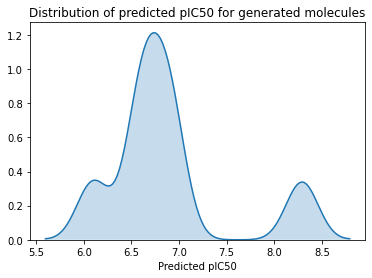






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=NCC1(O)C(=O)C(O)(c2ccccc2)C2CCCCCN(CCSCC2)c2ccc1cc2)c1ccc(OC(C)C)cc1
CC(C)(C)NC(=O)c1ccc(Cn2nnc3c2OCCC3)cc1
CC1CCCCC1OC1C(CO)OC(c2nc3ccccc3c3ccccc23)C1O
COc1ccc(C2SC(N(C)C3CC(C(=O)c4cccc(Cl)c4)=C(C)OC(C)C3)CNC2=O)cc1
COc1cccc(-c2cnn(N3CCN(c4ccc(C)cc4)CC3)c2)c1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.64s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.77s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.04s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:07,  8.00s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.09s/it]


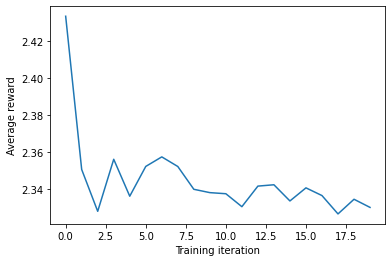

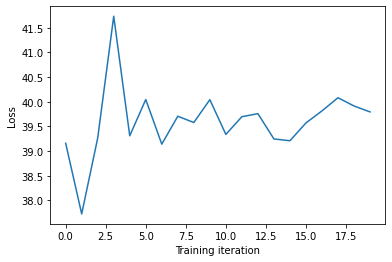






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.14it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.14it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.14it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.90it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.90it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.90it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.66it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.66it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.66it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 14.51it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.6081690309414896
Proportion of valid SMILES: 0.7


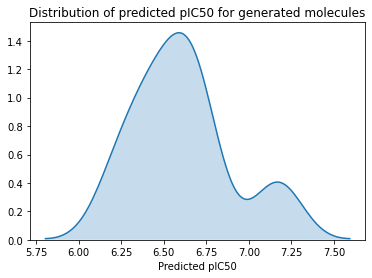






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCN(CC)CCC(NC(=O)c1cccc(CSc2ccncc2)c1)c1cccc(C(C)=O)c1
COc1ccc(C23CCC(C2)ncnc2N(C)CCN23)cc1
COc1ccc(CNCCOc2cccc(-c3ccccc3F)c2)cc1
COc1ccc(N2c3ccccc3NC(=O)C2CCC(=O)NCCc2cnccn2)cc1
CSc1nc2n(c1N(=O)=O)n1[nH]cccc1-2







Policy gradient...:  20%|██        | 1/5 [00:08<00:33,  8.40s/it]




Policy gradient...:  40%|████      | 2/5 [00:17<00:25,  8.47s/it]




Policy gradient...:  60%|██████    | 3/5 [00:25<00:16,  8.38s/it]




Policy gradient...:  80%|████████  | 4/5 [00:33<00:08,  8.34s/it]




Policy gradient...: 100%|██████████| 5/5 [00:41<00:00,  8.24s/it]


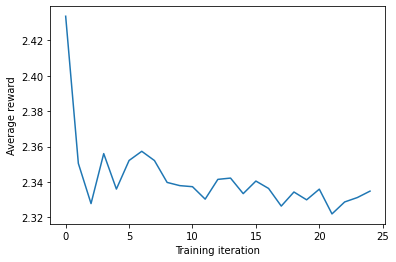

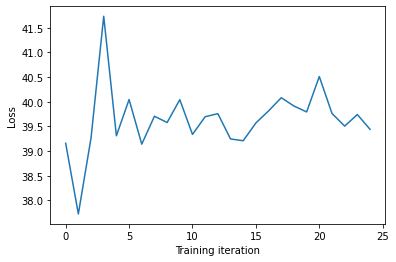






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.93it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.93it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.93it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 11.22it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 11.22it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 11.22it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.77it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.77it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.77it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.10it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.10it/s]




Generating molecules...:  70%|███████   | 7/10 [

Mean value of predictions: 6.55405859078112
Proportion of valid SMILES: 0.6


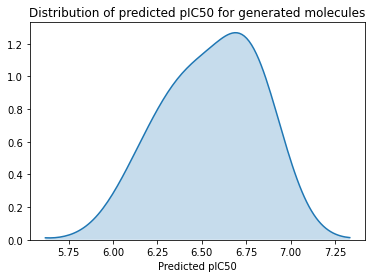






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC1=CN(Cc2ccccc2)c2cc3c(nc2C1)C(C)=CCCO3
CCCCN(CCC)CC(O)CNC(=O)c1ccc(O)c(O)c1
Cc1cc(CON=C2CCCC2C)c(C(=O)Nc2cccnc2)cc1C
NC1C(CO)OC(COC(=O)CCCCCCCCCc2ccc(F)cc2)C1O
O=C(COc1ccccc1)N1CCN(c2cc(F)cc(F)c2)CC1







Policy gradient...:  20%|██        | 1/5 [00:08<00:33,  8.34s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.21s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.14s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.25s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.19s/it]


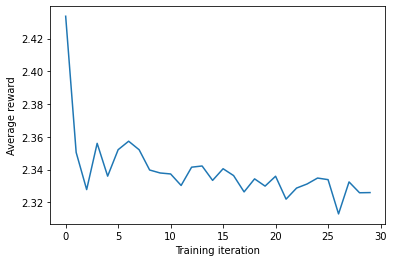

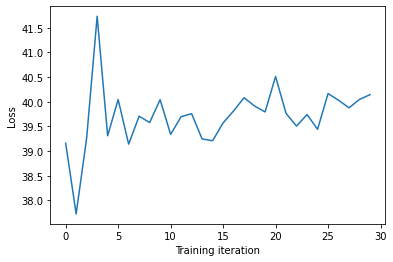






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.12it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.12it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.12it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.68it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.68it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.68it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.94it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.94it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.94it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 13.88it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.417640534196036
Proportion of valid SMILES: 0.5


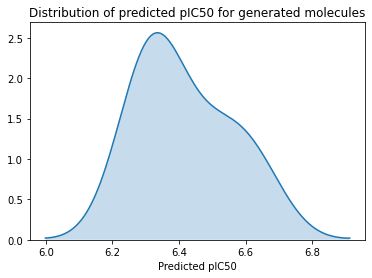






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)(C)CCCSC1CNC(=O)C1Cc1ccc(S(C)(=O)=O)cc1
CCOc1ccc(C2=NC(=O)C=C(c3ccc(C)cc3)N2)cc1
COc1ccc(-n2nnc(-c3ccc(-c4ccccc4F)cc3)n2)cc1
Cn1c2ccccc2c2nc(C3CCN4CCC(CF)C(C3)N4C(=O)Nc3cc(Cl)ccc3Cl)[nH]c21
O=C1c2nc3ccccc3(C(=O)O)c2CCN1c1ccccc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.81s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:23,  7.98s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.13s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.15s/it]




Policy gradient...: 100%|██████████| 5/5 [00:41<00:00,  8.32s/it]


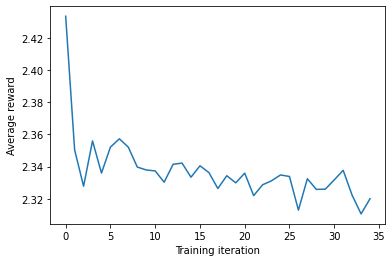

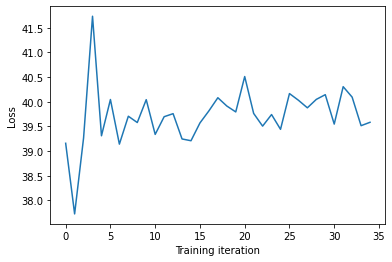






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.13it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.13it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.13it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.75it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.75it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.75it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.05it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.05it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.05it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 14.61it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.493730738138546
Proportion of valid SMILES: 0.6


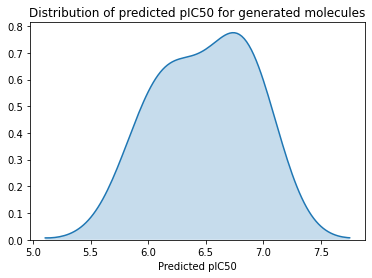






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)CCNC(=O)CN(C)C(=O)C1=CC(=O)c2ccccc2C1=O
CC(C)CCSc1nn(C)c2c1CCN(C1CCCC1)C2
CC(C)N(C(N)=O)c1cccnc1
CCOC(=O)N1CCN(C(=O)c2cc(N(=O)=O)ccc2F)CC1
CN(C)c1ncc(-c2nc3ccccc3n2CCC(N)=O)cc1C(=O)c1ccc(Cl)cc1







Policy gradient...:  20%|██        | 1/5 [00:08<00:32,  8.04s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:24,  8.01s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:16,  8.01s/it]




Policy gradient...:  80%|████████  | 4/5 [00:33<00:08,  8.39s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.20s/it]


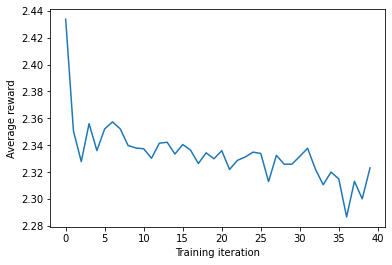

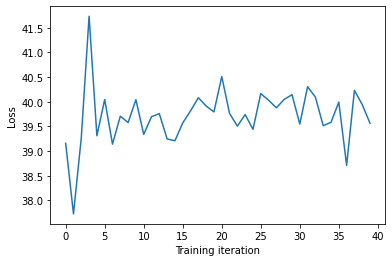






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.89it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.89it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.89it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.32it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.32it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.30it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.30it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.30it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 12.59it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 12.59it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00

Mean value of predictions: 6.527581804382574
Proportion of valid SMILES: 0.8


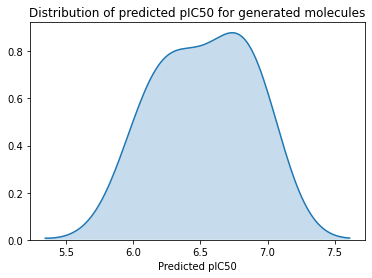






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC1=C(Cc2ccc(Cl)cc2F)C(O)(CNC(=O)c2ccc(F)cc2)OC(=O)C1
CCc1ccc(C(=NO)C2=CN(CC(=O)O)c3ccccc3N2)cc1
Cc1cc(C(=O)NC(C)C(=O)NC2CCN(Cc3ccc(Cl)cc3)CC2)cs1
Cc1cc(N(=O)=O)ccc1NC(=O)c1cc(-c2cn(C)nn2)n(C)c1
N#Cc1cc2cncnc2cc1NCCCNc1ccccn1







Policy gradient...:  20%|██        | 1/5 [00:08<00:34,  8.68s/it]




Policy gradient...:  40%|████      | 2/5 [00:17<00:25,  8.58s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.35s/it]




Policy gradient...:  80%|████████  | 4/5 [00:33<00:08,  8.32s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.12s/it]


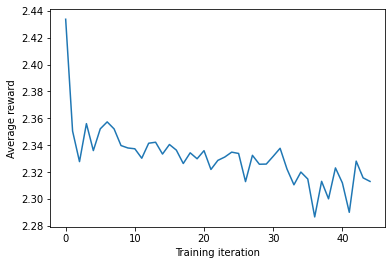

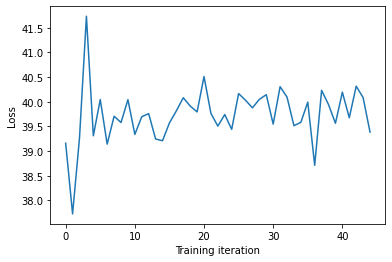






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:01,  7.39it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:01,  7.39it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:01,  7.39it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00,  8.97it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00,  8.97it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00,  8.97it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00,  9.99it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00,  9.99it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00,  9.99it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 10.91it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.619416131708206
Proportion of valid SMILES: 0.6


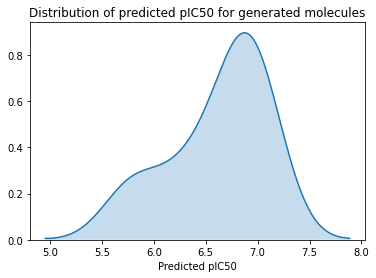






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCn1cc(C(C)C2=C(O)NC(C)(C)C2=Nc2ccc(O)cc2)c(C)c1C
CN(C)CC(O)c1cccc(-c2ccc(Oc3ccccn3)cc2)c1
COc1cc2c(cc1OC)C(c1ccc(Br)cc1)NCC2
Cc1ccc(C2CN(C(=O)c3ccccc3C=Cc3ccc(CO)cc3)CC2C)cc1
N#Cc1ccc(OCC(=O)N2CCC(N)C2)cc1C(F)(F)F







Policy gradient...:  20%|██        | 1/5 [00:08<00:32,  8.12s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.08s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.13s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.10s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.12s/it]


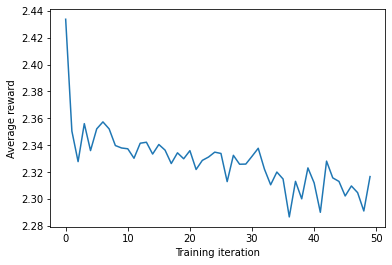

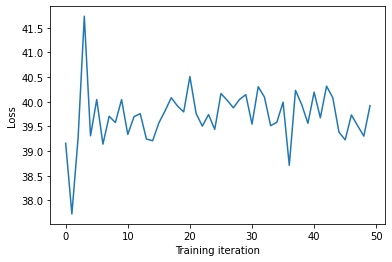






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.91it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.91it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.91it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.90it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.90it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.90it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.81it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.81it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.82it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.82it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00

Mean value of predictions: 6.731408168936432
Proportion of valid SMILES: 0.6


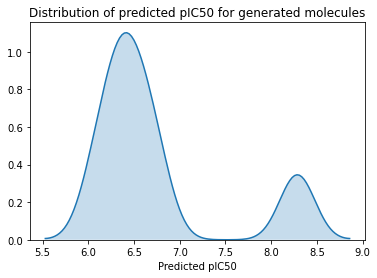






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC1(C)Oc2cc(-c3ccc(O)cc3)c3cc2-c(ccccc1F)C31CC1(Cc1ccccc1)C(=O)OC1CCCC1
COc1ccc(NC(=O)CC2NC(=O)NC2=O)c(C)c1
COc1ccccc1N1CCC2(CC1)CCN(c1cccc(C)n1)C(=O)N2
Cc1cccc(CN2C(=O)CCC(N3CCN(S(C)(=O)=O)CC3)=NC2=O)c1
Cc1nc(N)no1







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.75s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.04s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.01s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:07,  7.98s/it]




Policy gradient...: 100%|██████████| 5/5 [00:41<00:00,  8.23s/it]


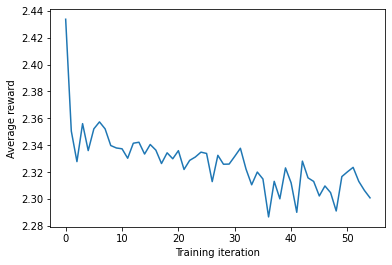

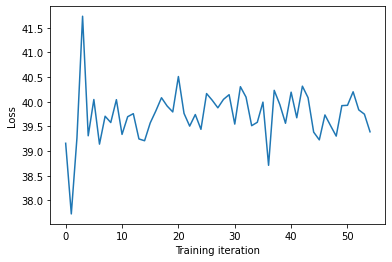






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:01,  7.72it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:01,  7.72it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:01,  7.72it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00,  9.00it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00,  9.00it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00,  9.19it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00,  9.19it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00,  9.19it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 10.09it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 10.09it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 10.09it/s]




Generating molecules...:  80%|████████  | 8/10 [

Mean value of predictions: 6.399550900988443
Proportion of valid SMILES: 0.5


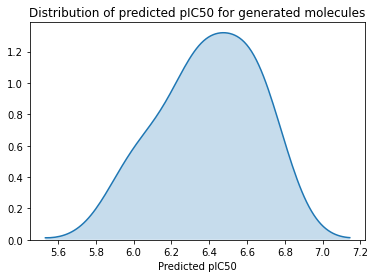






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCCCCCCCC(=O)OC1CC(C(=O)OCC(O)CO)OC1COP(=O)(O)OC(C)(C)C
CCOCC1CCC2C3CC1CCC23C
CCOc1ccc(-c2c(-c3ccc(Cl)cc3)[nH]c3ccccc23)cc1
COc1ccc(C(c2ccc3c(c2)OCO3)N2CCCC(C)C2)c(Cl)c1
O=C(NCCCNCC1CCC1)Oc1ccc2c(c1)NCC2







Policy gradient...:  20%|██        | 1/5 [00:08<00:32,  8.21s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.12s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.13s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.15s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.13s/it]


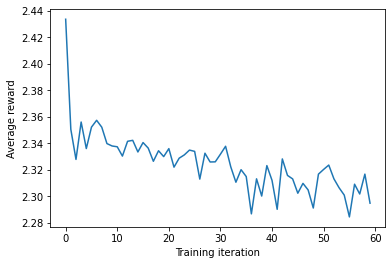

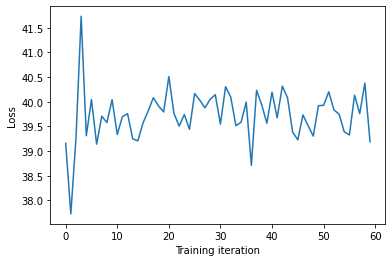






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.98it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.98it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.98it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 17.49it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 17.49it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 17.49it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.16it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.16it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.16it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 16.22it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.851501891638477
Proportion of valid SMILES: 0.8


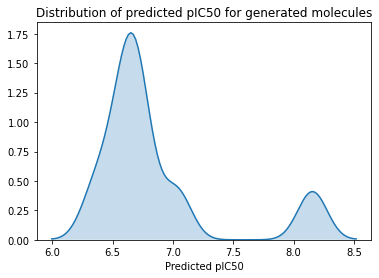






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)CN1CC(NC(=O)c2ccn(C)c2)C1=O
CC12CCCC(C)(C3Oc1c3OC(=O)c1ccccc1)C2O
CCCCCCCC(C)C1CCCC(O)C(CCCCCCCCCNS(=O)(=O)CCCCC(O)CC)C1
CCCCCCCCCCCCCCCCCCCCCC(O)C(CC(C)C)CC(O)CO
CCCSC(N)=NC(=O)c1ccccc1C(=O)O







Policy gradient...:  20%|██        | 1/5 [00:08<00:34,  8.62s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:25,  8.45s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.33s/it]




Policy gradient...:  80%|████████  | 4/5 [00:33<00:08,  8.38s/it]




Policy gradient...: 100%|██████████| 5/5 [00:41<00:00,  8.37s/it]


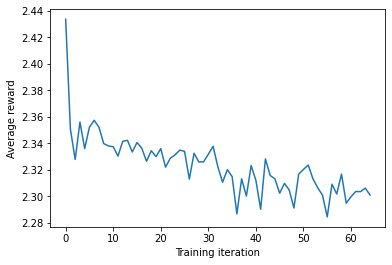

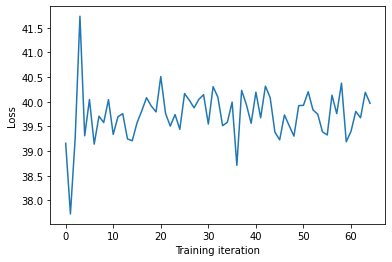






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.66it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.66it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.66it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.15it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.15it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.15it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.88it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.88it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.88it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 15.07it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.169383315297082
Proportion of valid SMILES: 0.6


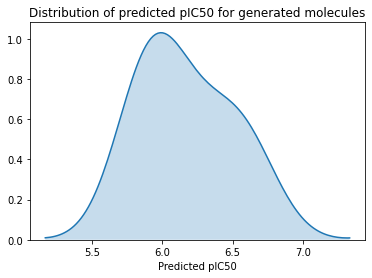






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(CO)N1CCC(Oc2ccccc2C(=O)c2ccc(OC3CCOCC3)cc2)CC1
CCC(NC(=O)c1cccs1)c1nc2ccccc2n1C
CCCCOc1ccc(OC)cc1
CCCNC(=S)Nc1cccc(N2CCCCC2)c1
Cc1nc2cc(NC(=O)C(F)(F)F)ccc2s1







Policy gradient...:  20%|██        | 1/5 [00:08<00:32,  8.09s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:24,  8.00s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.09s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.26s/it]




Policy gradient...: 100%|██████████| 5/5 [00:41<00:00,  8.24s/it]


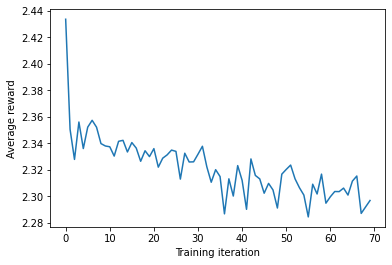

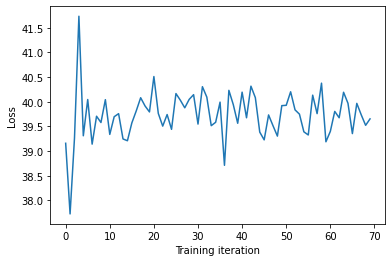






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.41it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.41it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.41it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.67it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.67it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.79it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.79it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 10.86it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 10.86it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 10.86it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.413894856410255
Proportion of valid SMILES: 0.6


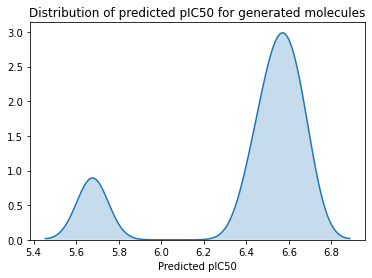






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C=CO)(C(=O)NC1CCCC1)c1ccc(-c2ccccc2)cc1
CCN(CC)CCSc1noc2ccc(C)nc12
CCNC(=O)C(NC(=O)Cc1ccccc1)C(C)(C)COC(=O)Cc1cc(O)c(OC)c(OC)c1
Cc1cc(C(=O)N2CCN(Cc3ccc(CF)o3)CC2)no1
O=C(C=Cc1ccc(F)cc1)Nc1cccc(-c2ccccc2)c1







Policy gradient...:  20%|██        | 1/5 [00:08<00:33,  8.30s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:25,  8.39s/it]




Policy gradient...:  60%|██████    | 3/5 [00:25<00:16,  8.34s/it]




Policy gradient...:  80%|████████  | 4/5 [00:33<00:08,  8.38s/it]




Policy gradient...: 100%|██████████| 5/5 [00:42<00:00,  8.51s/it]


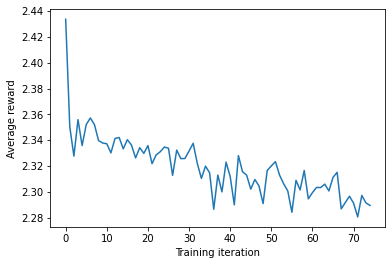

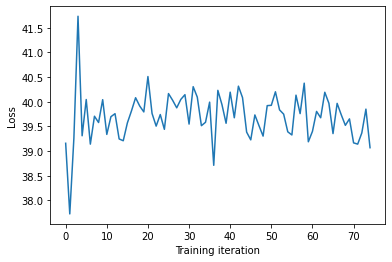






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.66it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.66it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.66it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.50it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.50it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.50it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.69it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.69it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.69it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 14.52it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.567083830899964
Proportion of valid SMILES: 0.6


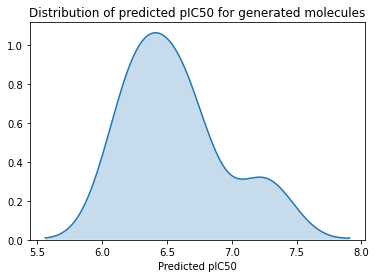






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)OC1OC(=O)C(Cc2ccccc2)=C(C)C1=O
CC(C)CC(Oc1cccc2ccccc12)C(C)(C)C
Cc1cc(Cl)ccc1N1CC(c2ccccc2)CC1=O
NS(=O)(=O)c1ccc(N2CCOc3ccccc3C2)nc1
Nn1nc(N2CCOCC2)c(-c2ccccc2)c1CCC(=O)O







Policy gradient...:  20%|██        | 1/5 [00:08<00:33,  8.34s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.19s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:16,  8.06s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.99s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  8.00s/it]


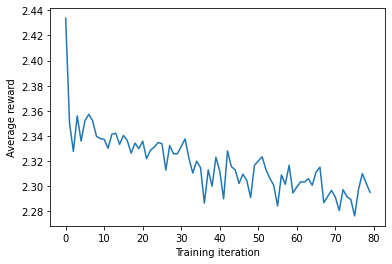

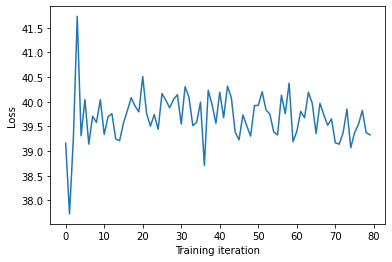






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.76it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.76it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.76it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.75it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.75it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.75it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.58it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.58it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.58it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.58it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00

Mean value of predictions: 6.738055368645962
Proportion of valid SMILES: 0.6


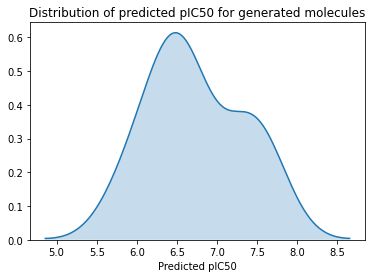






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)CNC(=S)Nc1cccc(Cl)c1Cl
CC(C)NCC1CCCN(C(=O)c2ccco2)C1
CCOc1ccccc1NC1CCN(Cc2ccc(C(=O)N3CCOCC3)cc2)CC1
CCc1cc(C)nc(c2ccc([SH](=O)=O)c(OC)c2)c1CCCNC1CCCCC1
CS(=O)(=O)N1CCC(C(=O)c2ccccc2)CN(Cc2ccc(Cl)cc2)C1







Policy gradient...:  20%|██        | 1/5 [00:08<00:33,  8.35s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.26s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.36s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.24s/it]




Policy gradient...: 100%|██████████| 5/5 [00:41<00:00,  8.26s/it]


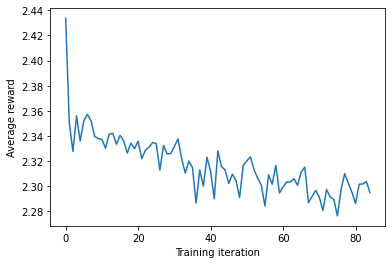

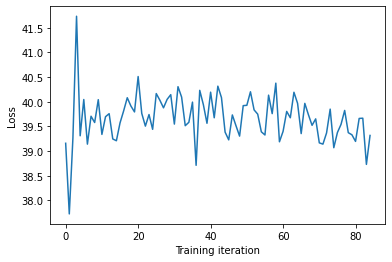






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.29it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.29it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.29it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 11.81it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 11.81it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 10.78it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 10.78it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 10.78it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.05it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.05it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00

Mean value of predictions: 6.79791329452191
Proportion of valid SMILES: 0.8


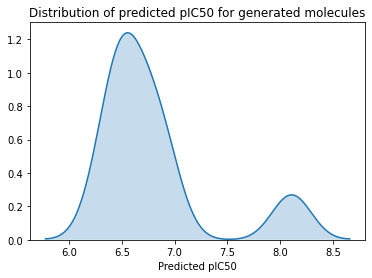






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=NNC1=NC(=O)CS(=O)N1)c1cccc(NC(=O)c2ccc(C)cc2)c1
CC(C)(NCCCN1CC(C(F)(F)F)CC1=O)c1cccc(F)c1
CC1(C)CCC(c2c(CC(=O)Nc3ccccc3Br)noc2-c2cc(S(N)(=O)=O)ccc2O)CC1
COc1cc(C2=C(C(C3=C(C)NC(CC(C)C)C3=O)C(C)(C)C)Oc3ccccc3N2)cc(OC)c1OC
COc1ccc(CCCCCCCNCc2ccncc2)c(OC)c1







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.93s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.15s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.06s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.18s/it]




Policy gradient...: 100%|██████████| 5/5 [00:41<00:00,  8.22s/it]


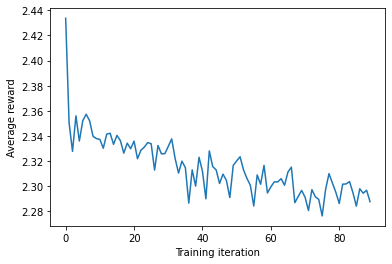

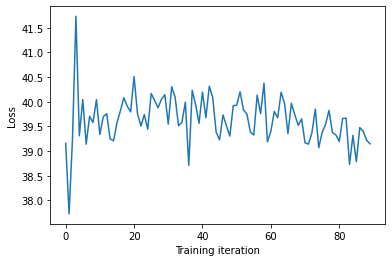






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.15it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.15it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.15it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.86it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.86it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.86it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.39it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.39it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.39it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 15.99it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.598053001094886
Proportion of valid SMILES: 0.8


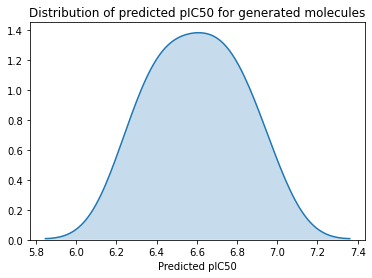






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
C=CC1=C2C3CCC2C(C)(CCC2C(C)(C)CCCC32C)C(C)(C)C(O)C1
C=CCNC(=O)C1(c2ccccc2)CCCCC1
CCCCCN(CCCC)C(=O)NCc1ccc(C)nc1
COc1ccc(N2CCN(C(=O)C3CCC(c4c(F)cccc4F)N3)CC2)cc1
COc1ccc2[nH]nc(CCCCCC3(CO)CCC(C(C)C)C3)c2c1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.67s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.62s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.82s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.82s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.88s/it]


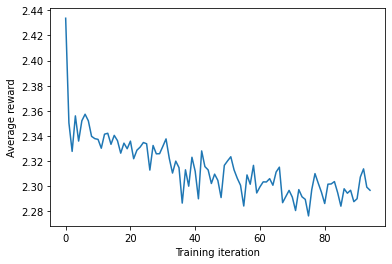

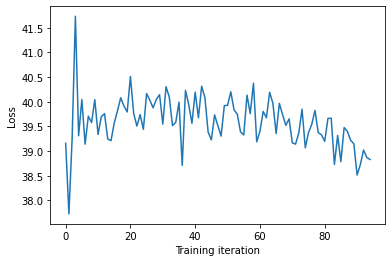






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.81it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.81it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 11.69it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 11.69it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 11.69it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 12.64it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 12.64it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 12.64it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 12.85it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 12.85it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00

Mean value of predictions: 6.528513192703339
Proportion of valid SMILES: 0.5


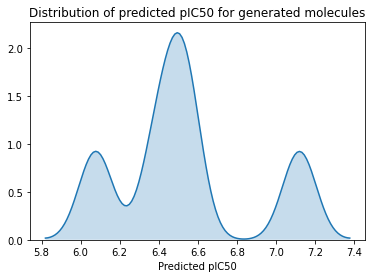






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCCCCCCCCCC(OC(C)=O)C(=O)O
COc1ccc(C(=O)CC(c2noc(-c3ccc(C(=O)NC4CC4)cc3)n2)N2CCC(F)(F)CC2)cc1
COc1ccc(OCC2Cc3ccccc3COc3cc(OC)ccc32)cc1
Cc1ccccc1-n1ncc2c(ccc(CNC(=O)C3CC3)c2C)C1=O
Cc1ccccc1C1=Cc2cc(C=NNc3cc(F)cc(F)c3F)ccc2NC1C







Policy gradient...:  20%|██        | 1/5 [00:08<00:32,  8.10s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.14s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.04s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.02s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.03s/it]


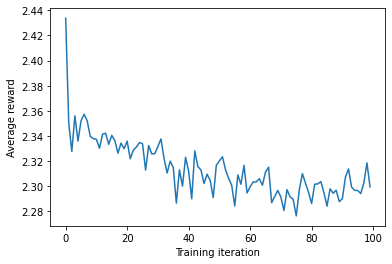

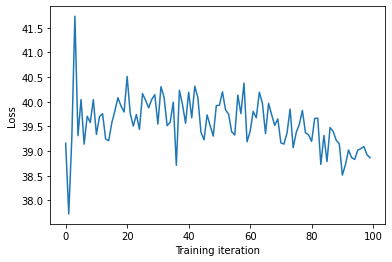






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.94it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.94it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 14.16it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 14.16it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 14.16it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 13.93it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 13.93it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 13.93it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 13.07it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 13.07it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00

Mean value of predictions: 6.4531290298552575
Proportion of valid SMILES: 0.5


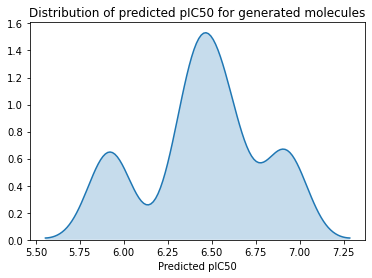






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)(CCN=C(N)C(=O)N1CCN(C(c2ccc(-c3ccccc3)cc2)C(F)(F)F)CC1)c1ccccc1
CCN(CC)C(=O)C(CCC(=O)O)c1ccccc1
COCCNC(=O)N1Cc2ccc(CN(C)C)cc2NC1=O
COc1ccc(OC)c(N=[SH](=O)c2cccc(Cl)c2)c1
N#Cc1ccc(CN2CCN(CCNC(=N)N)CC2)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.81s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.78s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.06s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.10s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.12s/it]


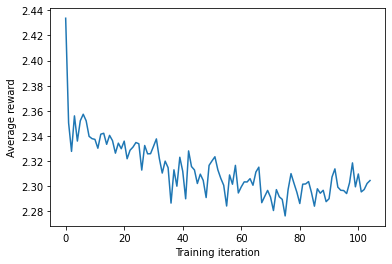

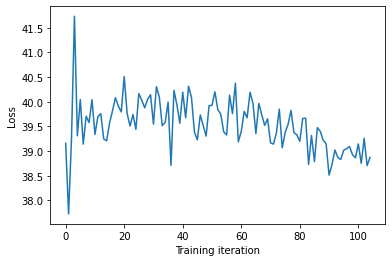






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.65it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.65it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.65it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.77it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.77it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.77it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.74it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.74it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.74it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 14.72it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.4077557497914635
Proportion of valid SMILES: 0.6


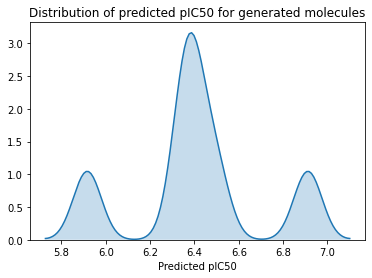






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCC(C)COC(=O)Nc1nc2cccc3cccc2c13
CCCC(NC(=O)C(N)Cc1ccccc1N(=O)=O)C(=O)NC(Cc1ccccc1)C(=O)NCC1=CC(=O)Nc2ccccc21
COc1ccc(NC(N)=O)cc1N1CCNCC1
COc1ccccc1-n1ncc(-c2ccc(COc3ccc(Cl)cc3)nc2)n1
Nc1nc2ccc(C(=O)Nc3ccc(CCCCNC4CCCCC4)cc3)cc2c2nc(Cl)ccc12







Policy gradient...:  20%|██        | 1/5 [00:08<00:32,  8.15s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.28s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.27s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.08s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.13s/it]


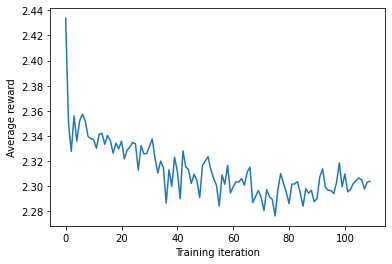

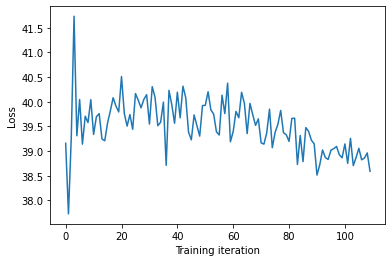






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.32it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.32it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.32it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.32it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 10.72it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 10.72it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 10.72it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 11.78it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 11.78it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 11.78it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 12.36it/s]




Generating molecules...:  80%|████████  | 8/10 [

Mean value of predictions: 6.741391824400895
Proportion of valid SMILES: 0.7


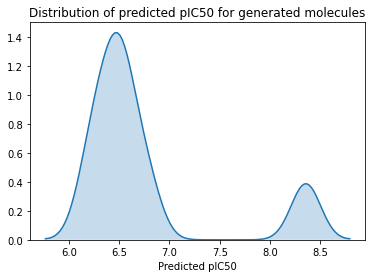






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)NC(=O)Oc1ccc(-c2ccccc2)cc1
CCOC(=O)C(=S)N1CCN(S(=O)(=O)c2ccccc2)CC1
CCOc1cccc(C2(C)Cc3cc(C(=O)OC)ccc3O2)c1
COc1ccc(C(=O)NC2CCC(Nc3cc(Cl)c(Cl)cn3)CC2)cn1
COc1cccc(CCN)c1OC







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.91s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.13s/it]




Policy gradient...:  60%|██████    | 3/5 [00:25<00:16,  8.27s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.14s/it]




Policy gradient...: 100%|██████████| 5/5 [00:41<00:00,  8.27s/it]


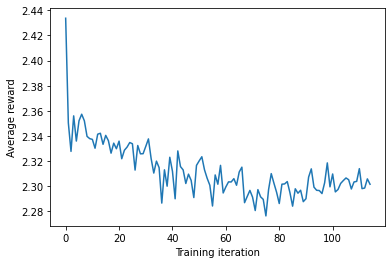

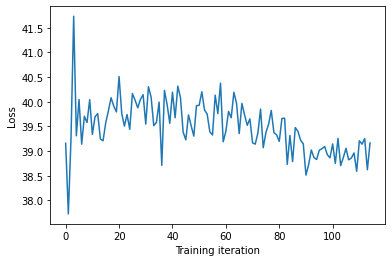






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.88it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.88it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.88it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.05it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.05it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.05it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.01it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.01it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.01it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 15.32it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.559151915924228
Proportion of valid SMILES: 0.7


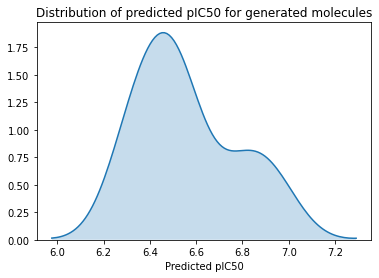






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)(C)c1cccc2c(NCCCCNC3CCCCC3)ncnc12
CCCCCCCCc1ccc(Cl)cc1NC(C)C(=O)NCC1CCCO1
CCN(CC)CCCNC1CC(=O)NC(C)C1
COc1ccc(CN(C(C)=O)S(=O)(=O)c2ccccc2)cc1OC
Cc1ccc(-c2nc(Cn3ccnc3)c3ccccc3n2)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.66s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.77s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:15,  7.93s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.10s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.17s/it]


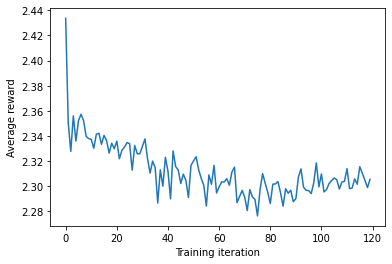

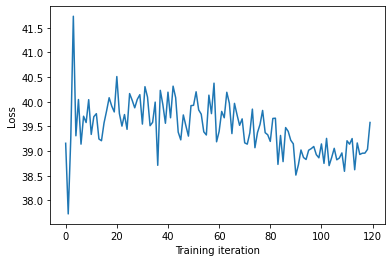






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.33it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.33it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.33it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.72it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.72it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.72it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.04it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.04it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.04it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 13.77it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.674643748894344
Proportion of valid SMILES: 0.8


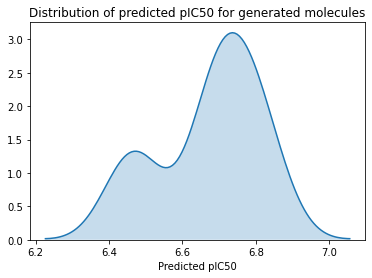






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCCCCCC(C)C(NC(=O)c1ccncc1)C(=O)NO
CCOc1ccc(-c2nncc(-c3ccncc3)c2CC)cc1
CCc1nc(C)c(Cl)nc1C(CC)NC(=O)Cc1ccc(OCc2ccccc2)cn1
CN1C(=O)CCC1C(=O)NCc1ccc(Cl)cc1
COCCN1CCN(c2ccc3c(c2)CC2N(C)CCCC2(C)C3=O)CC1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.52s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.64s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.78s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.76s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.81s/it]


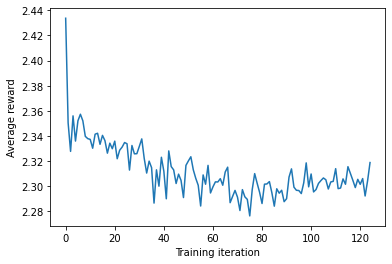

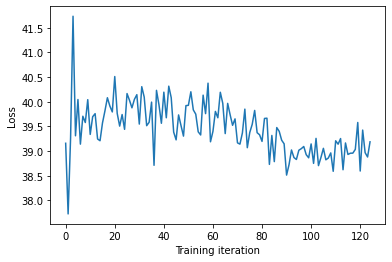






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.18it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.18it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:00,  9.18it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.81it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.81it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.81it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.30it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.30it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.30it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.62it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.62it/s]




Generating molecules...:  70%|███████   | 7/10 [

Mean value of predictions: 6.657015929099796
Proportion of valid SMILES: 0.6


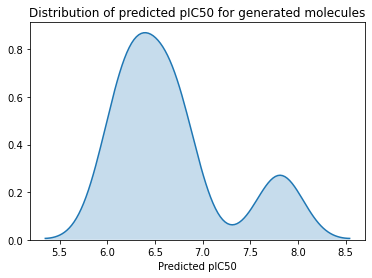






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
C=CNc1cc(NS(=O)(=O)c2cccc(NS(=O)(=O)c3ccc(CCC(=O)O)cc3)c2)ccn1
CC(C)(CCCNc1ccc(-n2cc(CNC3CCCCCCCCCCC3)nn2)cc1)C(N)=O
CC(C)C1(C(=O)O)C(=O)Nc(c2ccc(N(CC3CCCCC3)c3ccc4ccccc4c3)cc2)ccc1C(=O)O
CN1CCN(C(=O)c2cnc3oc(Cc4ccccc4)nc3c2)CC1
Cc1cc(Cl)cc(Cl)c1S(=O)(=O)N1CCN(c2ccncc2)CC1







Policy gradient...:  20%|██        | 1/5 [00:08<00:32,  8.10s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.08s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.95s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.89s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.92s/it]


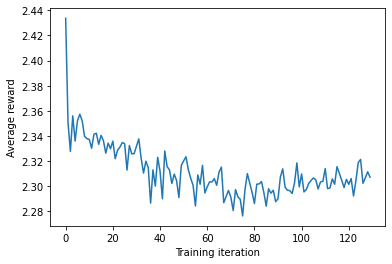

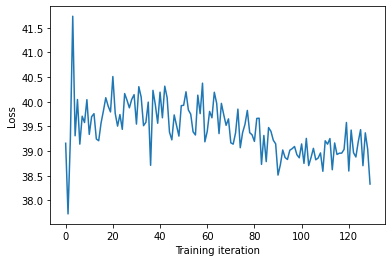






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.24it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.24it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.24it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.44it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.44it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.44it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.73it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.73it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.73it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 13.69it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.6793746210031975
Proportion of valid SMILES: 0.7


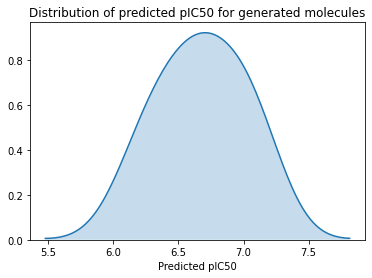






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(CC(=O)NCCc1ccccc1)CC1NC(=O)C2(C(=O)N(C)C)CN(C)CCC12
COC(=O)C1=C(C)NS(=O)(=O)c2c(C(=O)NC3CCCCC3)cccc21
COC1=CC(=NC(=Cc2cn(C)nc2C)N(=O)=O)C(=O)N1Cc1ccccc1Cl
CSc1ccccc1-c1ccc(OCc2ccccn2)cn1
Cc1ccccc1-n1cnc(C(=O)N2CCCCS2(=O)=O)c1C(=O)O







Policy gradient...:  20%|██        | 1/5 [00:07<00:28,  7.24s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.61s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.63s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.67s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.82s/it]


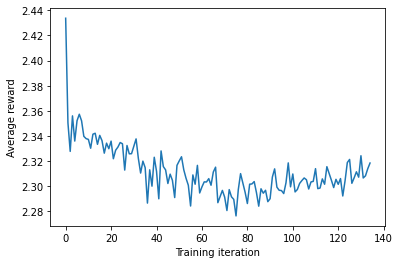

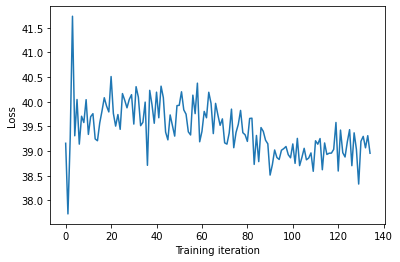






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.79it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.79it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.79it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.26it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.26it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.26it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.79it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.79it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.79it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 14.71it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.785968060094221
Proportion of valid SMILES: 0.6


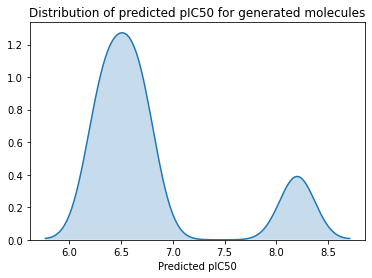






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)N(C)C(=O)CNC(=O)C1(C(=O)O)CCS(=O)(=O)CC1
CCCCCCC(C)CCN(C)CCCOc1cccc(-c2cccnc2)c1
CCCCCCCCCCOCC1CCN(C)C1
COc1ccc(CN2CCN(Cc3ccc(Cl)cc3Cl)CC2)cc1OC
COc1ccc(CN2CCSC2=NC(=O)C(=Cc2ccc(O)cc2)C(=O)O)cc1







Policy gradient...:  20%|██        | 1/5 [00:08<00:33,  8.27s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:24,  8.02s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:16,  8.01s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.97s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.89s/it]


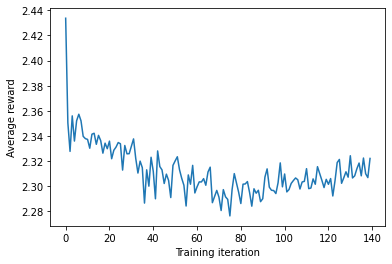

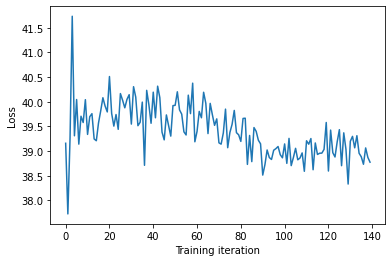






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.37it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.37it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.37it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.46it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.46it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.46it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.73it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.73it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 12.73it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 12.73it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00

Mean value of predictions: 6.430116305902497
Proportion of valid SMILES: 0.6


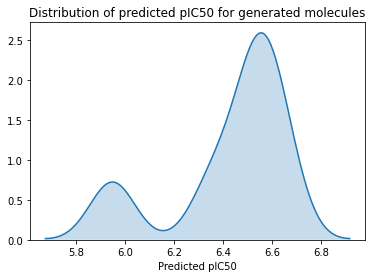






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)c1ccc(CNC(=O)c2ccc(N(=O)=O)nn2)cc1
CCC(C)(O)C(C)CO
COc1ccc(C2CCCN2NC(=O)C(CC(=O)NO)SCCC(=O)c2ccc(O)cc2)cc1
Cc1cc(C2CCC(NC(=O)C(C)NC(=O)NC(C)C)O2)no1
Cc1nc2c3ccccc3ccc2n1CCN1CCCCC1







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.76s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:23,  7.94s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.05s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.86s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.94s/it]


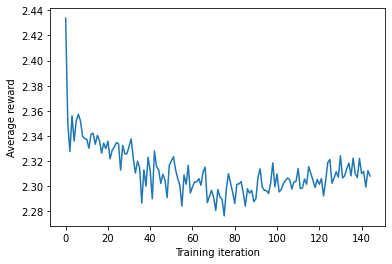

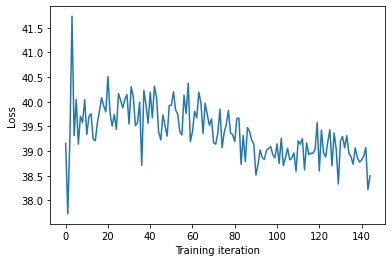






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.33it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.33it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.33it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.23it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.23it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.23it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.26it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.26it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.26it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 14.61it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.379097453388551
Proportion of valid SMILES: 0.7


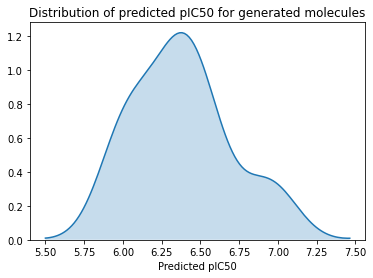






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCN1CCCC(c2cn(C(C)=O)c(Cl)c2Cl)C1
CCN1OC(=O)C2=C(C)OC(=O)C1CN2C(=O)c1cccn1C
CCc1nc(C)c(C(C)c2cn(CC3CCOc4ccccc43)cn2)o1
CN(CCN1CCN(c2ccccc2)CC1)C(=O)CN1CCN(c2ccccc2)CC1
COC(=O)c1ccccc1CCCN







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.82s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.82s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.74s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.82s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.74s/it]


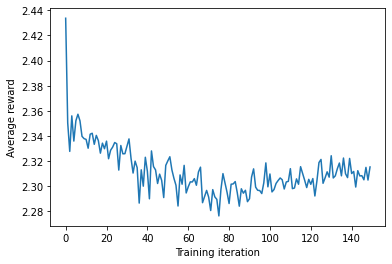

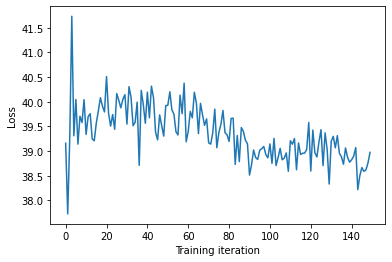






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.00it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.00it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.00it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.34it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.34it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.34it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.77it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.77it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.77it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 12.55it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.592108761347866
Proportion of valid SMILES: 0.6


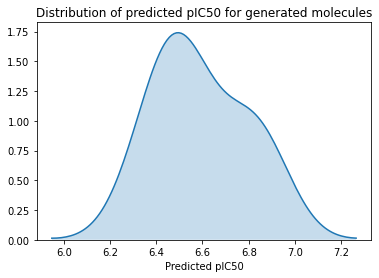






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)C(=O)NCC1CC(CC(=O)C(=O)O)CO1
CCCCCCCCCCCCCC(=O)NCCCCCCCCNCc1cccc(Cl)c1
CCCCN(C(=O)c1ccccc1)C1CCN(CCF)CC1
CCN(CC)CCNc1nc(C(=O)Nc2ccc(C)cc2)ncc1C(=O)c1ccc(N(Cc2ccccc2)C(C)C)cc1
CCOc1ccc(C(C)CC(=O)O)cc1







Policy gradient...:  20%|██        | 1/5 [00:08<00:32,  8.22s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:24,  8.14s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:16,  8.04s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.13s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.05s/it]


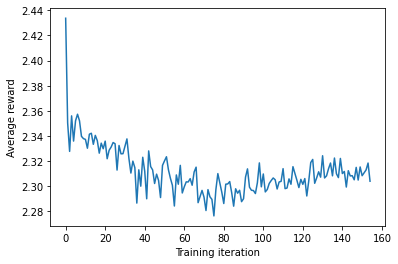

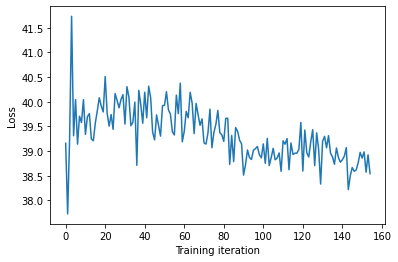






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 11.97it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 11.97it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.77it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.77it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.77it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 12.24it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 12.24it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 11.44it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 11.44it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00,  9.75it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00

Mean value of predictions: 6.5264529092439965
Proportion of valid SMILES: 0.8


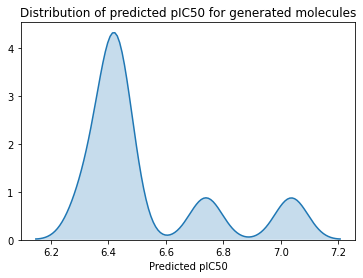






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCCCCCCCCCCCCOC1CCC(OC(COC(C)=O)C(=O)O)CC1
CCS(=O)(=O)N1CCC(CO)C1
CN(C)CCOc1ccc(S(=O)(=O)c2ccc(F)cc2)cc1
COc1cccc(C(=O)Nc2ccc(-c3ccccc3NS(=O)(=O)Cc3ccccc3)cc2)c1
Cc1cccc(CNC(=O)C2=CN(C)C(=O)c3ccccc32)c1







Policy gradient...:  20%|██        | 1/5 [00:08<00:32,  8.08s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.93s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:16,  8.04s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.97s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.01s/it]


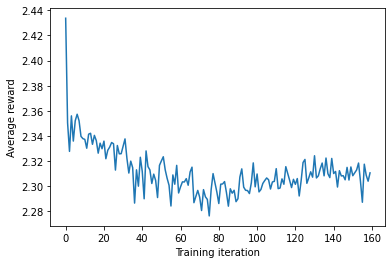

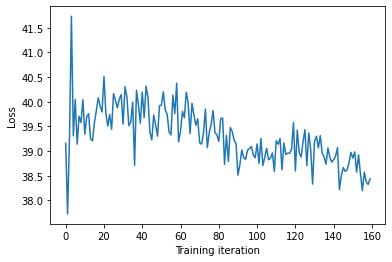






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 18.82it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 18.82it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 18.82it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.94it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.94it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 12.51it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 12.51it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 10.98it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 10.98it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 10.98it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.824577309492807
Proportion of valid SMILES: 0.6


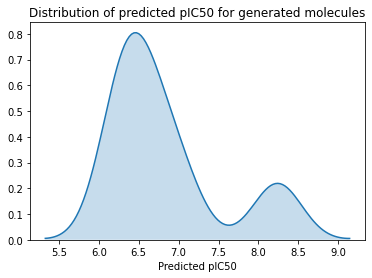






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)N1CCN(S(=O)(=O)C2CCN(C(=O)NC(c3ccccc3)C(C)C)CC2)CC1
CCOC(=O)C1CCCCCCCCCN(C2CCCCC2)c2ccc(Cl)cc21
CCOc1cccc(CC2=NNC(=S)N2CC2CCCN2C)c1
Cc1ccc(-c2cnc3ccc(N4CCOCC4)nc3c2)cc1
O=C1C=CN(CCC2=CNC(=O)NC2=O)N(c2cccc(-c3cccc4ccccc34)c2)C=C1







Policy gradient...:  20%|██        | 1/5 [00:08<00:33,  8.40s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:25,  8.43s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.25s/it]




Policy gradient...:  80%|████████  | 4/5 [00:33<00:08,  8.29s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.11s/it]


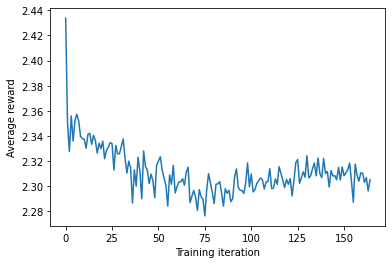

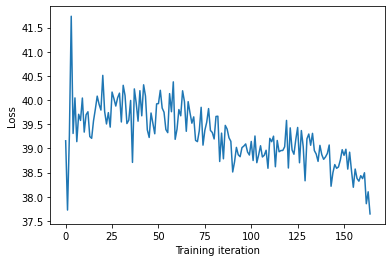






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.11it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.11it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.11it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.20it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.20it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.20it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.89it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.89it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.89it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 13.78it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.521096757749933
Proportion of valid SMILES: 0.8


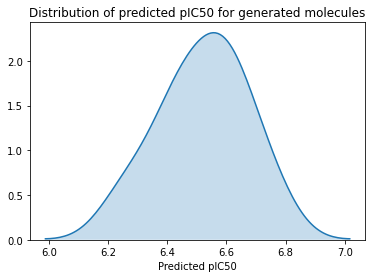






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)(C)c1cc(N(=O)=O)nn1SCC(=O)NCCCSCCCO
CC1=CC(C2CC2)N(C(C)(C=O)CC(C)C)C(C)=N1
CCCCCCC(=O)N(O)C1CCC(c2ccccc2)O1
CCCCN1CCCC1C(=O)NCc1ccccc1
CCOC(=O)C1Cc2c(C)nc(C)c(C)c2N1C(N)=O







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.86s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.85s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.02s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.93s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.97s/it]


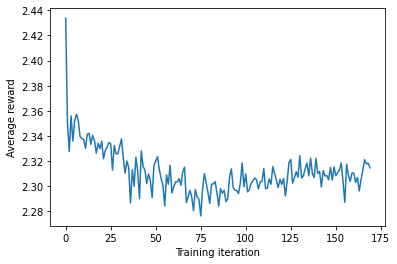

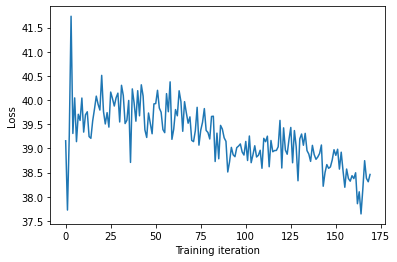






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.77it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.77it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.77it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.25it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.25it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.25it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.88it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.88it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.88it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 15.80it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.528018875149697
Proportion of valid SMILES: 0.6


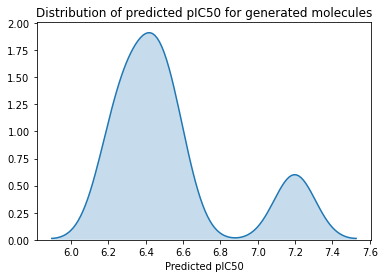






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)c1ccc(CCN2CCN(Cc3c(C)cnn3C)CC2)nc1
COc1cc2c(c(O)c1O)N(CCCC(=O)NCC1CCCO1)CC2
COc1ccc(CC(Cc2cnccn2)CC(O)COc2cc(CCN)ccc2OC)c(Cc2ccccc2)c1
Cc1ccc(CC(O)c2ccc(Cl)cc2)c(C)c1
O=C(O)C1CC2CCCCC2CC1COc1ccccc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.74s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.82s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.80s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.66s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.60s/it]


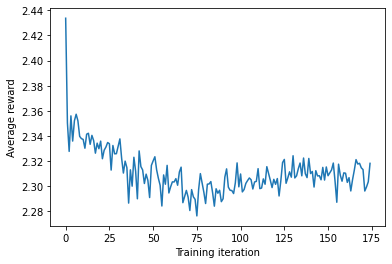

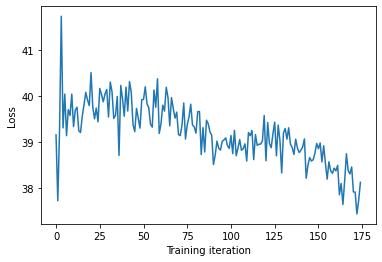






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.32it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.32it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.32it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.12it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.12it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.12it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.94it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.94it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.94it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 15.13it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.489634686904298
Proportion of valid SMILES: 0.7


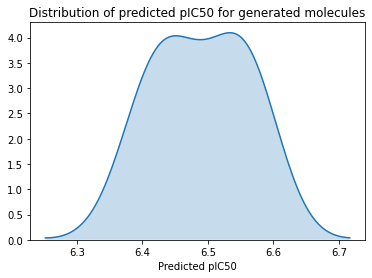






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)N1CCCC1c1ccc(F)c(C(N)=O)c1
CC1Oc2cc(O)c(O)C(O)C(O)C(O)(c3ccccc23)C(O)C1O
CCCCCC1CC(=O)C(C)(CC(N)C(=O)c2ccc(N(=O)=O)cc2)C1=O
Cc1ccc(C2=NNC(=O)C2=C(N=C2CCCC2)NCCC(=O)NN)cc1
O=C(C1CC2CC1N(C(=O)C1CCCCC1)C2)N1CCCC1







Policy gradient...:  20%|██        | 1/5 [00:08<00:33,  8.47s/it]




Policy gradient...:  40%|████      | 2/5 [00:16<00:25,  8.35s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.19s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.09s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.95s/it]


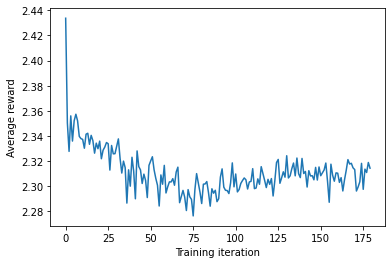

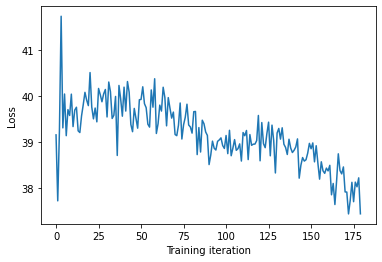






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.48it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.48it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.48it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.29it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.29it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.29it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.78it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.78it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 12.21it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 12.21it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00

Mean value of predictions: 6.6914250865090095
Proportion of valid SMILES: 0.6


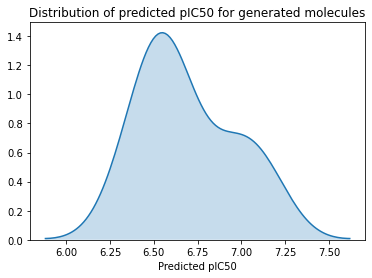






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCOC1CCN(C(=O)COC(=O)CCC(=O)Nc2ccccc2)CC1
CN(C(=O)C(CC(N)C(=O)O)C(=O)O)C1CCCCC1
COC(=O)c1c(C(=O)Nc2ccc(Oc3cccc(NC(=O)C=O)c3)cc2)cc(C)nc1OCC(=O)O
COCc1c(F)cc(C)cc1Cn1cccc1-n1cc(C(=O)O)cc1C(=O)NCCC(=O)O
COc1ccc(Cl)cc1C#CCCN1CCCCC1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.73s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.83s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.71s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.63s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.64s/it]


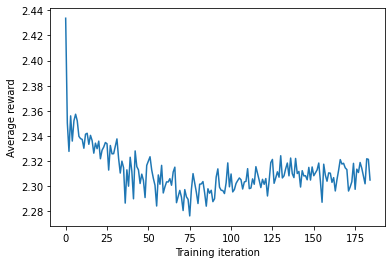

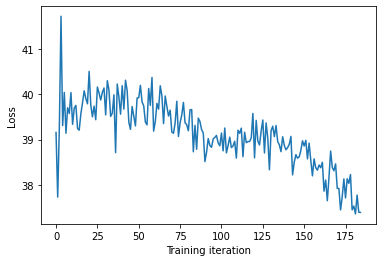






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.06it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.06it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.06it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.37it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.37it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 10.55it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 10.55it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 10.55it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.73it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 11.73it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00

Mean value of predictions: 6.729941788609471
Proportion of valid SMILES: 0.8


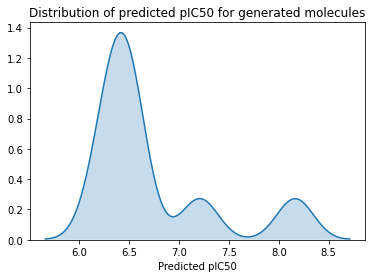






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCCN(CCC)CCCNC(=O)c1nc2ccccc2s1
CCOC(=O)c1ccc(-c2nc(NC=C(C)C)c(Cl)cc2C)cc1
COC(=O)C(COC(C)=O)c1c(Cl)cccc1N(=O)=O
COc1ccc(CNC(=O)CCS(=O)(=O)c2ccc(C)cc2)cc1
CSc1ccc(C2=NC(c3ccccc3)n3nc(C)cc3C2=O)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.57s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.67s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.68s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.70s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.72s/it]


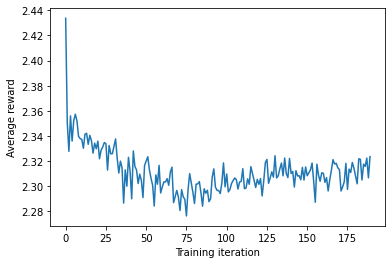

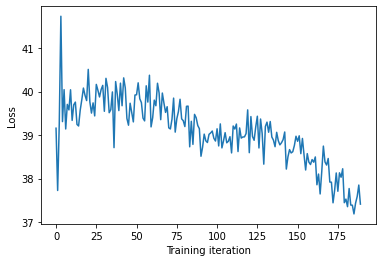






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.20it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.20it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.20it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.20it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 17.16it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 17.16it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 17.16it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.14it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.14it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.14it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00

Mean value of predictions: 6.491959062331806
Proportion of valid SMILES: 0.6


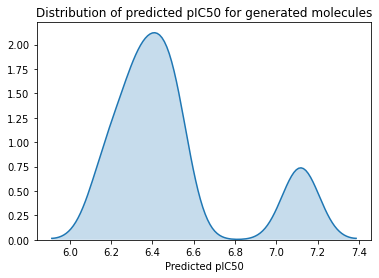






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCCCCN1CCC(Cc2ccccc2)CC1
COc1cc(CNCCc2ccccc2)ccc1OCc1ccccc1
Cc1ccccc1CCC1CCCC1
O=C(CCCN1C(=O)c2ccccc2c2ccc(Cl)cc21)Nc1ccc(Cl)cc1
O=C1NCCc2c1[nH]c1nc(N3CCOCC3)ccc21







Policy gradient...:  20%|██        | 1/5 [00:07<00:29,  7.44s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.59s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.89s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.85s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.85s/it]


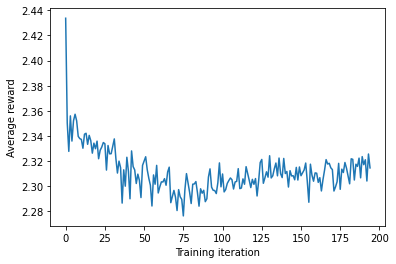

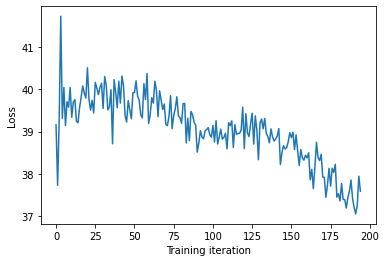






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 15.97it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 15.97it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 15.97it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 15.88it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 15.88it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 15.88it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 16.27it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 16.27it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 16.27it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00:00, 16.

Mean value of predictions: 6.306905260354905
Proportion of valid SMILES: 0.5


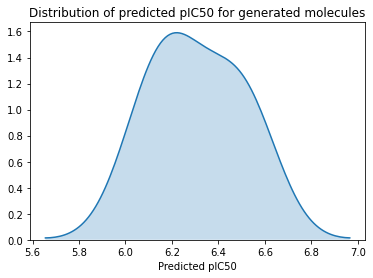






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
C=C(OC)C1CCC23COC(O)C(C)(C)CCC2OC(CO)CCC13
CC1=NNC(=O)C1Cc1ccc(F)cc1
CCCCCCNC(=O)c1ccc(C)cc1NC(C)=O
Clc1ccc(-c2nc(-c3cccc4ccccc34)nn2-c2ccccc2)cc1
O=C(Cn1cncn1)c1ccccc1O







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.62s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.69s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.68s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.70s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.61s/it]


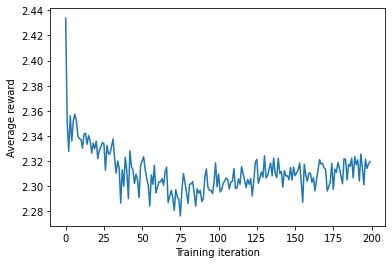

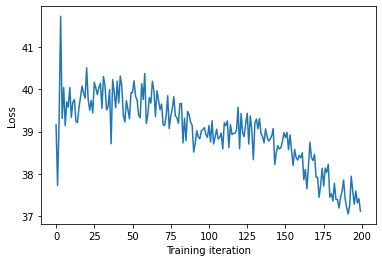






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.21it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.21it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.21it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.20it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.20it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.20it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.52it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.52it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.52it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 16.35it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.457534992531026
Proportion of valid SMILES: 0.8


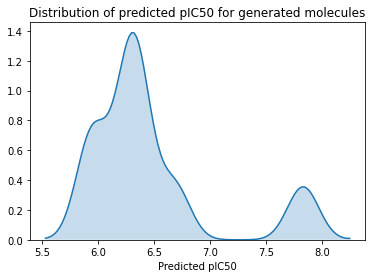






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)NCCCNCCOCCOCCNCc1ccc(N(C)C)cc1
CC(C)C(NS(=O)(=O)c1ccco1)C(=O)NCC(=O)NCc1ccccc1
CC1CCC(CC(C)(C)C)NC1=O
CCC(C)(C)NC(=S)Nc1nccs1
CCCCOc1ccccc1C=NNC(=O)NCCCc1ccccc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.90s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.89s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.97s/it]




Policy gradient...:  80%|████████  | 4/5 [00:32<00:08,  8.01s/it]




Policy gradient...: 100%|██████████| 5/5 [00:40<00:00,  8.03s/it]


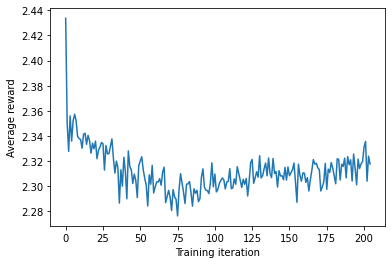

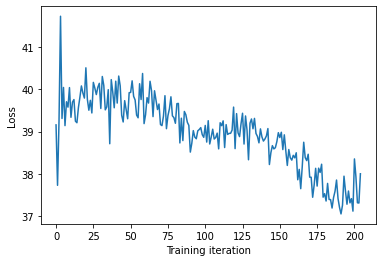






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.55it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.55it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.55it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.85it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.85it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.85it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.57it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.57it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.57it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 16.89it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.444878523984485
Proportion of valid SMILES: 0.6


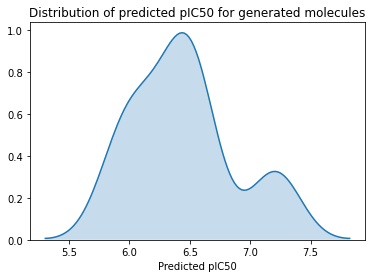






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)Nc1nc(CC(C)NC(C)=O)no1
CCCCc1c(C(=O)NCc2ccc(C)cc2)[nH]c(-c2ccccc2)c1C
COc1ccc2c(c1)c1ccccc1n2C
COc1ccccc1OCCOc1cccc(-c2ccccc2OC)c1
Cc1no(C)c(C)c1COC(=O)C=Cc1ccccc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.55s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:22,  7.43s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:14,  7.46s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.46s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.47s/it]


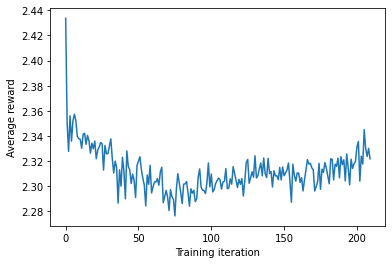

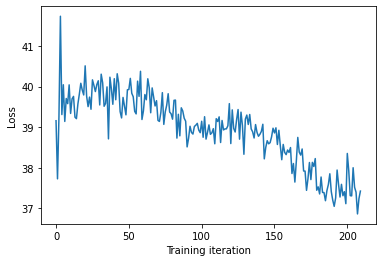






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.35it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.35it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.35it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.30it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.30it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.30it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.95it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.95it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.95it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 15.43it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.295133933680783
Proportion of valid SMILES: 0.6


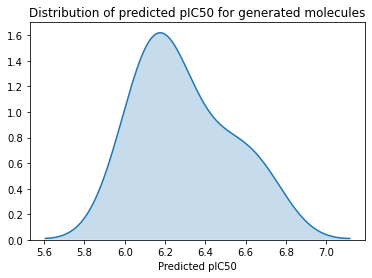






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CN(c1ccc(NS(N)(=O)=O)cc1)C(COS(=O)(=O)c1ccccc1)c1ccccc1
COc1ccc(-c2nc(C)nc3c(C)cc(C)nc23)cc1
COc1cccc(C2(O)CCCN2C(=O)c2ccsc2)c1
COc1ccccc1N1CCN(CCCNC(=N)N)C1=O
Cc1cc2c(N3CCC(C(c4ccccc4)c4ccccc4)CC3)cccc2o1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.54s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.56s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.70s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.78s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.81s/it]


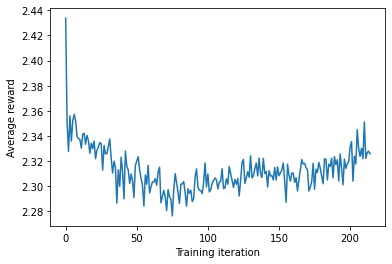

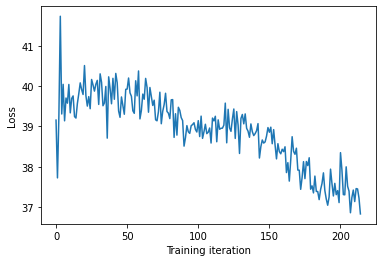






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 18.23it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 18.23it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 18.23it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.97it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.97it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.97it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.08it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.08it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.08it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 16.80it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.437935263079689
Proportion of valid SMILES: 0.8


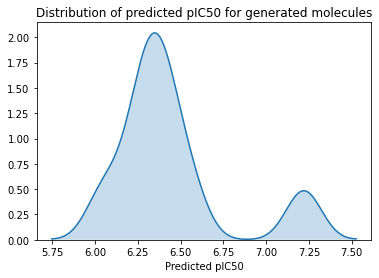






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCCCCCCCCCCC=CC(O)C1CCC(=O)C1(C)C
CN(C)CC1Nc2c(cccc2-c2cccnc2)C(=O)N(C)C1=O
COCOc1ccc2c(c1)C(C(=O)CCNC(=O)NCc1ccc3c(c1)NCCOCCO3)=C2
COc1ccc(-c2cc3nc(-c4ccccc4O)on3c2)cc1
Cc1ccccc1-c1ccc(-c2ccccc2O)cc1







Policy gradient...:  20%|██        | 1/5 [00:06<00:27,  6.91s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:21,  7.01s/it]




Policy gradient...:  60%|██████    | 3/5 [00:21<00:14,  7.20s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.23s/it]




Policy gradient...: 100%|██████████| 5/5 [00:36<00:00,  7.39s/it]


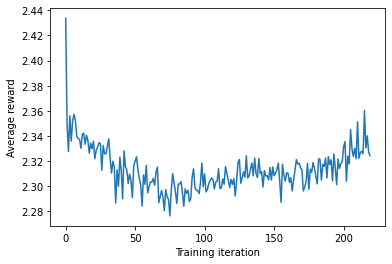

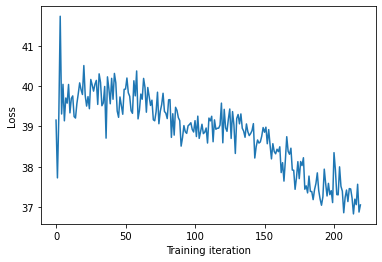






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.98it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.98it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.60it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.60it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.60it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.91it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.91it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 11.02it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 11.02it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 11.02it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.680063572917808
Proportion of valid SMILES: 0.8


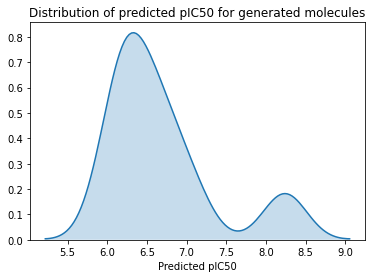






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CNc1cc(Cc2cccnc2)NC(=O)c2cccc3ccc(cc23)S(=O)(=O)N2CCCc2cc(-c2ccccc2)nn1
COC(=O)N1CCC(NC2CCC(C=NNC(=N)N)C2)CC1
COc1ccc(CNC(=O)NC2=C(O)NC(=O)NC2=O)cc1OC
CS(=O)(=O)N1CCN(C(=O)C2(c3ccccc3O)OC(=O)Nc3ccccc32)CC1
N#Cc1ccc(Cn2cnnc2C2CCC2(O)Cc2ccccc2)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:28,  7.21s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:21,  7.31s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.56s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.55s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.60s/it]


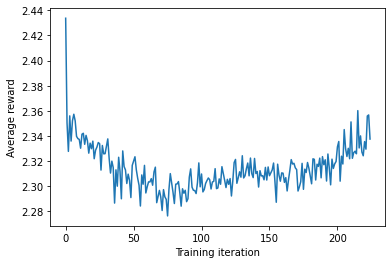

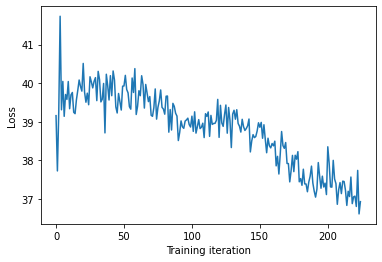






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.58it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.58it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.58it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.47it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.47it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.47it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.04it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.04it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.04it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 16.70it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.357658023141436
Proportion of valid SMILES: 0.8


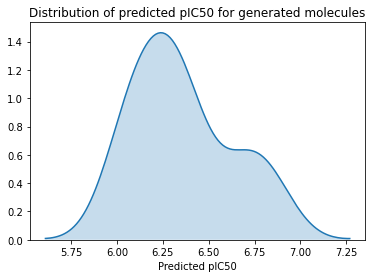






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCCCCCOCCCCCNCCCN1CC[N+](C)(C#N)CC1
CCN1CCC2C3CC4CC(CC(O)C43)C2(C)C1
COc1cc(C=CS(=O)(=O)c2ccc(Cl)cc2)ccc1O
COc1ccc(C(C)NC(C)C2CCCN2C(=O)CCCc2cnn[nH]2)cc1
COc1ccc(Cl)cc1n1nc(C)cc1N(=O)=O







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.87s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.77s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.73s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.75s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.70s/it]


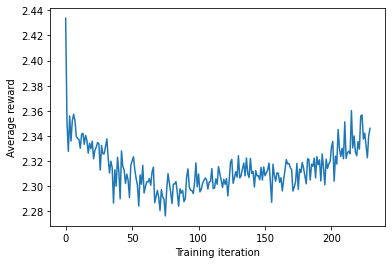

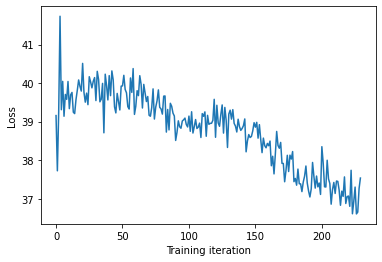






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.26it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.26it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.26it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.65it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.65it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.65it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.23it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.23it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.23it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 14.88it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.402318084999266
Proportion of valid SMILES: 0.7


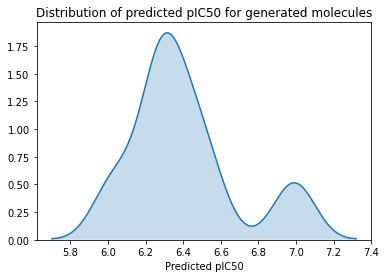






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)NCC(=O)N(CC(=O)NC(C)c1ccc(C(C)C)cc1)c1ccccn1
CC(CCc1ccccc1S(N)(=O)=O)CNC(=O)c1ccc(N(=O)=O)o1
CCCCN1CCCC1COc1ccc(-c2ncc(-c3ccccc3)s2)cc1
CCOC(=O)Cc1cccc2c1OCN(C(=O)CNC(=O)c1ccccn1)C2
COc1ccc(C(=O)NCCCNc2ncccc2N2CCCC2)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.72s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.66s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.57s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.54s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.56s/it]


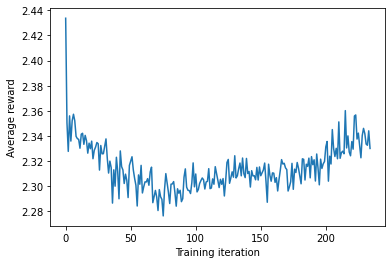

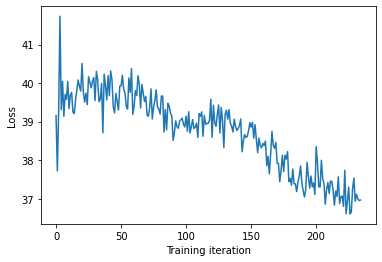






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.82it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.82it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.82it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 17.50it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 17.50it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 14.10it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 14.10it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 14.10it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 15.21it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 15.21it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00

Mean value of predictions: 6.400989663197653
Proportion of valid SMILES: 0.7


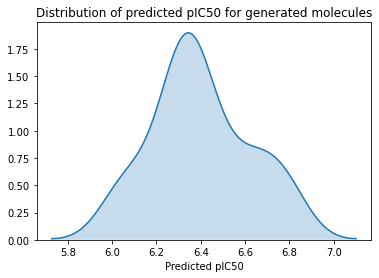






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC1CCC(NC(=O)C(=O)Nc2nn(-c3ccccc3)cc2CC2CCCO2)CC1
CCC1OCCCCCCCCC2CC3C(O)CCC(C)(CCC3CCCCCCCC(=O)O)C21
CCCOC(=O)N1CCC(Cn2ccnc2)C1
CCON=C(C)NC(=O)C(C)NC(=O)Nc1ccccc1C
COc1ccc(CN2CCC3CCC(CC(C)C)C3C2)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.91s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.83s/it]




Policy gradient...:  60%|██████    | 3/5 [00:24<00:16,  8.02s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.87s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.84s/it]


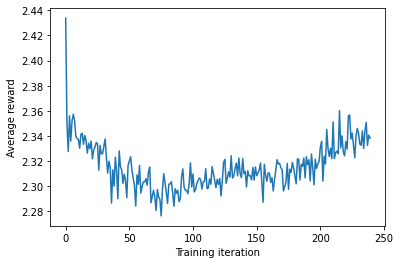

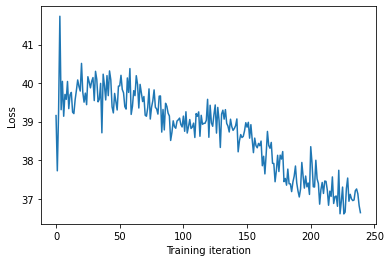






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.16it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.16it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.16it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 17.44it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 17.44it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 17.44it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.35it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.35it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.35it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.35it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00

Mean value of predictions: 6.428429627348945
Proportion of valid SMILES: 0.5


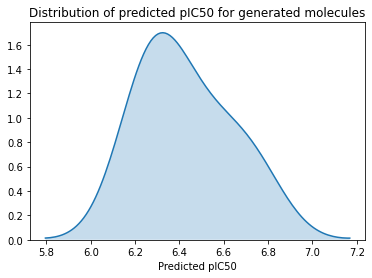






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
C=CCCCCC(C)CO
CC(C)C(NC(C=O)Cc1ccccc1)C(=O)O
CC(C)CC(CN(C)Cc1ccccc1)C(=O)NC(C)C(=O)NCCN1CCOCC1
CCOC(=O)C(CC(N)=O)Nc1nc(-c2ccc(C)cc2)cs1
COc1ccc(C2CCC(=O)C2)cc1OC







Policy gradient...:  20%|██        | 1/5 [00:07<00:29,  7.43s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:22,  7.45s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.54s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.48s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.57s/it]


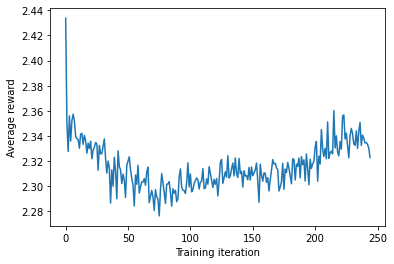

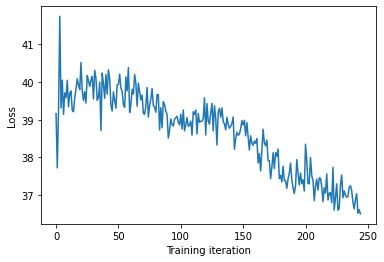






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.60it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.60it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 14.25it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 14.25it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 14.25it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 14.26it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 14.26it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 14.26it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 14.26it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 13.52it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.262475597969691
Proportion of valid SMILES: 0.6


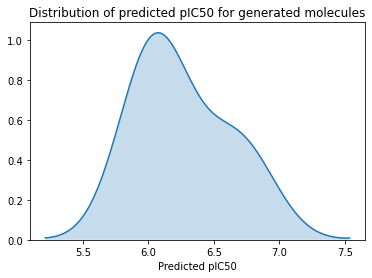






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
C=CC1=CC(=O)NO1
CCCC(=O)N1C(=O)N(CCC(=O)NCC(Cc2ccccc2)C(=O)NC(NC(=O)C(CC(C)C)C(C)C)C(=O)NC(CCC)C(=O)OCC2CCCC2)CC1O
CCCCC(=O)NC(C(=O)c1ccccc1)C1CCC(OC)CC1
O=C(CCCCCC=CCCCCCNCCCCCCCCNC(=O)CC(O)COc1ccc(Cl)cc1)NCCNc1ccccc1
O=C1C=C(CCO)c2ccc(N(=O)=O)cc2O1







Policy gradient...:  20%|██        | 1/5 [00:07<00:29,  7.27s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.49s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:14,  7.44s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.45s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.66s/it]


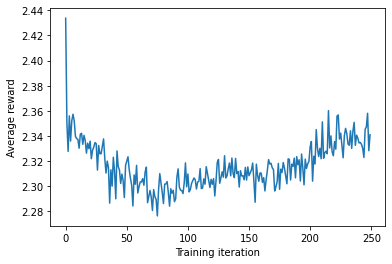

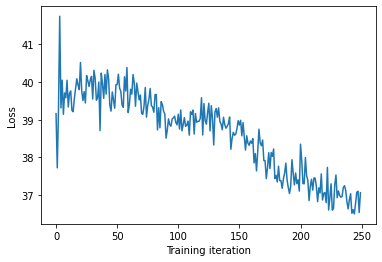






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.74it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.74it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.74it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.03it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.03it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.03it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.52it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.52it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.52it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 15.03it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.455969229048049
Proportion of valid SMILES: 0.7


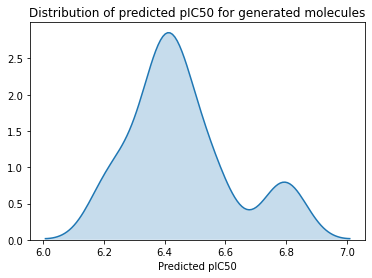






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)CC(=O)Nc1cccc(CCNC(=O)C(N)CC(=O)O)c1
CCCCNc1nc(Nc2ccccc2O)c2ccccc2n1
CCCN(CCC)c1ccc(C(=O)c2cccc(N(=O)=O)c2)n1-c1ccccc1
CCN(CC)CC1CCc2cc(F)c(CNC(C)C(=O)O)c(O)c2C1
COc1ccc(N2CCC(c3ccsc3)CC2)cc1OCC1CCCC1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.55s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.68s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.59s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.73s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.75s/it]


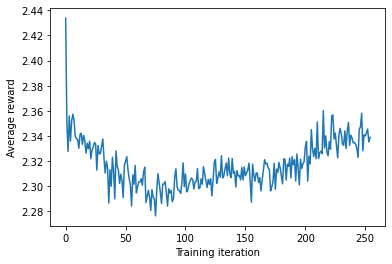

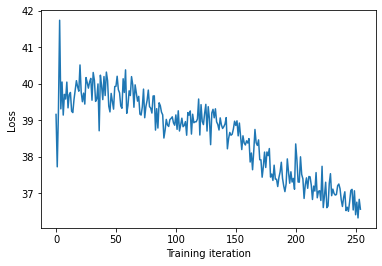






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.13it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.13it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.13it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.83it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.83it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.83it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.97it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.97it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.97it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 16.36it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.485618758955262
Proportion of valid SMILES: 0.7


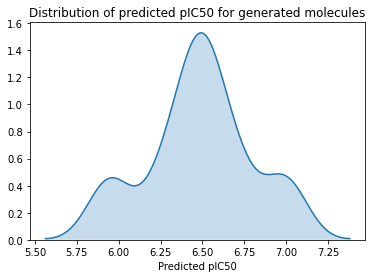






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(CO)CC1OC(=O)CCc2ccccc21
CN(C)CCNc1ccc(-c2cccc(-c3ccncc3)c2)cn1
CN1CCN(C(=S)N(C)Cc2ccccc2)CC1
COc1ccc(OC)c(NCCc2ccccc2)c1
O=C(Nc1ccc2ncccc2c1)OCC(=O)N1CCNc2ccccc21







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.53s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.56s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.57s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.61s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.61s/it]


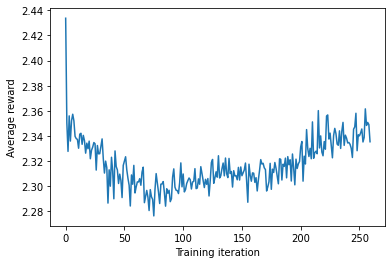

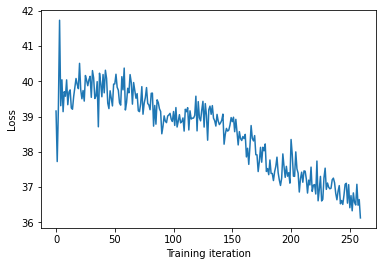






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.47it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.47it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.47it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.47it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 13.30it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 13.30it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 13.30it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 13.28it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 13.28it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 13.28it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00

Mean value of predictions: 6.60637475957719
Proportion of valid SMILES: 0.6


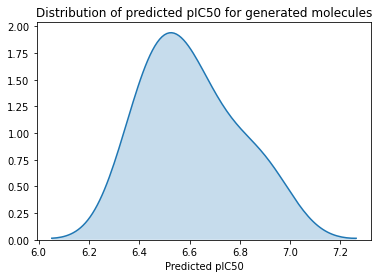






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(CO)c1ccccc1-c1ccccc1
CCCCCCCCCC(=O)OCCC(C)C
CN(C)CCCOc1cccc(C(=NO)C2CCCC2)c1
COc1ccccc1C(C)CSC1CC(n2cnc3c(N)ncnc32)C(O)C1O
CSCCC(NC(=O)CNC(=O)C(CC1CCCCC1)Nc1ncccc1C)NC(=O)C(C)C







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.97s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.86s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.80s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.77s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.66s/it]


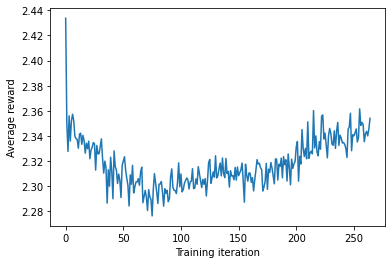

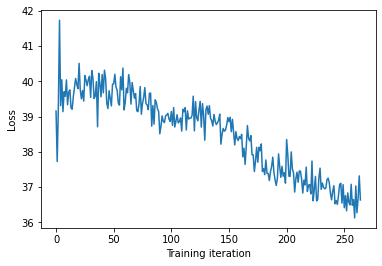






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.66it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.66it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.66it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.85it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.85it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.85it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.96it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.96it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.96it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 13.98it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.648154496733579
Proportion of valid SMILES: 0.8


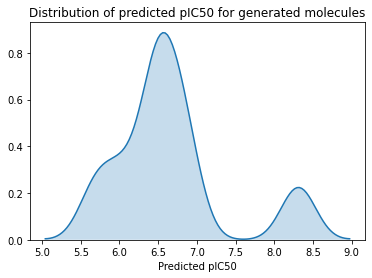






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCCCC1CC(c2cnn[nH]2)CCN1C(=O)c1ccc(Cl)cc1
COc1ccc(C2OC(=O)N(CCC(C)C)C=C2C)cc1
COc1cccc(N2CCN(C(=O)C(Cc3ccccc3)NC(=O)c3ccccc3)CC2)c1
Cc1ccccc1OC(c1ccccc1)c1ccccc1
O=C(NCCN1CCCCc1=NNC(=O)c1cccs1)c1ccccc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.63s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.63s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.58s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.54s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.61s/it]


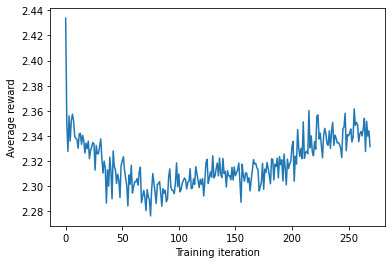

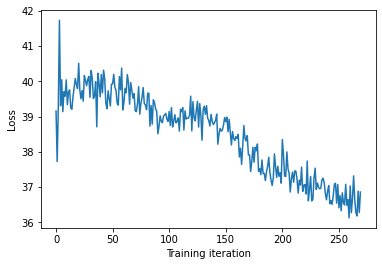






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.91it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.91it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.91it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.91it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 17.43it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 17.43it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 17.43it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.00it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.00it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.00it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00

Mean value of predictions: 6.479267966706391
Proportion of valid SMILES: 0.7


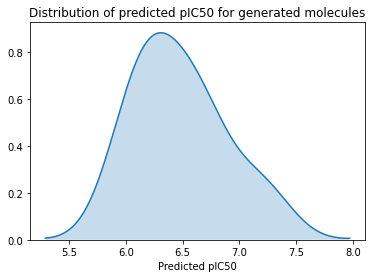






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCCC1C=C(OC)c2ccccc2C1=O
CCCCCCCCCCOc1ccc(CN2C=CCCC2=O)cc1
CCCCNC(=O)Cn1c(CCN2CCCC2)nnc1-c1ccccn1
Cc1cccc(-c2cnn(CC3CCCC3)c2)c1
Cc1cccc(C(=O)NN=Cc2ccccc2)c1







Policy gradient...:  20%|██        | 1/5 [00:07<00:28,  7.14s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.38s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.54s/it]




Policy gradient...:  80%|████████  | 4/5 [00:31<00:07,  7.71s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.78s/it]


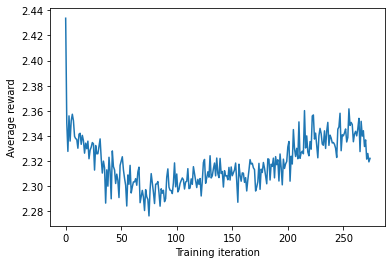

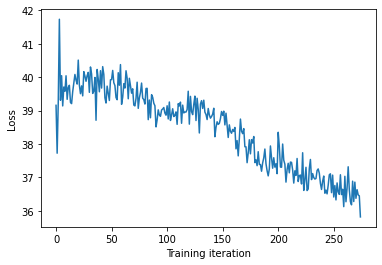






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 10.47it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 10.47it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.14it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.14it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 10.14it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.72it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.72it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 11.72it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 13.12it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 13.12it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00

Mean value of predictions: 6.382519719203509
Proportion of valid SMILES: 0.7


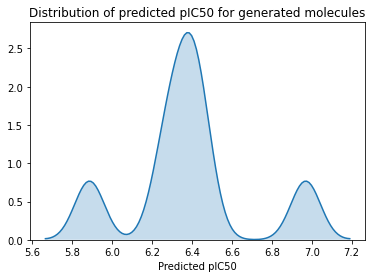






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC1C(=O)CCCC1C=CC(O)(COC1OC(O)C(O)C(O)C1OC1c2cccc(CO)c2CC1O)CN1CCOCC1
COc1ccc(C(=O)NCc2nnnn2C)cc1OC
COc1ccc(N2CCN(C(=O)C(Cc3ccccc3)NC(=O)OC(C)(C)C)CC2)cc1
COc1ccccc1CNC(=O)CSC1=CC(=O)OC(C)=C1
COc1ccccc1CNC(=O)c1cccc(Oc2ccc(Cl)cc2)c1







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.77s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.67s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.59s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.41s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.44s/it]


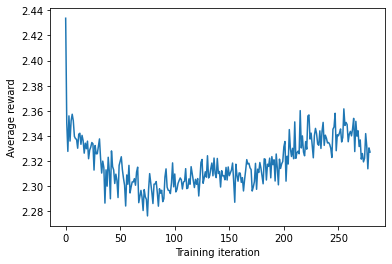

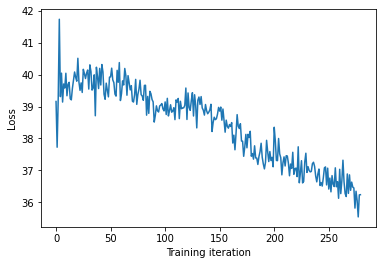






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.86it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.86it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.86it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.93it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.93it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.93it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.07it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.07it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.07it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 15.52it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.629711159035092
Proportion of valid SMILES: 0.5


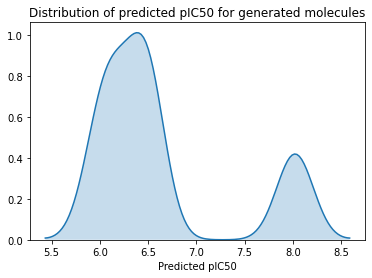






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)C1=CC(=CC(=O)c2ccc(O)c(O)c2)S(=O)(=O)N=C1
Cc1ccccc1NC(=O)CSC1=NC(=O)SC1=N
O=C(Cc1ccccc1)Nc1nnc(-c2ccccc2)o1
O=C(Cc1ccccc1C(F)(F)F)Nc1cccc2ccccc12
O=C(NNC1=NC(=O)C(c2ccccc2)N=CC1)c1ccccc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.53s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.54s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.57s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.58s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.58s/it]


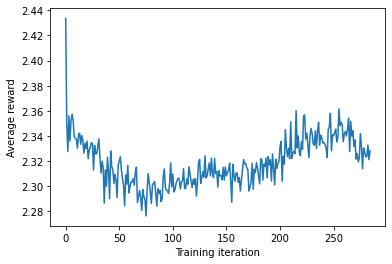

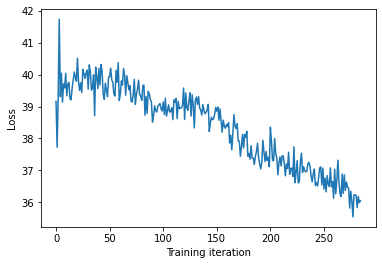






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.34it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.34it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.34it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.56it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.56it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.56it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.88it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.88it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.88it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 14.11it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.613161286348163
Proportion of valid SMILES: 0.8


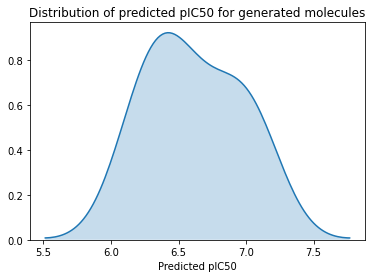






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCCC(=O)OCCc1ccc(S(=O)(=O)N2CCCC2)cc1
CCN1C(=O)c2ccccc2C2=C1c1ccccc1N2
CN1C=C(O)C=C(C=Cc2cccc(CCCCCCCCO)c2O)C1=O
COc1ccccc1N1CC(COC(=O)C=Cc2ccc(O)cc2)C(O)C1O
Cc1cc(-c2ccccc2)ccc1N(CCC(C)C)C(=O)c1cccnc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.64s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.56s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.56s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.64s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.58s/it]


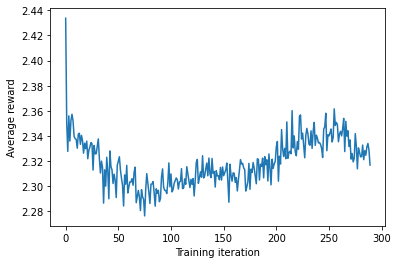

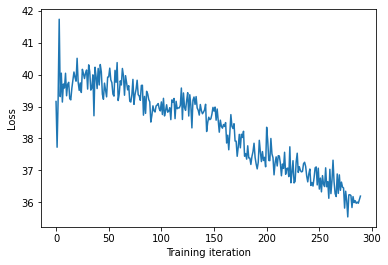






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.79it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.79it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.79it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.76it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.76it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.76it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.53it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.53it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.53it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 14.36it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.462427250145168
Proportion of valid SMILES: 0.7


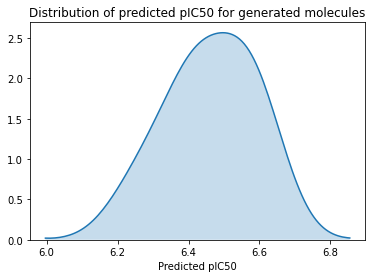






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C(=O)NCc1ccncc1)c1ccccc1
CC1CCCC(C)N1CCC(=O)NCCCc1cccc(C2=NCCC2)c1
CC1CCCN1c1c(Sc2cccc(Cl)c2)noc1C(=O)N1CCCCC1
CCC1=CN(Cc2ccc(C(F)(F)F)o2)C(=O)N1NC(N)=O
CCCCOC(=O)CN1C(=O)NC(=O)C(Cc2ccccc2)C1=O







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.67s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:22,  7.53s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:14,  7.49s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.58s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.55s/it]


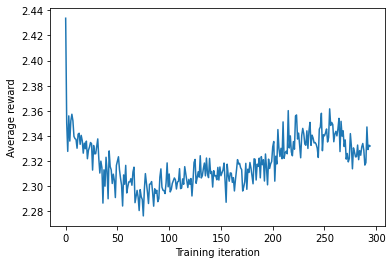

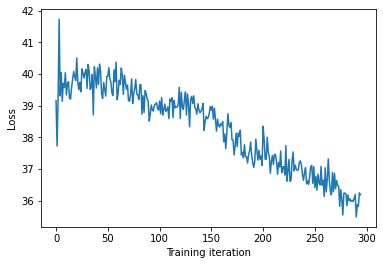






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.70it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.70it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.70it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.62it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.62it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.62it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.70it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.70it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.70it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.70it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00

Mean value of predictions: 6.333585316390741
Proportion of valid SMILES: 0.7


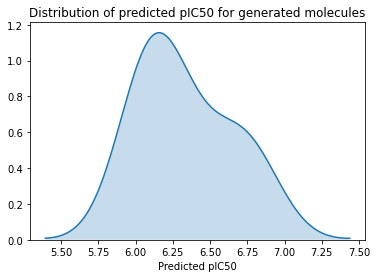






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)N1Cc2cccnc2C1NCc1ccccc1
CC1CCC(C(=O)NO)C1
CC1CCCN1C(=O)CN1c2ccccc2Oc2ccccc21
CCOc1cccc(NC(=O)c2ccc(Oc3ccccc3)cc2)c1
COCCN1C=C(Cc2ccccc2)C(c2ccccc2Cl)c2ccc(N(=O)=O)cc21







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.62s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:22,  7.51s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.53s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.47s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.48s/it]


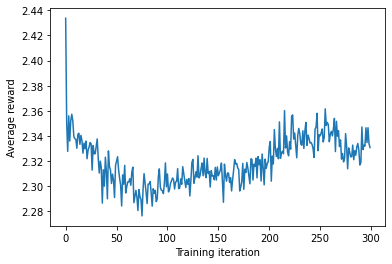

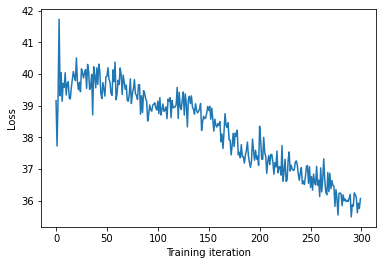






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 21.62it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 21.62it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 21.62it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 19.52it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 19.52it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 19.52it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 18.37it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 18.37it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 18.37it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00:00, 16.

Mean value of predictions: 6.400676904422868
Proportion of valid SMILES: 0.7


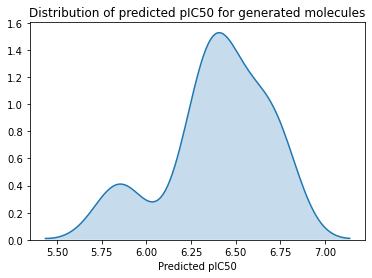






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCCCCC(C)N=CCC1=CC(CC(O)c2ccc(Br)cc2)=C(F)c2ccccc21
CCCCCCCC(O)CCCCCCCC1CCC(C(=O)NCCC(=O)NCCC(C)C)CC1
CCCc1ccc(S(=O)(=O)Nc2ccccc2)cc1
CCc1cc(C)ccc1OCC(=O)Nc1ccc(C)cc1
COc1ccccc1C(N)C(N)C(=O)O







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.89s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.82s/it]




Policy gradient...:  60%|██████    | 3/5 [00:23<00:15,  7.82s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.75s/it]




Policy gradient...: 100%|██████████| 5/5 [00:39<00:00,  7.83s/it]


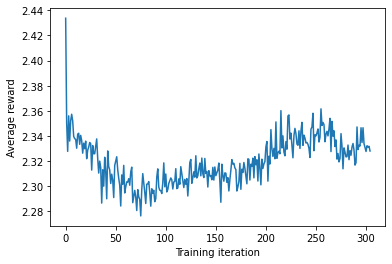

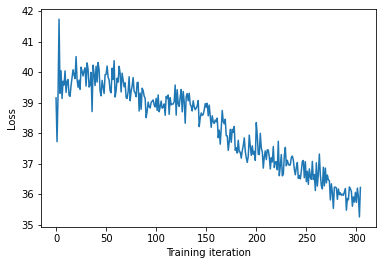






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.97it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.97it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.97it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.97it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 16.89it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 16.89it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 16.89it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 16.88it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 16.88it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 16.88it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00

Mean value of predictions: 6.709591283907987
Proportion of valid SMILES: 0.7


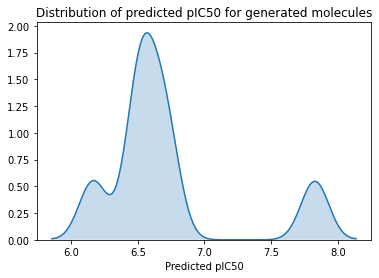






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCOC(=O)c1cccc(-c2ccccc2)c1
CCOc1ccc(O)c(CNC(=O)CSc2nccnc2N)n1
CN(C)S(=O)(=O)N1CCN(c2ccccc2Cl)CC1
COc1cc2nccc(C)c2cc1NC(=O)Cc1ccccc1
COc1ccc(CN2CCN(CCN(C)C)CC2CO)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.60s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:22,  7.44s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:14,  7.49s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.32s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.44s/it]


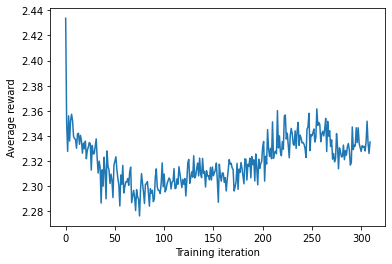

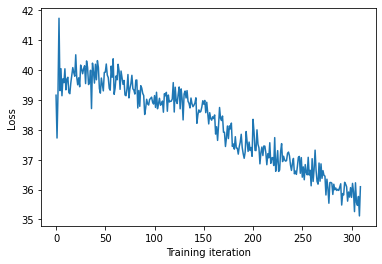






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 18.37it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 18.37it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 18.37it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 17.75it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 17.75it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 17.75it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.19it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.19it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.19it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 16.26it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.357766947788446
Proportion of valid SMILES: 0.7


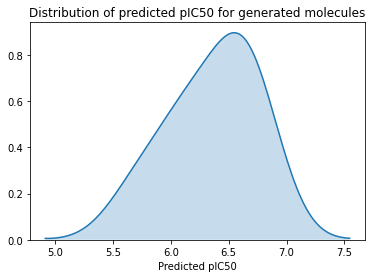






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCN(CCc1ccccc1OC)CC(C)C
COc1ccc(CNC(=O)CCCC(=N)SC)cc1
N#Cc1ccc(N)cc1-c1cnccn1
O=C(O)CCC1=Nc2ccccc2C(=O)N1CCN1CCN(c2cccc(F)c2)CC1
O=C(c1ccccc1)C1CCC(O)CC1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.56s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.55s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.54s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.47s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.50s/it]


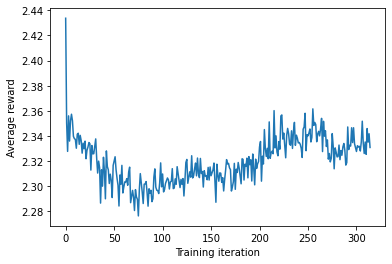

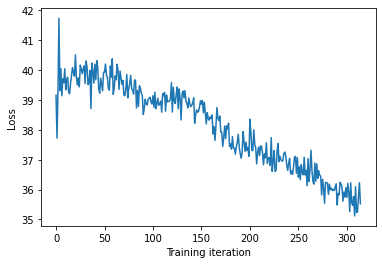






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.67it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.67it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.67it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 17.87it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 17.87it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 17.87it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 17.56it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 17.56it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 17.56it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 18.19it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.587907073224192
Proportion of valid SMILES: 0.7


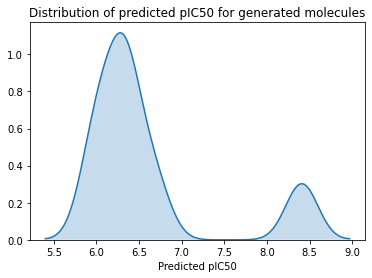






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCN(Cc1cc(C)on1)c1ccccc1
CCOC(=O)C=CC(=O)CCC(C)C
CCOCCNc1ncc2oc(-c3ccccc3F)c(NC)c2n1
COc1ccc(C(=O)NC2=NCCS2)cc1
Cc1cccc(S(=O)(=O)NCCN2CCCCCC2)c1







Policy gradient...:  20%|██        | 1/5 [00:07<00:29,  7.48s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:22,  7.39s/it]




Policy gradient...:  60%|██████    | 3/5 [00:21<00:14,  7.35s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.43s/it]




Policy gradient...: 100%|██████████| 5/5 [00:36<00:00,  7.35s/it]


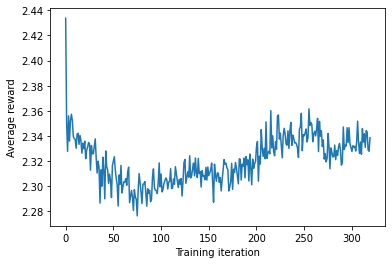

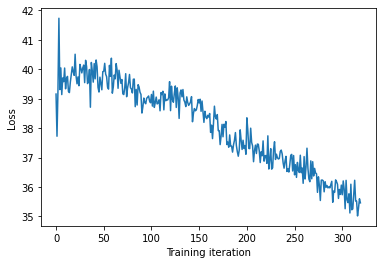






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.15it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.15it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.15it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.10it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.10it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.10it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.71it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.71it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.71it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 15.77it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.28673862079242
Proportion of valid SMILES: 0.6


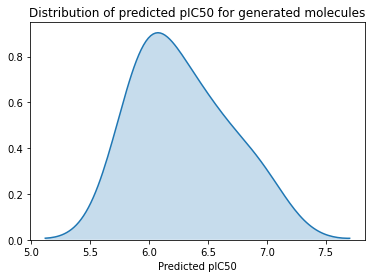






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCN1CCN(CC(O)C(O)COc2ccccc2)C1C
CN(C1CCCCC1)S(=O)(=O)c1ccccc1NC(=O)c1ccccc1
COc1ccc(-c2ccc(C(=O)Nc3cccnc3)cc2)cc1
COc1ccccc1N1CCN(CCCNC(C)=O)CC1
Cc1noc(C)c1CCCC(=O)NNC(=S)Nc1ccccc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.57s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.54s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.62s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.46s/it]




Policy gradient...: 100%|██████████| 5/5 [00:36<00:00,  7.39s/it]


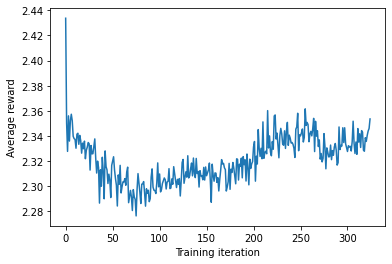

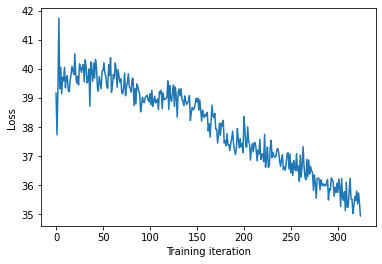






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.28it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.28it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.28it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.38it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.38it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.38it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.05it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.05it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.05it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 14.31it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.440313312585921
Proportion of valid SMILES: 0.6


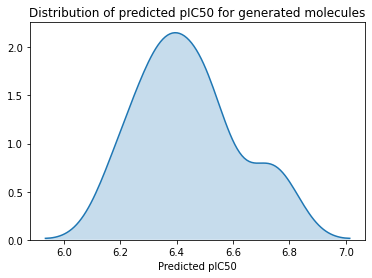






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC1CCC(N2CCCC(C(=O)Nc3ccc(NC(CCN(C)C)S(=O)(=O)Cc4ccccc4)cc3)C2)CC1
CCOCCCOc1cccc(CC(C)NCC(O)CN2CCOCC2)c1
COc1ccccc1CC(=O)NCCCN1CCCC1c1ccc(Cl)cc1
Cc1ccccc1NC(=O)CC1=NN(CC(=O)NC2CCC2)c2ccccc2C1=O
FC(F)(F)c1cnc(SCc2ccccc2Cl)nc#1







Policy gradient...:  20%|██        | 1/5 [00:07<00:29,  7.41s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.55s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.52s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.68s/it]




Policy gradient...: 100%|██████████| 5/5 [00:38<00:00,  7.66s/it]


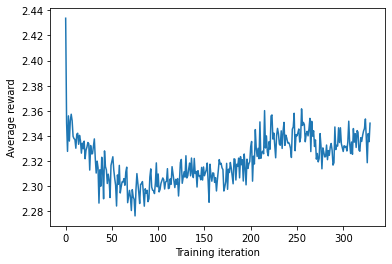

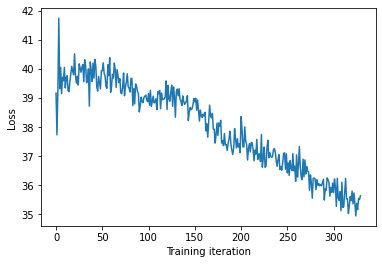






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.19it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.19it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.19it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.14it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.14it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.14it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 11.49it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 11.49it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 11.49it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 12.58it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.630760713883809
Proportion of valid SMILES: 0.6


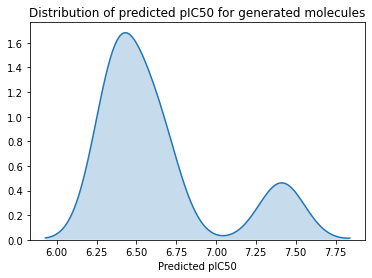






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC1=CC2CCC3C4CCC(CNC2(C)CCC43)sCCC1
CC1CCC2C(c3ccccc3)NCC(C1)N2C(=O)Nc1ccc(C(C)(C)C)cc1
CCC(C(C)=CCCC(=O)C#CCSC1=NC(=O)C(O)=C(CCCCCl)C1=O)c1ccccc1
COc1cccc(-c2cncc(C(C)N(C(C)C)C(C)C)c2)c1
COc1ccccc1CNC(=O)C1CC1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.61s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.64s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.52s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.49s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.46s/it]


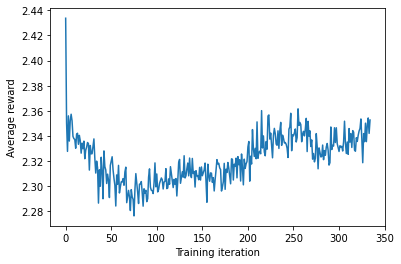

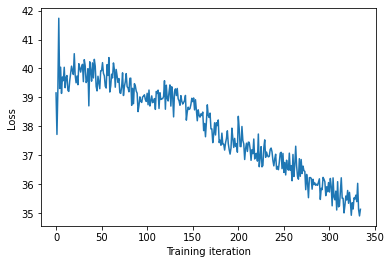






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 23.61it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 23.61it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 23.61it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 19.96it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 19.96it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 19.96it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 18.76it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 18.76it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 18.76it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00:00, 16.

Mean value of predictions: 6.256984374341438
Proportion of valid SMILES: 0.8


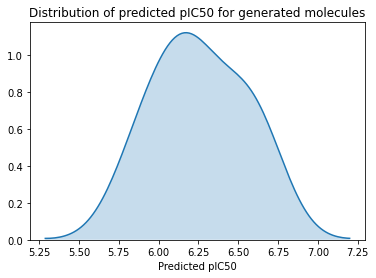






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
COC1CCC(NCC(C)C(O)CCCS(C)(=O)=O)C1
COc1ccc(N2CCN(C(=O)CNC(=O)CN(C)CC(=O)O)CC2)cc1
COc1ccc(O)c(CC(NC(=O)C(NC(=O)C(CC2CCCCC2)NC2CCCCCC2)C(C)C)c2ccccc2)c1
Cc1nc(Oc2ccccc2)nc(-c2ccc(OCCC(C)C)cc2)n1
Cc1ncccc1SCC(=O)Nc1cccnc1







Policy gradient...:  20%|██        | 1/5 [00:08<00:32,  8.02s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:23,  7.77s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.72s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.62s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.52s/it]


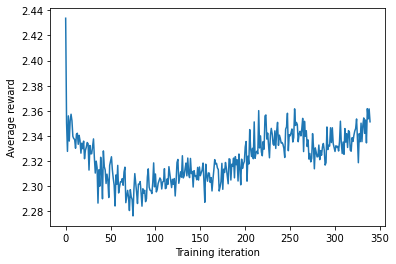

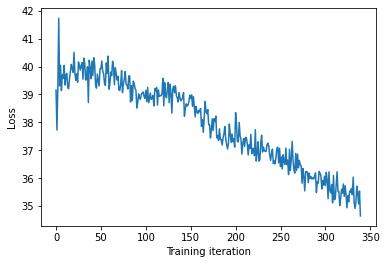






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.77it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.77it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.77it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.77it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 16.15it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 16.15it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 16.15it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 16.15it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 17.41it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 17.41it/s]




Generating molecules...: 100%|██████████| 10/10 [00:00<0

Mean value of predictions: 6.312321990740619
Proportion of valid SMILES: 0.8


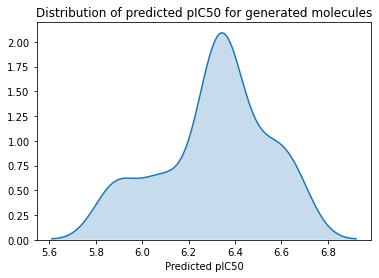






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)N1CCOCC1NC(=O)CSc1ccccc1
CC1CN(C(=O)C2CCCCC2)CCc2ccccc21
CC1CN(C(=O)CCCCNC(=O)CSCc2ccccc2)CCN1Cc1ncsc1N
CCCCCCNC(=O)C1CCCN(c2cccc(Cl)c2)C1
CN(C(=O)c1cccs1)c1cccc(N(=O)=O)c1







Policy gradient...:  20%|██        | 1/5 [00:07<00:29,  7.27s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:21,  7.29s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:14,  7.41s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.33s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.48s/it]


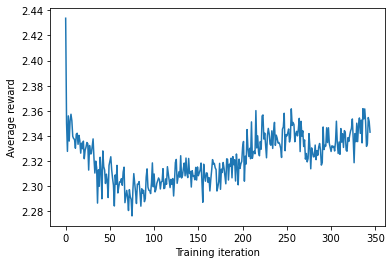

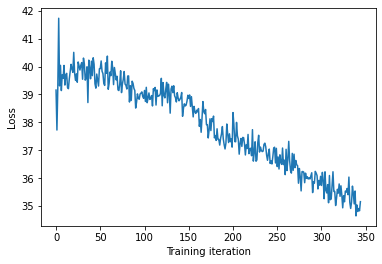






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.80it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.80it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.80it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.27it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.27it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.27it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.27it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 16.09it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 16.09it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 16.09it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00

Mean value of predictions: 6.378465797022736
Proportion of valid SMILES: 0.7


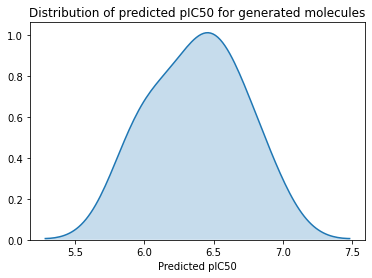






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
Brc1ccccc1Cn1ccnc1
CC(Cn1ccc2ccccc21)NCC(O)COc1ccccc1
CC1CCCCN1C(=O)CCCNC(=S)Nc1ccccc1
CCN(CC)CCCCNC(=S)Nc1c(C)cccc1C
CCN1CCN(C(=O)c2ccccc2)CC1







Policy gradient...:  20%|██        | 1/5 [00:07<00:31,  7.90s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:22,  7.64s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.58s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.57s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.47s/it]


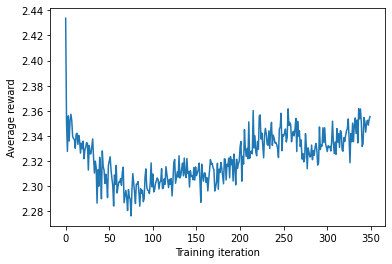

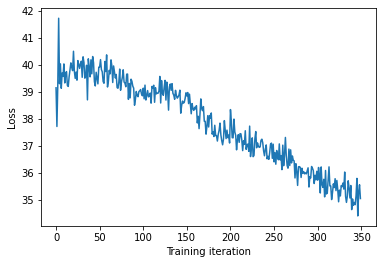






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 19.64it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 19.64it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 19.64it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 19.28it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 19.28it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 19.28it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 17.14it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 17.14it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 17.14it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 17.12it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.530425920380107
Proportion of valid SMILES: 0.8


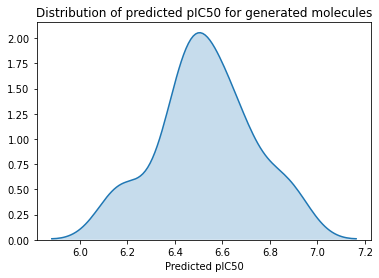






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(c1ccccc1)N1CCN(C(=O)CN2N=C(c3ccccc3)CCN2C)CC1
CCCCCCCCCCCCCCCCCN(C)CC(O)COCc1ccccc1
CCOC(=O)C1CCOC1(C)C
COc1ccc(CO)cc1CCCCN1CCN(Cc2ccccc2)CC1
COc1ccc(Cs2CCOCC2)cc1C







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.74s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.62s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.59s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.46s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.45s/it]


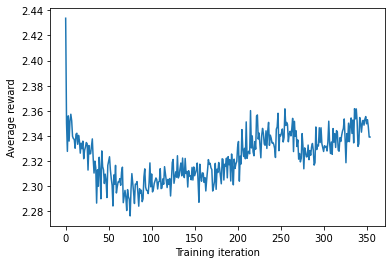

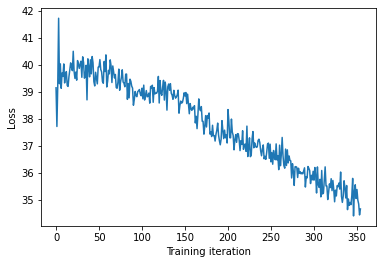






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.66it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.66it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.66it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.32it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.32it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 12.32it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.59it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.59it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.59it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 12.59it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00

Mean value of predictions: 6.490577411230679
Proportion of valid SMILES: 0.8


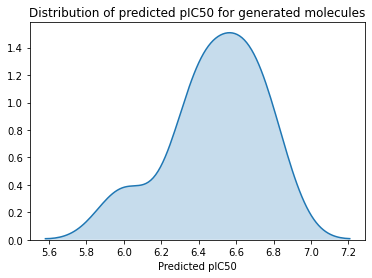






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)(C)CNC(=O)c1n[nH]cc1CNc1ccccc1
CC(C)(c1ccccc1)c1ccc(OCC(=O)N2CCN(c3ccc(Cl)cc3)CC2)nc1
CC(C)CC(NCc1ccccc1)C(=O)NC(Cc1ccccc1)C(=O)NC(Cc1ccccc1)C(=O)O
CC1CC(=O)N(c2ccccc2)C12COC(=O)CC(c1ccccc1)c1cccc(c1)C2
CCCCNC(=O)N(C)CCCC1CCCCC1







Policy gradient...:  20%|██        | 1/5 [00:07<00:28,  7.21s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:21,  7.27s/it]




Policy gradient...:  60%|██████    | 3/5 [00:21<00:14,  7.24s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.26s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.46s/it]


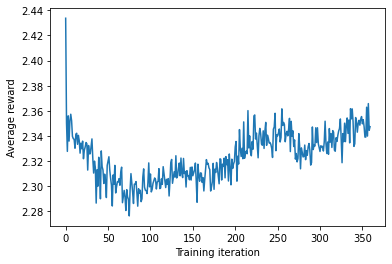

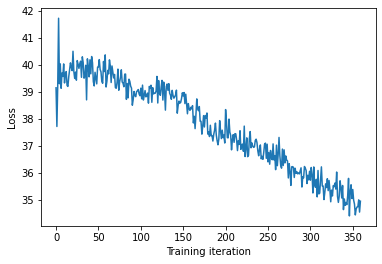






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 19.54it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 19.54it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 19.54it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 19.50it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 19.50it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 19.50it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 17.49it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 17.49it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 17.49it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 16.46it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.423319432768601
Proportion of valid SMILES: 0.6


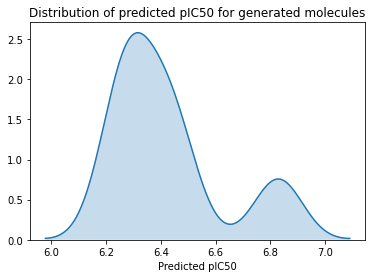






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(c1ccccc1OCC(=O)Nc1ccccc1)C(O)c1ccccc1
CC1=C(N2CCCCCC2)C(=O)Nc2ccccc21
CC1CCN(c2ccc(NC(=O)CN3C(=O)Nc4ccccc43)cc2)CC1
CCCCCCCc1c[nH]cn1
CCN(CC)CCN(c1ccccc1)c1ccc(NC(C)=O)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:29,  7.35s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:21,  7.18s/it]




Policy gradient...:  60%|██████    | 3/5 [00:21<00:14,  7.24s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.39s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.46s/it]


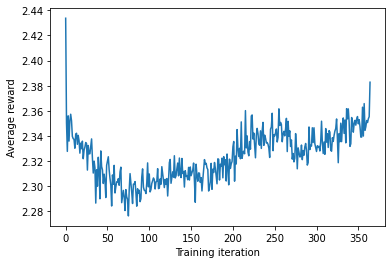

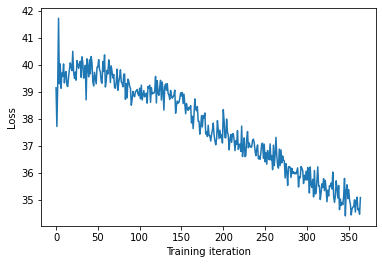






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.37it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.37it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.37it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.05it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.05it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.05it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.32it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.32it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.32it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.32it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00

Mean value of predictions: 6.566708711375783
Proportion of valid SMILES: 0.7


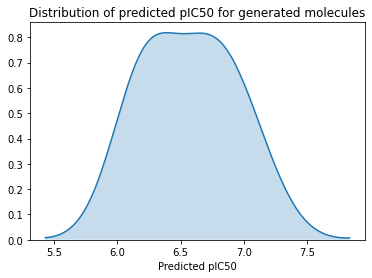






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC1Cc2ccccc2S1(=O)=O
CCC1=Nc2ccccc2C(=O)N1CCO
CCCCCCC(C)NC(=O)CC1CN(CCNc2nc(C)nn2-c2ncccn2)C1CC
CCCCCCNC(=O)Cn1nc(-c2ccc(C(F)(F)F)cc2)cc1C(=O)O
COc1ccc(Cl)cc1C1CCN(Cc2ncccn2)CC1







Policy gradient...:  20%|██        | 1/5 [00:07<00:28,  7.23s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:21,  7.29s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:14,  7.42s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.44s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.41s/it]


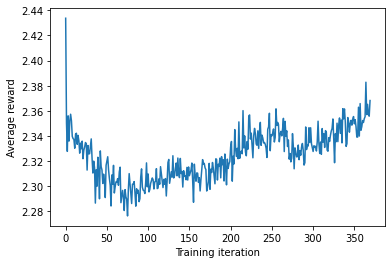

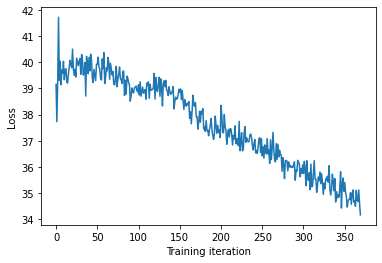






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.83it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.83it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.83it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.30it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.30it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.30it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.56it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.56it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.56it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 15.82it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.532190062966515
Proportion of valid SMILES: 0.7


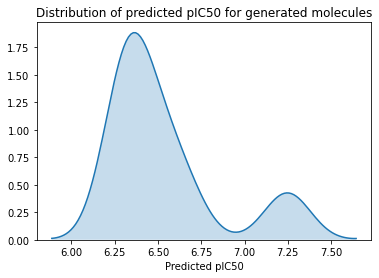






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC1CC(=O)C(C(C)C)(C2CC(=O)CN2C=N)N1
CC1CN1CC1CCCCN1CCCOc1cccc2ccccc12
CN1CCCN(C2CCCCC2CCO)CC1
COc1cc2c(cc1Cl)C=C(C(=O)OC(C)(C)O)C1CN=C(N1)O2
Cc1cccc(-c2ccccc2C(=O)NCC(N)=O)c1







Policy gradient...:  20%|██        | 1/5 [00:07<00:29,  7.35s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:22,  7.37s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:14,  7.45s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.48s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.47s/it]


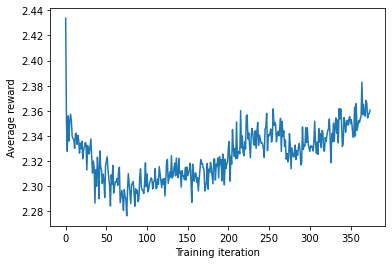

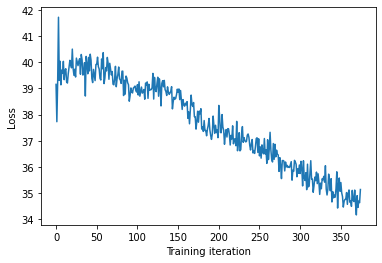






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.28it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.28it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.28it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.36it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.36it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.36it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.39it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.39it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.39it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 17.04it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.513343601739585
Proportion of valid SMILES: 0.7


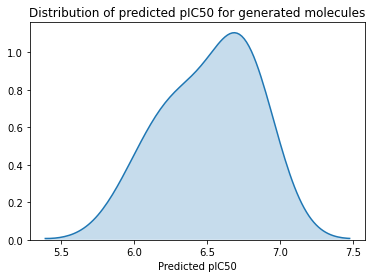






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)(C)c1cccc(Cl)c1
CC(C)N1Cc2ccccc2C1CCCOc1ccccc1C(=O)N1CCOC1
CCCCCC(CC)COC(C)C
CCCCCNC(=O)C(C)NC(=O)c1ccc2ccccc2c1
O=C(Nc1ccc(Cl)c(Cl)c1)c1cccnc1NCC1CCCCCC1







Policy gradient...:  20%|██        | 1/5 [00:07<00:29,  7.35s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.44s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:14,  7.46s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.43s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.52s/it]


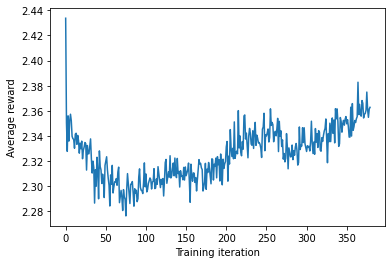

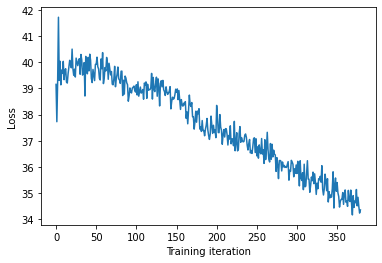






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.83it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.83it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.83it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.83it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 18.07it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 18.07it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 18.07it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.65it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.65it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.65it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00

Mean value of predictions: 6.265071760096942
Proportion of valid SMILES: 0.6


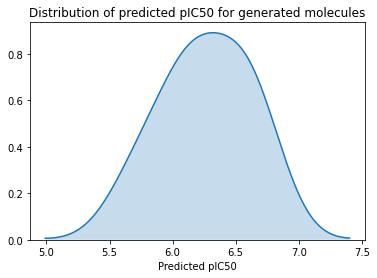






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CN(C)c1ncccc1COc1ccccn1
COc1ccc(C(C)NC(=O)CN2CCCC2=O)cc1
COc1ccccc1C=NNC(=O)C1CCCC1
COc1ccccc1NS(=O)(=O)c1ccccc1
Cc1cccc(CCC(=O)N2CCN(Cc3ccccc3)CC2)c1







Policy gradient...:  20%|██        | 1/5 [00:07<00:28,  7.09s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:21,  7.21s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:14,  7.31s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.47s/it]




Policy gradient...: 100%|██████████| 5/5 [00:36<00:00,  7.38s/it]


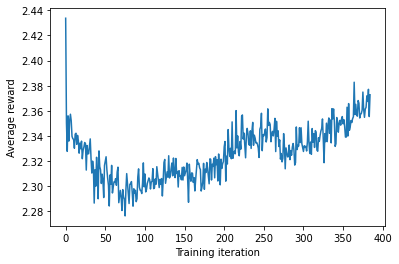

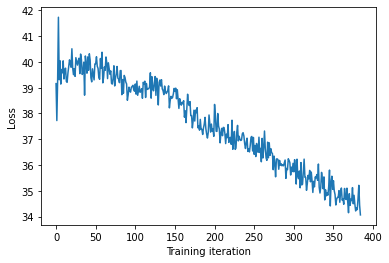






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.12it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.12it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.12it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.31it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.31it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.31it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.94it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.94it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.94it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 16.35it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.370211810290927
Proportion of valid SMILES: 0.8


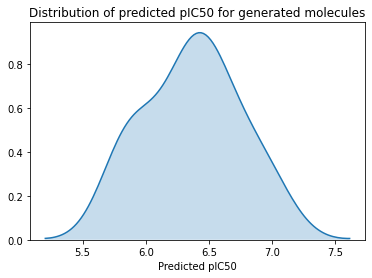






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCN(CC)S(=O)(=O)c1cccc2c1CCN(C(=O)OC(C)(C)C)C2
CCOC(=O)C(C)(C)NC(=O)C1(Nc2ccccc2)CCC(C)C1
CN(C)C1c2ccccc2-c2nc(COc3ccccc3)ccc21
COc1ccccc1NC(=O)c1ccccc1Cl
CSC1=C(c2ccccc2)C(=O)N(C)C1=O







Policy gradient...:  20%|██        | 1/5 [00:07<00:28,  7.23s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:21,  7.25s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:14,  7.35s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.35s/it]




Policy gradient...: 100%|██████████| 5/5 [00:36<00:00,  7.38s/it]


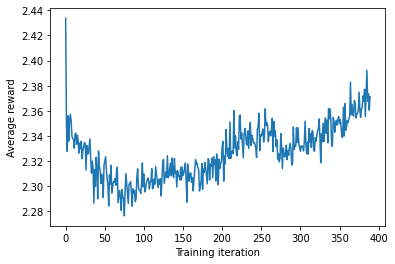

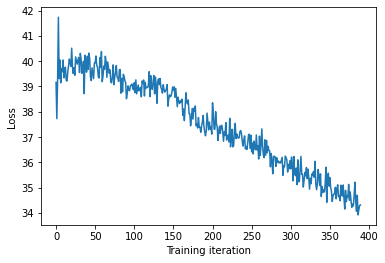






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 19.01it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 19.01it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 19.01it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.13it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.13it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.13it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.54it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.54it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.54it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 14.72it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.4268669192609975
Proportion of valid SMILES: 0.7


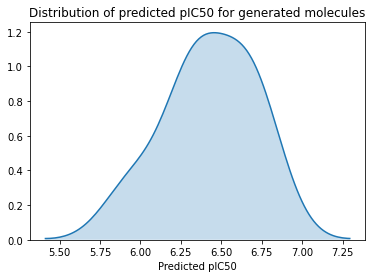






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)c1cccc(S(=O)(=O)NC2CCN(c3ccncc3)CC2)c1
CCOCCOC1CCC(Nc2nccc(-c3ccccc3)n2)CC1
CCc1ccccc1-c1nc(N2CCOCC2)c(C)n1C
COc1ccc(C2CCN(CCCNC(=O)Nc3c(C)ncn3C)C2)cc1
Cc1cccc(C(=O)OCC(=O)Nc2ccccc2)c1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.53s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.58s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:14,  7.40s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.36s/it]




Policy gradient...: 100%|██████████| 5/5 [00:36<00:00,  7.40s/it]


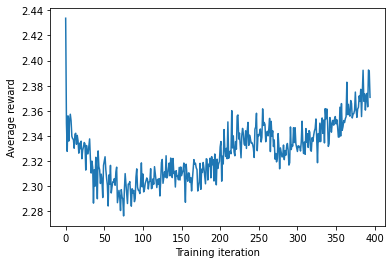

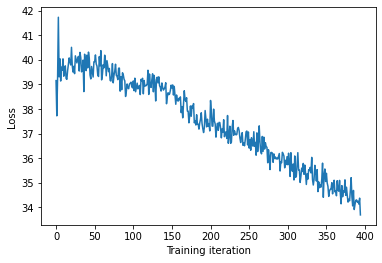






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:01,  7.88it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:01,  7.88it/s]




Generating molecules...:  10%|█         | 1/10 [00:00<00:01,  7.88it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00,  8.72it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00,  8.72it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00,  8.72it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00,  9.93it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00,  9.93it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00,  9.93it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 10.37it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 10.37it/s]




Generating molecules...:  70%|███████   | 7/10 [

Mean value of predictions: 6.476859976596496
Proportion of valid SMILES: 0.8


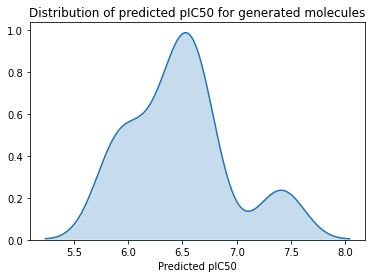






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCCc1cccc(-c2nc3[n+](cc4ccccc4n2)CCNCCn(C(C)C)N3CC=CC(=O)c2ccccc2Cl)c1
CCCc1ccccc1OCC(O)COc1cccc(-c2ccccc2C)c1
CN(C)CC1=CC(=O)c2cc(-c3ccoc3)c(-c3ccccc3)nc2C1=O
COc1ccc(C=CC(=O)Nc2ccc3oc(C)cc3c2C)cc1
COc1ccccc1C(=O)Nc1ccccc1C







Policy gradient...:  20%|██        | 1/5 [00:07<00:29,  7.27s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:21,  7.29s/it]




Policy gradient...:  60%|██████    | 3/5 [00:21<00:14,  7.27s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.38s/it]




Policy gradient...: 100%|██████████| 5/5 [00:36<00:00,  7.38s/it]


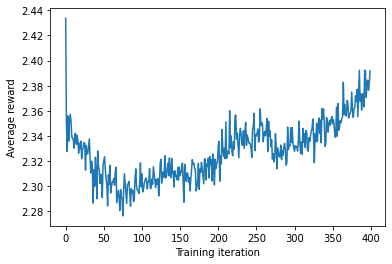

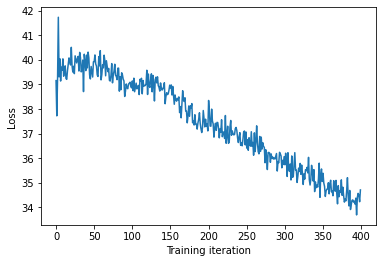






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.42it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.42it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 11.79it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 11.79it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 11.79it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 12.44it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 12.44it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 12.44it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 13.88it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 13.88it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00

Mean value of predictions: 6.580881304241536
Proportion of valid SMILES: 0.7


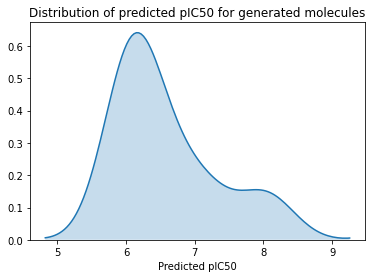






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCC(C)(C)c1nc(C)cc(N(C)C)c1C
CCNc1cc(C2=NC(=O)CC2N)cc(N2CCCC2)c1
CCc1ccc(S(=O)(=O)N2CCCC2CN2NC(=O)CC2c2cccnc2)cc1
COC(=O)c1ccc(C(=O)Nc2cccc(Cl)c2)cc1
Cc1ccc(CNC(Cc2ccc(-c3ccnc(C(C)C)n3)nn2)NC(CCCC#N)CC(=O)O)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.75s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:22,  7.57s/it]




Policy gradient...:  60%|██████    | 3/5 [00:21<00:14,  7.38s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.38s/it]




Policy gradient...: 100%|██████████| 5/5 [00:36<00:00,  7.21s/it]


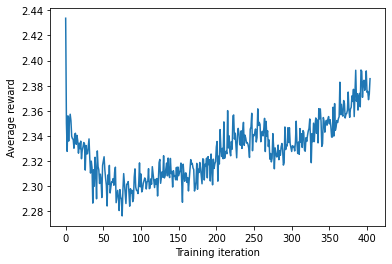

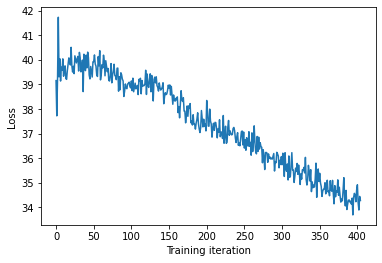






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.69it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.69it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.69it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.69it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 16.54it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 16.54it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 16.54it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 16.54it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 17.16it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 17.16it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.403807268424855
Proportion of valid SMILES: 0.7


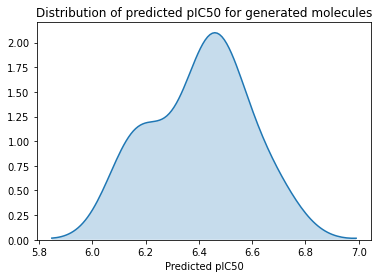






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)Nc1ccc(n2cc(C)nn2)c(SC(C)C(C)C)c1
CC(C)CC(NC(=O)OCc1ccccc1)C(=O)NC1CCCCC1
CCC1(COC)CCCN1c1ccccn1
CCN(CC)CCOc1ccc(C2CCCN2C)cc1
CCN(CC)Cc1ccccc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.52s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:22,  7.40s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:14,  7.43s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.45s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.40s/it]


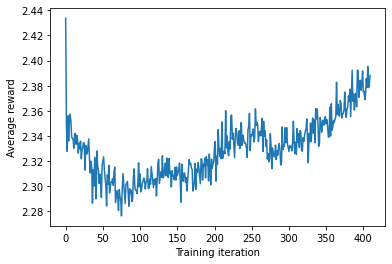

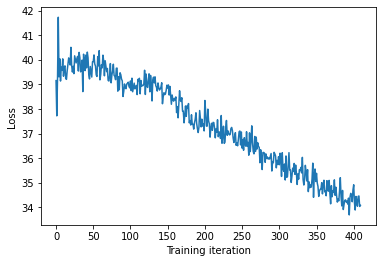






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 16.91it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 16.91it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 16.91it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 16.32it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 16.32it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 16.32it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 16.32it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 17.18it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 17.18it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 17.

Mean value of predictions: 6.409939003442649
Proportion of valid SMILES: 0.7


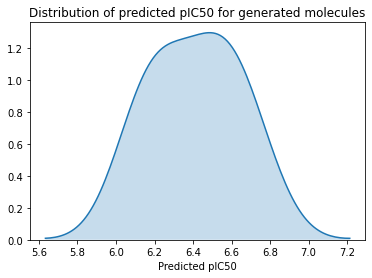






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCc1ccccc1NC(=O)OCc1ccccc1
CN1CCC(n2ccc3c(N)nc(-c4ccccc4)cc32)CC1
COc1ccc(C)cc1OCC(=O)NNC(=O)CCc1ccccc1
COc1ccccc1Cc1nc(CNc2ccccc2)nc(N2CCOCC2)n1
CSCC1NC(=O)C2CCCCC=CCCCN(CCN(CCO)CCCCCCCCCC3COC(C)(C)C3)C(O1)C(O)C2O







Policy gradient...:  20%|██        | 1/5 [00:07<00:29,  7.35s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:21,  7.32s/it]




Policy gradient...:  60%|██████    | 3/5 [00:21<00:14,  7.27s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.35s/it]




Policy gradient...: 100%|██████████| 5/5 [00:36<00:00,  7.27s/it]


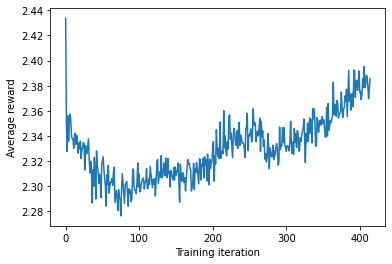

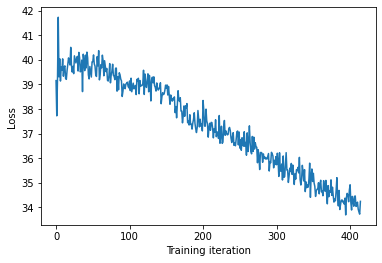






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 18.35it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 18.35it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 18.35it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 17.74it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 17.74it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 17.74it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.91it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.91it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.91it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00:00, 16.

Mean value of predictions: 6.3913165108333105
Proportion of valid SMILES: 0.8


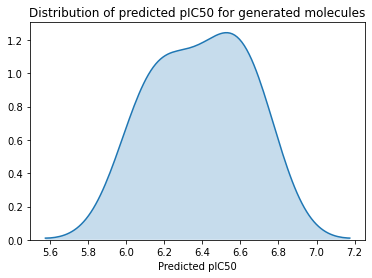






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCOS(=O)(=O)CCCNC(=O)c1ccccn1
CN1CCC(c2ccccc2)C1
COCCNCc1nc2ccccc2o1
COc1ccc(C2C(=S)NC(NC(=O)c3ccccc3)C(=O)N2C)cc1
COc1ccccc1N1CCN(C(=O)OC2CCCCC2)CC1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.67s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:22,  7.48s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:14,  7.47s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.54s/it]




Policy gradient...: 100%|██████████| 5/5 [00:36<00:00,  7.39s/it]


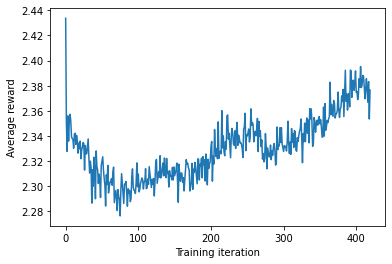

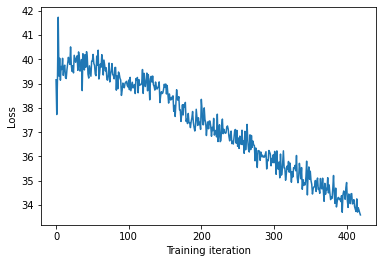






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.15it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.15it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.15it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.08it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.08it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.08it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.25it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.25it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.25it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 15.46it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.37049994988161
Proportion of valid SMILES: 0.8


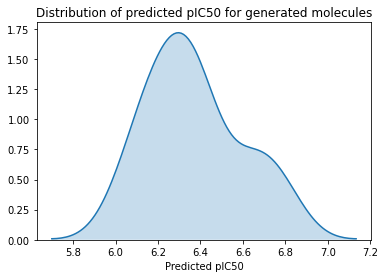






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCOc1ccccc1N1CCN(C(=O)C(C)C)CC1
CCn1nc(C)cc1CNCC(O)COc1ccccc1
CN1CCN(C(c2ccccc2)c2ccc(Cl)cc2)CC1
CSC1=C(C#N)C(=O)C(C)N(CCCCCC(=O)O)C1=O
NC1=NC(N2CCCCCC2)C(=O)N1







Policy gradient...:  20%|██        | 1/5 [00:07<00:29,  7.41s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:22,  7.38s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:14,  7.47s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.47s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.54s/it]


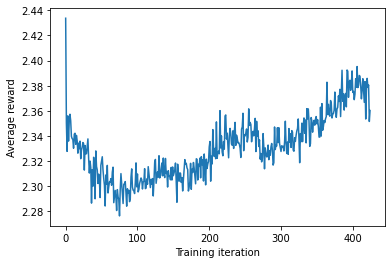

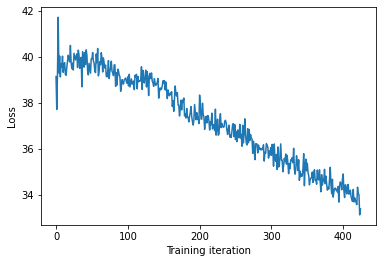






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.34it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.34it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 14.34it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.24it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.24it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.24it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.98it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.98it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.98it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 15.91it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.800954345205658
Proportion of valid SMILES: 0.7


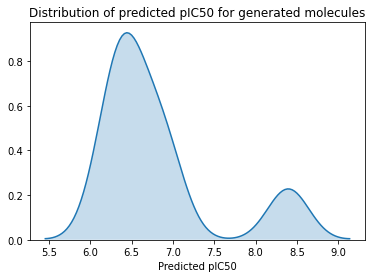






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)N1CCN(S(=O)(=O)c2c(C)ccc3ccc(C)cc23)CC1
CC(CCCCCCCCCC=Cc1ccccc1)C(=O)NC(Cc1ccccc1)c1ccccc1
CCc1ccc(CNC(C)Cc2ccccc2)cc1
CN1CCN(C(=O)c2ccc(Cl)c(Cl)c2)CC1
Cc1ccc(C(C)(C)NC(=O)NCCCCCN)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:29,  7.40s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:22,  7.46s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:14,  7.45s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.49s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.53s/it]


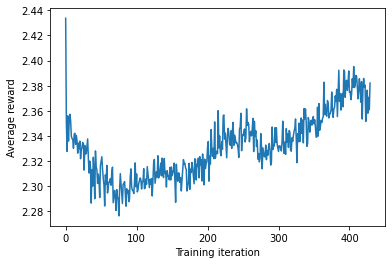

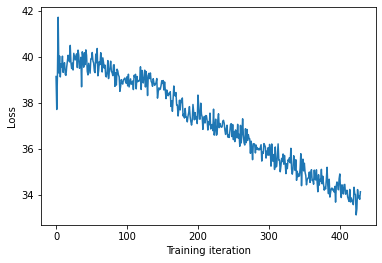






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.61it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.61it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.61it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.39it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.39it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.39it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.11it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.11it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.11it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 14.54it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.482562109582203
Proportion of valid SMILES: 0.8


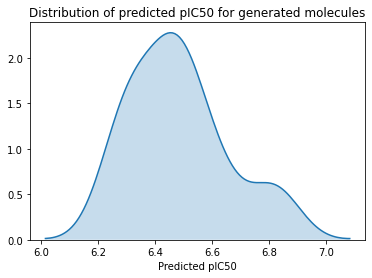






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)NC(CC(C)C)C(=O)NCc1ccccc1
CC(=O)NC(CC(C)C)C1CCc2ccccc2C1
CC1=C(S(=O)(=O)NC(=S)NCCNc2cc(F)cc(F)c2F)CCC(C)CN(C(C)C)CC1
CCC(C)CN1CCN(c2ccc(C3CCCN3C(=O)C(C)CCC(=O)O)cc2)CC1
CCCCC(C)N(C(=O)CNC(=O)C1c2ccccc(O2)-c2ccccc21)C(=O)OCCN(C)C







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.62s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.61s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.60s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.57s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.47s/it]


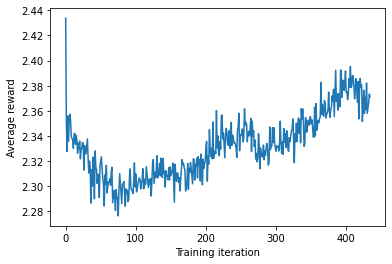

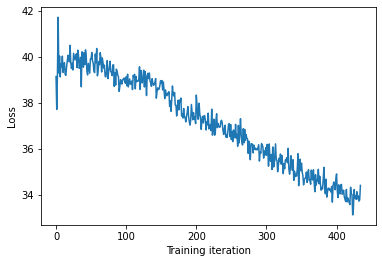






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 19.64it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 19.64it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 19.64it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 18.21it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 18.21it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 18.21it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 18.08it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 18.08it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 18.08it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 18.34it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.255926347918726
Proportion of valid SMILES: 0.8


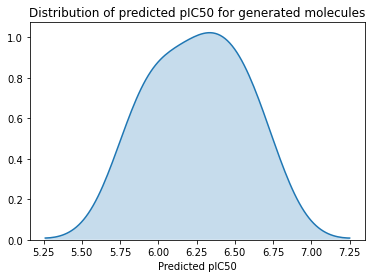






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
C=CCNc1ccccc1-c1ccccc1OC
CC(CCC=C1CCCCC1)C(=O)NCCCN
CC(CO)N1CCN(C(=O)N2CCCC2)CC1
CCNC(=O)N1CCN(c2cnccc2Cl)CC1
CCOC(=O)N1C=C(c2ccccc2)C(Nc2ccccc2OC)=C(O)C1=O







Policy gradient...:  20%|██        | 1/5 [00:07<00:29,  7.26s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:21,  7.29s/it]




Policy gradient...:  60%|██████    | 3/5 [00:21<00:14,  7.20s/it]




Policy gradient...:  80%|████████  | 4/5 [00:28<00:07,  7.21s/it]




Policy gradient...: 100%|██████████| 5/5 [00:36<00:00,  7.28s/it]


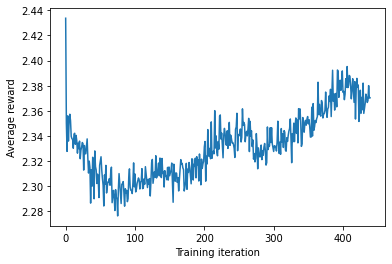

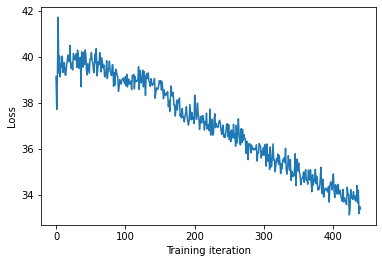






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.98it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.98it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 13.98it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.50it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.50it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 13.50it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.65it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.65it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 13.65it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 14.35it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.514152179290356
Proportion of valid SMILES: 0.7


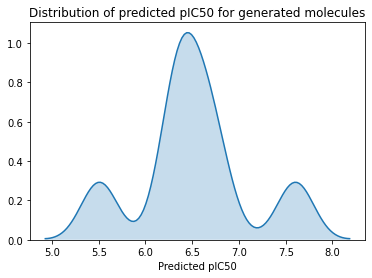






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
C=CCOCCOCCCn1ccnc1CC
CC1=C(C(c2ccccc2)c2ccccc2)C(=O)Nc2ccccc21
CCOC(=O)c1cccc(C(=O)NCCCN2CCOCC2)c1
COc1ccccc1CNCCC(=O)Nc1ccccc1
COc1ccccc1N(C)CC1CCCCN1S(=O)(=O)c1cccc(C(F)(F)F)c1







Policy gradient...:  20%|██        | 1/5 [00:07<00:29,  7.46s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:22,  7.39s/it]




Policy gradient...:  60%|██████    | 3/5 [00:21<00:14,  7.36s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.30s/it]




Policy gradient...: 100%|██████████| 5/5 [00:36<00:00,  7.33s/it]


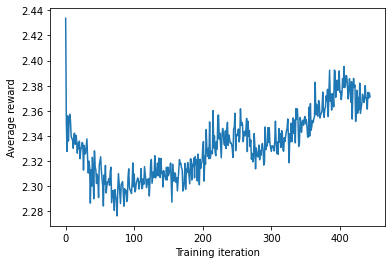

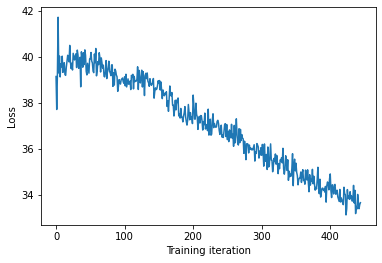






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.26it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.26it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.26it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.26it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 18.00it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 18.00it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 18.00it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 16.32it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 16.32it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 16.32it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00

Mean value of predictions: 6.4044266174202225
Proportion of valid SMILES: 0.7


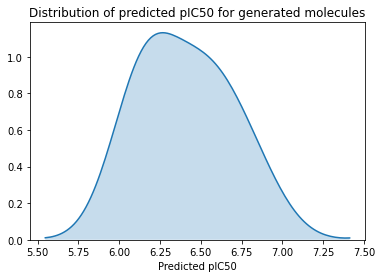






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)NC(C(=O)Nc1cccc(C(F)(F)F)c1)c1ccc(NC(=N)N)cc1
CC(Cc1ccccc1)OC(=O)C(Cc1ccccc1)NC(=O)C1CCCN1
CCCCc1cccc2ccccc12
COC1COC(C)(C)C1NCCCc1ccccc1
Cc1ccc(COc2ccccc2)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:28,  7.08s/it]




Policy gradient...:  40%|████      | 2/5 [00:13<00:21,  7.03s/it]




Policy gradient...:  60%|██████    | 3/5 [00:21<00:14,  7.15s/it]




Policy gradient...:  80%|████████  | 4/5 [00:28<00:07,  7.20s/it]




Policy gradient...: 100%|██████████| 5/5 [00:36<00:00,  7.25s/it]


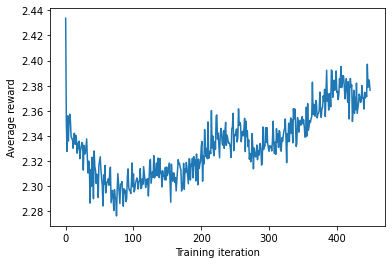

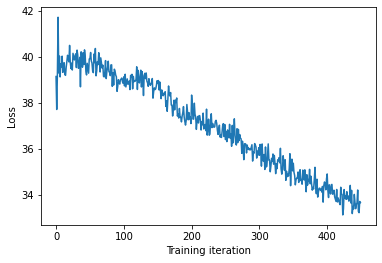






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.79it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.79it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 15.79it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.29it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.29it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.29it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.60it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.60it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.60it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 15.90it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.500384108172126
Proportion of valid SMILES: 0.8


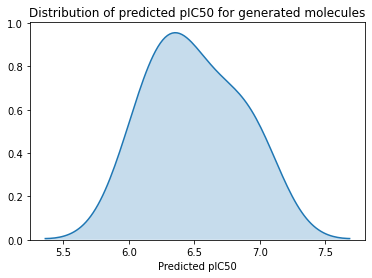






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)Nc1ccccc1CCOc1ccccc1
CCC(C)C(C)(NC(=O)c1ccccn1)C(=O)F
CCCN1N=C(C(=O)C=Cc2ccc(F)c(Cl)c2)n2cc(-c3ccccc3)cc21
CCOC(=O)N1CCN(Cc2ccc(OC)cc2)CCC(Cc2ccccc2)C1
CN1C(=O)Nc2ccccc21







Policy gradient...:  20%|██        | 1/5 [00:06<00:27,  6.82s/it]




Policy gradient...:  40%|████      | 2/5 [00:13<00:20,  6.92s/it]




Policy gradient...:  60%|██████    | 3/5 [00:21<00:14,  7.06s/it]




Policy gradient...:  80%|████████  | 4/5 [00:28<00:07,  7.03s/it]




Policy gradient...: 100%|██████████| 5/5 [00:35<00:00,  7.08s/it]


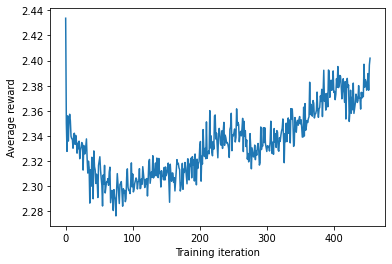

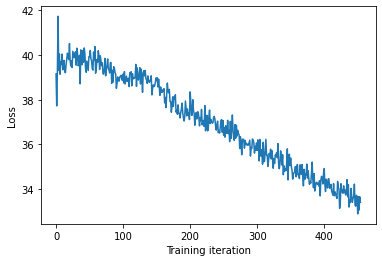






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 19.59it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 19.59it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 19.59it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 19.59it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 18.70it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 18.70it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 18.70it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.30it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.30it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 17.30it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00

Mean value of predictions: 6.341434330553998
Proportion of valid SMILES: 0.8


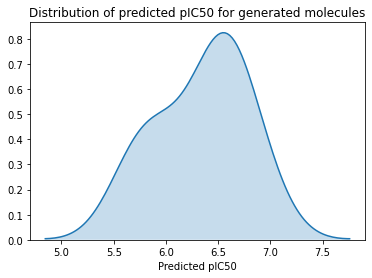






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
COC(=O)Nc1ccccc1
COC1C(O)CCC2(O)C(OC(C)=O)OC3CC(=O)C(O)CC3C2C1C(C)=O
COCCN1CCN(C(=O)C(Cc2ccccc2)NC(C)=O)CC1
COc1ccc(-c2c(C3CCC(NC(C)=O)CC3)nn3ccccc23)cc1
COc1ccccc1NC(=O)Nc1ccccc1







Policy gradient...:  20%|██        | 1/5 [00:06<00:27,  6.97s/it]




Policy gradient...:  40%|████      | 2/5 [00:13<00:20,  6.91s/it]




Policy gradient...:  60%|██████    | 3/5 [00:21<00:14,  7.06s/it]




Policy gradient...:  80%|████████  | 4/5 [00:28<00:07,  7.12s/it]




Policy gradient...: 100%|██████████| 5/5 [00:35<00:00,  7.14s/it]


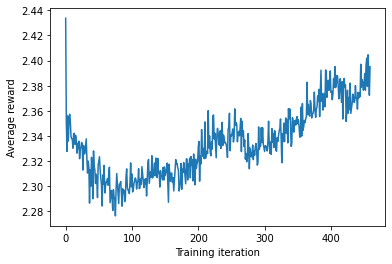

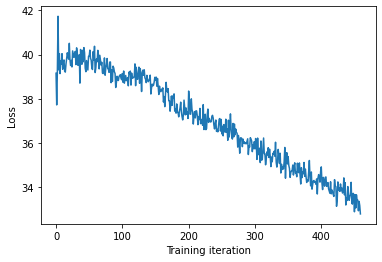






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 19.71it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 19.71it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 19.71it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 18.19it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 18.19it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 18.19it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.89it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.89it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.89it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 16.58it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.344361211270726
Proportion of valid SMILES: 0.8


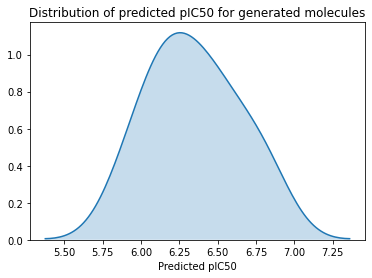






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)(C)c1cccc(C(=O)CCCOO)c1
CCCCNC(=O)NCC1CCCCN1Cc1ccccc1
CCOC(=O)CN1CCc2ccccc21
CNc1cccc(N2CCNCC2)c1
COCCN(C)C(=O)CCC(=O)N1CCCCC1







Policy gradient...:  20%|██        | 1/5 [00:06<00:27,  6.90s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:20,  7.00s/it]




Policy gradient...:  60%|██████    | 3/5 [00:21<00:14,  7.12s/it]




Policy gradient...:  80%|████████  | 4/5 [00:28<00:07,  7.15s/it]




Policy gradient...: 100%|██████████| 5/5 [00:35<00:00,  7.13s/it]


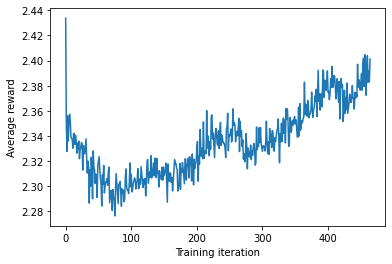

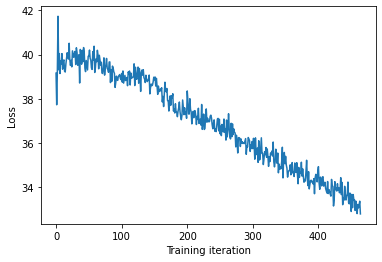






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.26it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.26it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 16.26it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.39it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.39it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 16.39it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.35it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.35it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 16.35it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 16.82it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.429753705372874
Proportion of valid SMILES: 0.7


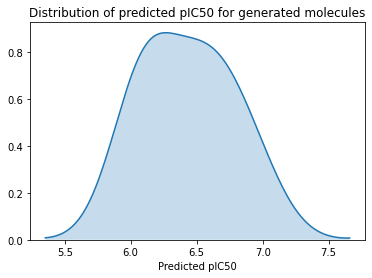






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)N1CC(c2ccc(N(=O)=O)cc2)CN1C(=O)NCCO
CC(C)c1ccc(S(=O)(=O)NC(C(C)C)C2CCCCCCC2)cc1
CC(C=CCCCCCC(=O)O)c1ccccc1
COCc1cccc(-c2ccc3cc(-c4ccc(C)nc4)cnc3c2)c1
COc1ccc(N2CC(=O)Nc3cc(OC(C)(C)C)ccc32)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:28,  7.05s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:21,  7.16s/it]




Policy gradient...:  60%|██████    | 3/5 [00:21<00:14,  7.04s/it]




Policy gradient...:  80%|████████  | 4/5 [00:28<00:07,  7.05s/it]




Policy gradient...: 100%|██████████| 5/5 [00:35<00:00,  7.13s/it]


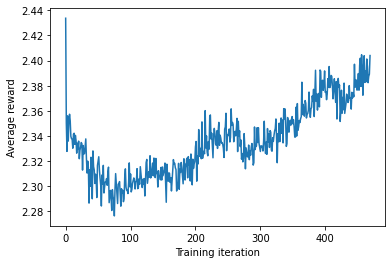

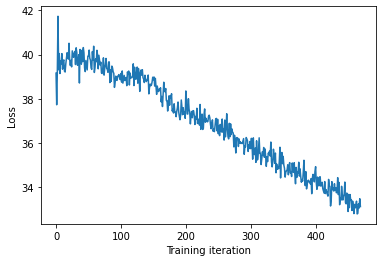






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 20.88it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 20.88it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 20.88it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 18.67it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 18.67it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 18.67it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 18.53it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 18.53it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 18.53it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00:00, 18.

Mean value of predictions: 6.356523206284088
Proportion of valid SMILES: 0.8


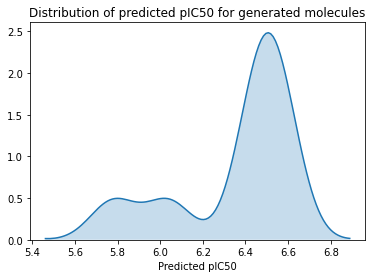






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC1=CC(=O)N=C(N2CCCCC2)N1
CC=CCC(=O)NC1CCCN(c2cnn(CCOC)c2Cl)C1
CCCCCC(C)C(=O)OC1CCN(C(CCC(C)C)C(=O)O)CC1
CCNC(C(=O)OCC)c1ccccc1
COc1ccc(N2C(=S)NN=C2C(C)=O)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:30,  7.61s/it]




Policy gradient...:  40%|████      | 2/5 [00:15<00:22,  7.62s/it]




Policy gradient...:  60%|██████    | 3/5 [00:22<00:15,  7.59s/it]




Policy gradient...:  80%|████████  | 4/5 [00:30<00:07,  7.55s/it]




Policy gradient...: 100%|██████████| 5/5 [00:37<00:00,  7.48s/it]


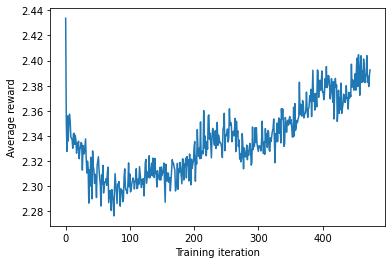

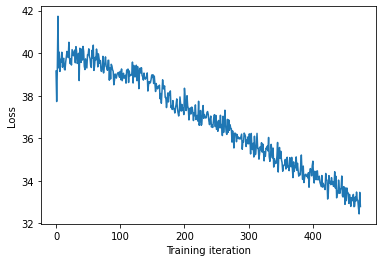






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 22.35it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 22.35it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 22.35it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 20.26it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 20.26it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 20.26it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 19.65it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 19.65it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 19.65it/s]




Generating molecules...:  90%|█████████ | 9/10 [00:00<00:00, 17.

Mean value of predictions: 6.338127953291588
Proportion of valid SMILES: 0.7


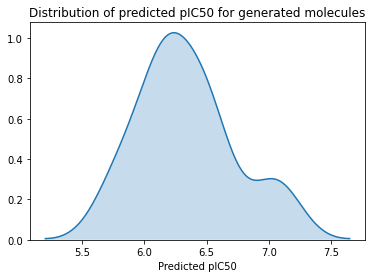






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(C)c1ccc(Cl)cc1NC(=O)Nc1ccccc1c1ccccc1
CCCc1ccccc1
CCN(CC)CCc1ccc(Cl)cc1
COC(=O)C=Cc1ccc(Oc2c(C)cccc2C)cc1
COc1ccccc1N1CCN(C(=O)NCc2ccn[nH]2)CC1







Policy gradient...:  20%|██        | 1/5 [00:07<00:28,  7.11s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:21,  7.05s/it]




Policy gradient...:  60%|██████    | 3/5 [00:21<00:14,  7.08s/it]




Policy gradient...:  80%|████████  | 4/5 [00:28<00:07,  7.11s/it]




Policy gradient...: 100%|██████████| 5/5 [00:35<00:00,  7.08s/it]


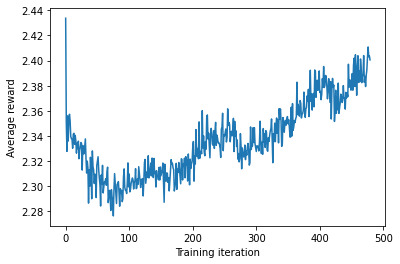

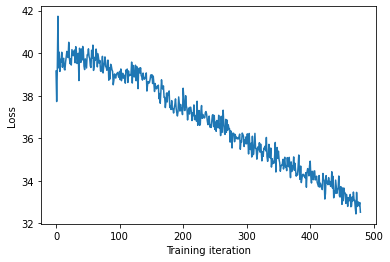






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.94it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.94it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.94it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.94it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 17.72it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 17.72it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 17.72it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 17.72it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 17.50it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 17.50it/s]




Generating molecules...: 100%|██████████| 10/10 [00:00<0

Mean value of predictions: 6.441997751542159
Proportion of valid SMILES: 0.8


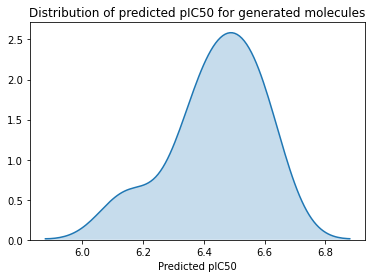






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CCNc1ncnc2c1cnn2Cc1cc(OC)ccc1Br
CCOC(=O)C1=C(C)NC(C)=C(C(=O)OC)C1c1ccc(Cl)cc1
CCOC(=O)Cc1ccccc1Cl
COc1ccc(C2=CC(=O)Nc3ccccc32)cc1
COc1ccc(C2=CC3=C(Cc4ccc(Cl)cc4)C(=O)C(O)=C3C2)cc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:28,  7.15s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:21,  7.19s/it]




Policy gradient...:  60%|██████    | 3/5 [00:21<00:14,  7.19s/it]




Policy gradient...:  80%|████████  | 4/5 [00:28<00:07,  7.10s/it]




Policy gradient...: 100%|██████████| 5/5 [00:35<00:00,  7.15s/it]


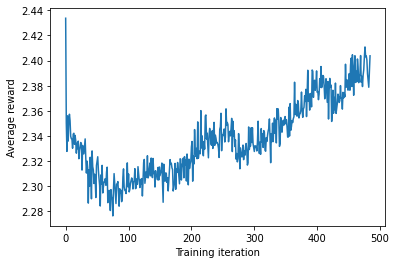

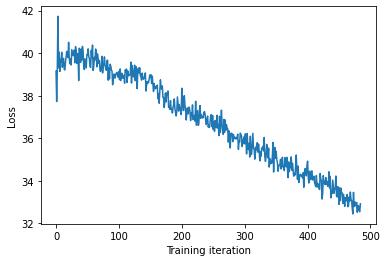






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 21.37it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 21.37it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 21.37it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 20.79it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 20.79it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 20.79it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 20.79it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 19.64it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 19.64it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 19.

Mean value of predictions: 6.335813193674163
Proportion of valid SMILES: 0.8


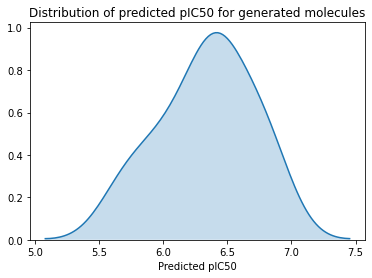






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=O)Nc1ccc(-c2ccncc2)cc1
CCCCCCN
CCCOC(=O)C1SC(N)C(=O)N1Cc1ccccc1
CCOc1ccc(N2C(=O)CSC2=S)cc1
CN1Sc2ccccc2C(=O)N1CCCCCCCNC(=O)Nc1cccc(C2(c3ccc(-c4ccccc4)nc3)CC2)c1







Policy gradient...:  20%|██        | 1/5 [00:06<00:27,  6.97s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:21,  7.10s/it]




Policy gradient...:  60%|██████    | 3/5 [00:21<00:14,  7.07s/it]




Policy gradient...:  80%|████████  | 4/5 [00:28<00:07,  7.07s/it]




Policy gradient...: 100%|██████████| 5/5 [00:35<00:00,  7.12s/it]


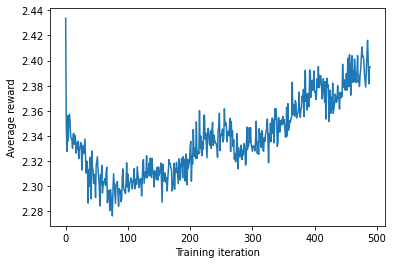

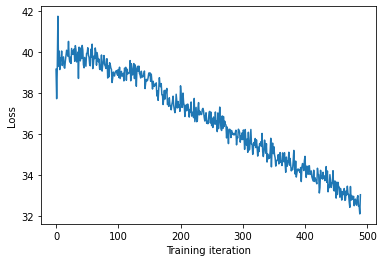






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.90it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.90it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 12.90it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.00it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.00it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 14.00it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.77it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.77it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 14.77it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 14.82it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.551887462868852
Proportion of valid SMILES: 0.7


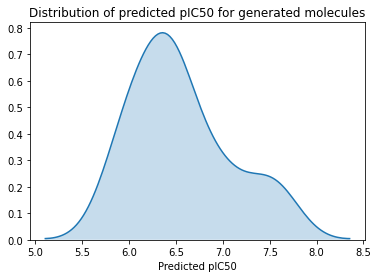






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(c1ccccc1)c1ncc(N2CCCC2)cn1
CCCN1CCN(C(=O)c2cccc(-c3ccccc3F)c2)CC1
CCOC(=O)Nc1cccc(-c2cccnc2)c1
COc1ccc(C(=O)CSC2=NCCCN2)cc1
Cc1ccccc1Co1nccc1NC(=O)Cc1ccccc1







Policy gradient...:  20%|██        | 1/5 [00:07<00:29,  7.39s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:22,  7.45s/it]




Policy gradient...:  60%|██████    | 3/5 [00:21<00:14,  7.30s/it]




Policy gradient...:  80%|████████  | 4/5 [00:29<00:07,  7.27s/it]




Policy gradient...: 100%|██████████| 5/5 [00:36<00:00,  7.31s/it]


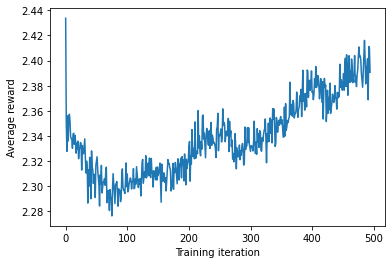

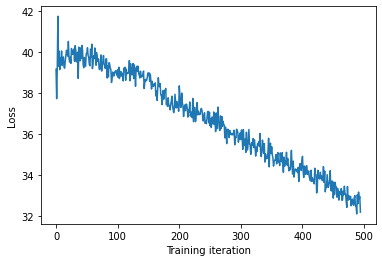






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.72it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.72it/s]




Generating molecules...:  20%|██        | 2/10 [00:00<00:00, 17.72it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.76it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.76it/s]




Generating molecules...:  40%|████      | 4/10 [00:00<00:00, 15.76it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.26it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.26it/s]




Generating molecules...:  60%|██████    | 6/10 [00:00<00:00, 15.26it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00:00, 15.59it/s]




Generating molecules...:  80%|████████  | 8/10 [00:00<00

Mean value of predictions: 6.314549547853535
Proportion of valid SMILES: 0.7


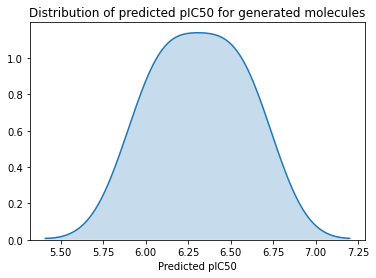






Policy gradient...:   0%|          | 0/5 [00:00<?, ?it/s]

Sample trajectories:
CC(=CC1C2OC(C)(C)CCC12CC1=NCCCC1)CC(C)C
CC(C)(C)NC(=O)COC(=O)Nc1ccccc1
COc1cc2c(cc1OC)-c1ccccc1NC(=O)C2
COc1ccc(CNc2nnc(C3CCCCC3)c3ccccc23)cc1
Cc1cccc(C2CCSC2)c1







Policy gradient...:  20%|██        | 1/5 [00:07<00:29,  7.31s/it]




Policy gradient...:  40%|████      | 2/5 [00:14<00:21,  7.23s/it]




Policy gradient...:  60%|██████    | 3/5 [00:21<00:14,  7.21s/it]




Policy gradient...:  80%|████████  | 4/5 [00:28<00:07,  7.12s/it]




Policy gradient...: 100%|██████████| 5/5 [00:35<00:00,  7.07s/it]


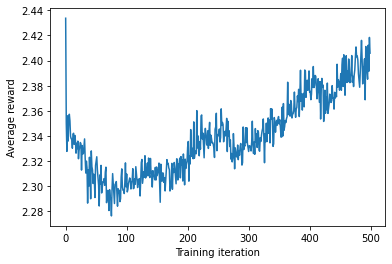

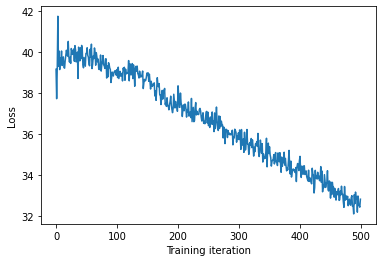






  0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:   0%|          | 0/10 [00:00<?, ?it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 24.14it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 24.14it/s]




Generating molecules...:  30%|███       | 3/10 [00:00<00:00, 24.14it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 22.51it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 22.51it/s]




Generating molecules...:  50%|█████     | 5/10 [00:00<00:00, 22.51it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 19.74it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 19.74it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 19.74it/s]




Generating molecules...:  70%|███████   | 7/10 [00:00<00:00, 19.

Mean value of predictions: 6.290793811440912
Proportion of valid SMILES: 0.8


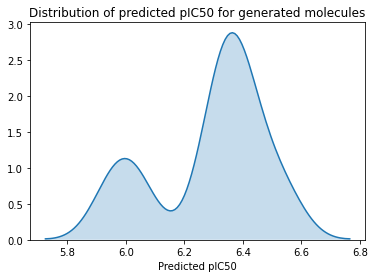

Sample trajectories:
CC(C)NC(=O)c1ccccc1N1CCN(C)CC1
CC1CCCCCN1C(=O)Nc1ccccc1
CC1OCCOC2(C)CCC(C)(C)CC12
CCCCC1CCCCC1CC(O)COc1ccccc1
COCCNC(=O)c1sccc1N


In [ ]:
for i in range(n_iterations):
    for j in trange(n_policy, desc='Policy gradient...'):
        cur_reward, cur_loss = RL_min.policy_gradient(gen_data, get_features=get_fp)
        rewards_min.append(simple_moving_average(rewards_min, cur_reward)) 
        rl_losses_min.append(simple_moving_average(rl_losses_min, cur_loss))
    
    plt.plot(rewards_min)
    plt.xlabel('Training iteration')
    plt.ylabel('Average reward')
    plt.show()
    plt.plot(rl_losses_min)
    plt.xlabel('Training iteration')
    plt.ylabel('Loss')
    plt.show()
        
    smiles_cur, prediction_cur = estimate_and_update(RL_min.generator, 
                                                     my_predictor, 
                                                     n_to_generate)
    print('Sample trajectories:')
    for sm in smiles_cur[:5]:
        print(sm)

เอาต์พุตของการสตรีมมีการตัดเหลือเพียง 5000 บรรทัดสุดท้าย



Generating molecules...:  93%|█████████▎| 9306/10000 [08:55<00:38, 18.03it/s]




Generating molecules...:  93%|█████████▎| 9306/10000 [08:55<00:38, 18.03it/s]




Generating molecules...:  93%|█████████▎| 9306/10000 [08:55<00:38, 18.03it/s]




Generating molecules...:  93%|█████████▎| 9308/10000 [08:55<00:40, 17.16it/s]




Generating molecules...:  93%|█████████▎| 9308/10000 [08:55<00:40, 17.16it/s]




Generating molecules...:  93%|█████████▎| 9308/10000 [08:55<00:40, 17.16it/s]




Generating molecules...:  93%|█████████▎| 9310/10000 [08:55<00:42, 16.42it/s]




Generating molecules...:  93%|█████████▎| 9310/10000 [08:55<00:42, 16.42it/s]




Generating molecules...:  93%|█████████▎| 9310/10000 [08:55<00:42, 16.42it/s]




Generating molecules...:  93%|█████████▎| 9312/10000 [08:55<00:41, 16.53it/s]




Generating molecules...:  93%|█████████▎| 9312/10000 [08:55<00:41, 16.53it/s]




Generating molecules...:  93%|████████

Mean value of predictions: 6.386419528705184
Proportion of valid SMILES: 0.824


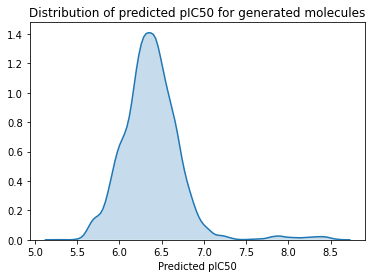

In [ ]:
smiles_biased_min, prediction_biased_min = estimate_and_update(RL_min.generator, 
                                                           my_predictor,
                                                           n_to_generate=10000)

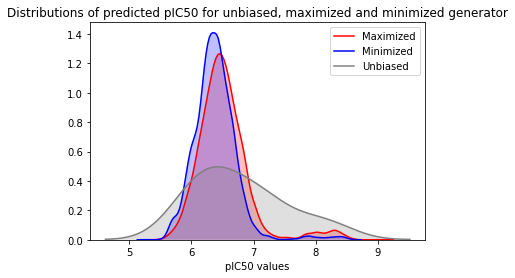

In [ ]:
sns.kdeplot(prediction_biased_max, label='Maximized', shade=True, color='red')
sns.kdeplot(prediction_biased_min, label='Minimized', shade=True, color='blue')
sns.kdeplot(prediction_unbiased, label='Unbiased', shade=True, color='grey')
plt.xlabel('pIC50 values')
plt.title('Distributions of predicted pIC50 for unbiased,' + 
          ' maximized and minimized generator')
plt.show()

## Drawing random molecules

Now we will draw some random compounds from the biased library:

In [ ]:
from rdkit.Chem.Draw import DrawingOptions
from rdkit.Chem import Draw
DrawingOptions.atomLabelFontSize = 50
DrawingOptions.dotsPerAngstrom = 100
DrawingOptions.bondLineWidth = 3

### Molecules with maximized pIC50

In [ ]:
generated_mols_max = [Chem.MolFromSmiles(sm, sanitize=True) for sm in smiles_biased_max]
sanitized_gen_mols_max = [generated_mols_max[i] 
                          for i in np.where(np.array(generated_mols_max) != None)[0]]

In [ ]:
n_to_draw = 20
ind = np.random.randint(0, len(sanitized_gen_mols_max), n_to_draw)
mols_to_draw_max = [sanitized_gen_mols_max[i] for i in ind]
legends = ['pIC50 = ' + str(prediction_biased_max[i]) for i in ind]

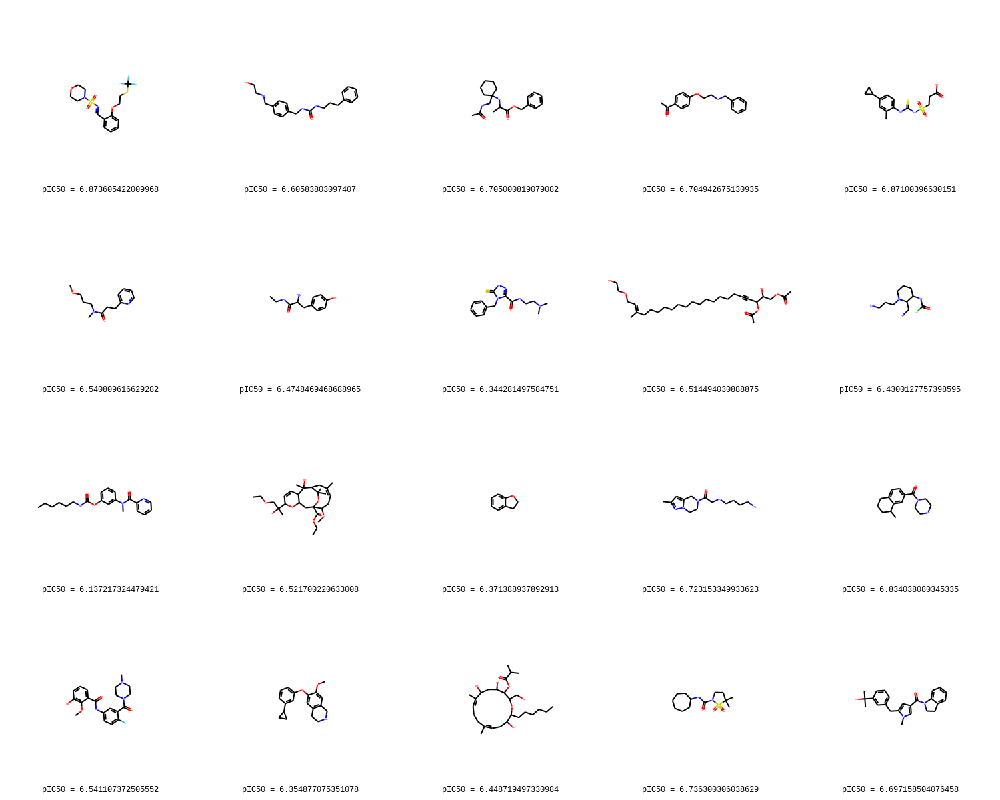

In [ ]:
Draw.MolsToGridImage(mols_to_draw_max, molsPerRow=5, 
                     subImgSize=(300,300), legends=legends)

### Molecules with minimized pIC50

In [ ]:
generated_mols_min = [Chem.MolFromSmiles(sm, sanitize=True) for sm in smiles_biased_min]
sanitized_gen_mols_min = [generated_mols_min[i] 
                          for i in np.where(np.array(generated_mols_min) != None)[0]]

In [ ]:
n_to_draw = 20
ind = np.random.randint(0, len(sanitized_gen_mols_min), n_to_draw)
mols_to_draw_min = [sanitized_gen_mols_min[i] for i in ind]
legends = ['pIC50 = ' + str(prediction_biased_min[i]) for i in ind]

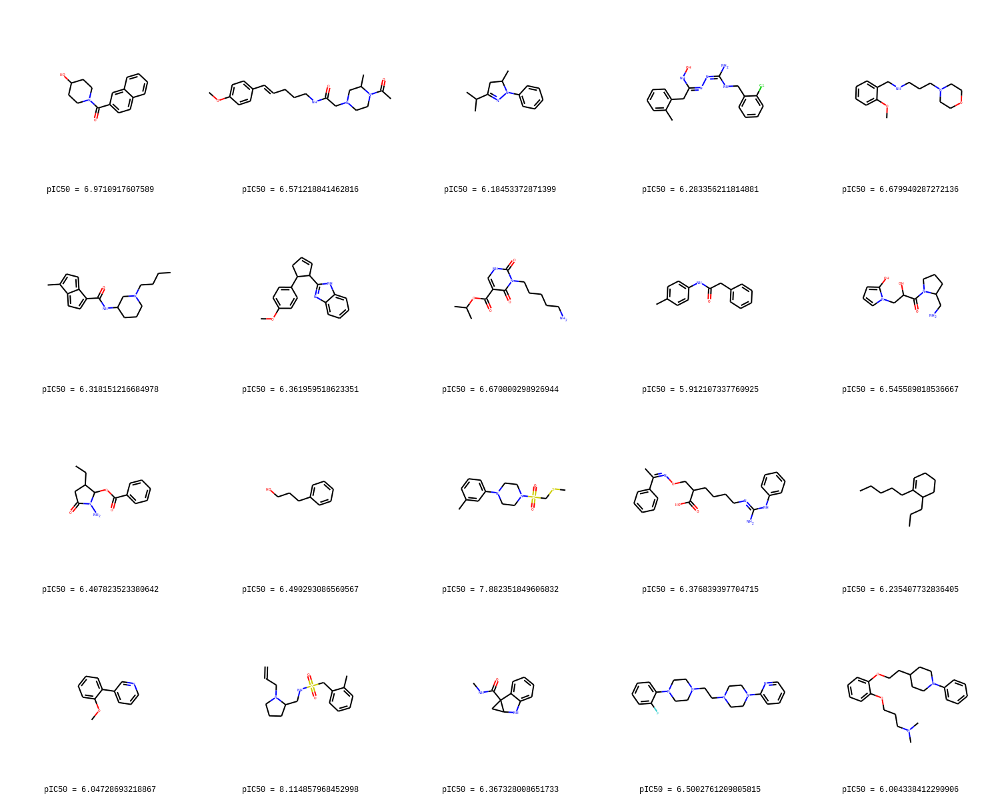

In [ ]:
Draw.MolsToGridImage(mols_to_draw_min, molsPerRow=5, 
                     subImgSize=(300,300), legends=legends)

In [178]:
!git status

On branch master
Your branch is up to date with 'origin/master'.

Changes not staged for commit:
  (use "git add <file>..." to update what will be committed)
  (use "git checkout -- <file>..." to discard changes in working directory)

	modified:   release/data.py

no changes added to commit (use "git add" and/or "git commit -a")
